In [1]:
from __future__ import print_function

In [2]:
import json
import operator
import collections
import re

In [3]:
import numpy as np
import pandas as pd

In [4]:
from gensim.models import word2vec

C:\Users\shashwat\Anaconda3\envs\opencv\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [168]:
from sklearn.manifold import TSNE

In [5]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline

In [6]:
# loading the dataset
trainrecipts = json.load(open('data/train.json','r'))

In [7]:
# all ingredients
raw_ingredients = list()

for recipt in trainrecipts:
    for ing in recipt[u'ingredients']:
        raw_ingredients.append(ing.strip())

In [8]:
#[print(i) for i in raw_ingredients]

romaine lettuce
black olives
grape tomatoes
garlic
pepper
purple onion
seasoning
garbanzo beans
feta cheese crumbles
plain flour
ground pepper
salt
tomatoes
ground black pepper
thyme
eggs
green tomatoes
yellow corn meal
milk
vegetable oil
eggs
pepper
salt
mayonaise
cooking oil
green chilies
grilled chicken breasts
garlic powder
yellow onion
soy sauce
butter
chicken livers
water
vegetable oil
wheat
salt
black pepper
shallots
cornflour
cayenne pepper
onions
garlic paste
milk
butter
salt
lemon juice
water
chili powder
passata
oil
ground cumin
boneless chicken skinless thigh
garam masala
double cream
natural yogurt
bay leaf
plain flour
sugar
butter
eggs
fresh ginger root
salt
ground cinnamon
milk
vanilla extract
ground ginger
powdered sugar
baking powder
olive oil
salt
medium shrimp
pepper
garlic
chopped cilantro
jalapeno chilies
flat leaf parsley
skirt steak
white vinegar
sea salt
bay leaf
chorizo sausage
sugar
pistachio nuts
white almond bark
flour
vanilla extract
olive oil
almond extrac

chicken
pitas
plum tomatoes
goat cheese
romaine lettuce
sesame seeds
gingerroot
soy sauce
sesame oil
cooked white rice
sugar
mirin
garlic cloves
rib eye steaks
black pepper
hot bean paste
onions
ground black pepper
okra
canola oil
tomatoes
yellow onion
garlic cloves
sea salt
ground coriander
ground cumin
water
cayenne pepper
flat leaf parsley
garbanzo beans
sea salt
medjool date
cumin
tumeric
shallots
cayenne pepper
coriander
diced bell pepper
potatoes
garlic
chopped cilantro
cream
lemon
smoked paprika
frozen peas
ground black pepper
reduced fat milk
smoked trout
large egg whites
large eggs
salt
fresh dill
parmigiano reggiano cheese
green onions
asparagus
cooking spray
canola oil
tumeric
fresh coriander
paprika
garlic puree
ghee
green cardamom pods
white onion
chicken breasts
salt
cinnamon sticks
sugar
fenugreek
ginger
garlic cloves
ground cumin
tomato purÃ©e
pepper
lemon
green chilies
coconut milk
pickled jalapeno peppers
water
romaine lettuce leaves
corn tortillas
crema mexicana
corn

turnips
white miso
sesame oil
sake
potatoes
garlic
dashi
green onions
carrots
seasoning
pork chops
ginger
ketchup
honey
Tabasco Pepper Sauce
freshly ground pepper
onions
kosher salt
unsalted butter
heavy cream
thyme
extra sharp cheddar cheese
molasses
ground black pepper
vegetable oil
garlic cloves
grits
chicken broth
cider vinegar
bourbon whiskey
cayenne pepper
chopped parsley
large shrimp
fresh tomatoes
diced tomatoes
onions
olive oil
garlic
tomato sauce
uncooked rigatoni
fresh basil
grating cheese
salt
chicken bouillon
garlic
long grain white rice
tomatoes
jalapeno chilies
onions
green bell pepper
vegetable oil
chopped cilantro fresh
chicken broth
pepper
salt
ground cumin
russet potatoes
cornmeal
flour
salt
fish fillets
old bay seasoning
vegetable oil
beer
seasoning
lime juice
green bell pepper, slice
lime wedges
salt
red bell pepper
sugar
garlic powder
chili powder
diced tomatoes
shredded cheese
onions
red chili powder
orange bell pepper
flour tortillas
shredded lettuce
salsa
sour 

olive oil
flour
salt
cumin
tomato paste
lime
jalapeno chilies
onion powder
smoked paprika
tomato sauce
garlic powder
boneless skinless chicken breasts
cayenne pepper
monterey jack
hoisin sauce
vegetable stock
rice vinegar
noodles
low sodium soy sauce
udon
red pepper flakes
carrots
tofu
extra firm tofu
butter
juice
orange zest
vegetables
broccoli florets
veggies
corn starch
ground cinnamon
lemon
dark brown sugar
crystallized ginger
cayenne pepper
pears
quatre Ã©pices
raisins
mustard seeds
apple cider vinegar
chopped onion
raw honey
ice
avocado
fresh mint
vanilla
sweetener
coconut milk
peaches
old-fashioned oats
salt
brown sugar
large eggs
butter
lemon juice
granulated sugar
baking powder
all-purpose flour
sugar
flour
vanilla extract
parmigiano-reggiano cheese
worcestershire sauce
garlic cloves
water
salt
fresh mint
baguette
extra-virgin olive oil
fresh lemon juice
eggs
ground black pepper
anchovy fillets
arugula
vegetable oil
crushed red pepper flakes
chicken legs
garlic
water
salt
bone

white wine
salted butter
fresh lemon juice
black pepper
olive oil
garlic
chicken stock
kosher salt
fresh parmesan cheese
flat leaf parsley
salt
pepper
tripe
white hominy
onions
chili powder
mild olive oil
grape tomatoes
chopped cilantro
green chile
corn tortillas
cheddar cheese
cumin
salt
parsley
lemon juice
tahini
chickpeas
garlic
butter
unsweetened cocoa powder
coffee granules
all-purpose flour
half & half
confectioners sugar
vanilla extract
baguette
ground black pepper
chopped fresh thyme
garlic cloves
fresh parsley
plain low-fat yogurt
sweet onion
harissa
salt
smoked paprika
ground cumin
pitted kalamata olives
olive oil
balsamic vinegar
ground coriander
red bell pepper
water
cooking spray
vegetable broth
fresh lemon juice
plum tomatoes
minced garlic
diced tomatoes
lemon rind
baby portobello mushrooms
cooking spray
purple onion
olive oil
basil
diced celery
grated parmesan cheese
crushed red pepper
carrots
unsalted butter
chanterelle
haricots verts
potatoes
pearl onions
chopped fresh

dried rosemary
green bell pepper
purple onion
feta cheese crumbles
eggs
almond extract
orange zest
baking powder
all-purpose flour
vegetable oil
white sugar
sliced almonds
salt
eggs
sugar
vanilla extract
vegetable oil cooking spray
peaches
all-purpose flour
firmly packed brown sugar
water
salt
ground cinnamon
slivered almonds
ice water
margarine
pepper
flour tortillas
sharp cheddar cheese
milk
salt
vegetable oil cooking spray
large eggs
all-purpose flour
fresh cilantro
baking powder
chicken
green bell pepper
pepper
bay leaves
cayenne pepper
cheddar cheese
dried thyme
salt
dried oregano
andouille sausage
water
green onions
celery
cooked rice
light red kidney beans
garlic powder
yellow onion
fish sauce
garlic cloves
ginger
sugar
fresh lime juice
thai chile
dried thyme
frozen pastry puff sheets
onions
sugar
unsalted butter
anchovy fillets
freshly grated parmesan
vegetable oil
dried rosemary
water
large eggs
brine-cured black olives
sugar
rice vinegar
bean thread vermicelli
shrimp
soy sauc

radishes
apples
scallions
anchovies
ginger
rice
onions
Korean chile flakes
napa cabbage
garlic
carrots
Splenda Brown Sugar Blend
tomato sauce
chili powder
corn starch
white vinegar
green bell pepper
jalapeno chilies
banana peppers
italian seasoning
tomato paste
water
diced tomatoes
red bell pepper
tomatoes
Anaheim chile
salt
onions
vanilla extract
almond extract
confectioners sugar
eggs
all-purpose flour
butter
white sugar
granulated sugar
cake flour
warm water
heavy cream
bittersweet chocolate
large eggs
confectioners sugar
hazelnuts
vanilla
liqueur
fresh rosemary
vegetable broth
aged balsamic vinegar
grated parmesan cheese
parsnips
chopped onion
arborio rice
butter
fish sauce
lettuce leaves
beansprouts
sliced green onions
water
cilantro leaves
chopped fresh mint
bean threads
shredded carrots
garlic cloves
rice paper
sugar
thai chile
fresh lime juice
ground cinnamon
cream cheese
refrigerated crescent rolls
white sugar
honey
Mexican vanilla extract
butter
water
sesame oil
oyster sauce


grated parmesan cheese
fresh mushrooms
finely chopped onion
salt
italian seasoning
dough
pizza sauce
pepperoni
chicken broth
turkey legs
red pepper flakes
white onion
green onions
black pepper
black-eyed peas
garlic
smoked turkey
meat
bottled clam juice
aioli
fresh lemon juice
large egg yolks
bay leaves
orange peel
saffron threads
fennel bulb
extra-virgin olive oil
fresh chervil
halibut fillets
leeks
carrots
capers
extra-virgin olive oil
fresh oregano
sliced kalamata olives
salt
dried oregano
pepper
garlic
feta cheese crumbles
flatbread
diced tomatoes
yellow onion
ground lamb
ground red pepper
english cucumber
ground cumin
lime
salt
greek yogurt
garlic
scallions
boneless skinless chicken breasts
ground coriander
chopped fresh mint
milk
white cornmeal
diced onions
large eggs
sugar
vegetable oil
self rising flour
minced garlic
onions
eggs
frozen peas and carrots
sesame oil
soy sauce
cooked white rice
brown sugar
sesame seeds
rice vinegar
honey
green onions
soy sauce
hoisin sauce
hot chil

chopped tomatoes
vegetable oil
salt
sauce
onions
pepper
garnish
stewed tomatoes
all-purpose flour
sour cream
diced onions
fat free less sodium chicken broth
dry white wine
fresh rosemary
fresh parmesan cheese
garlic cloves
arborio rice
olive oil
salt
black pepper
butternut squash
andouille sausage
white wine vinegar
red potato
whole grain dijon mustard
sliced green onions
olive oil
chopped celery
green bell pepper
hot pepper sauce
water
chili powder
iceberg lettuce
sugar
finely chopped onion
pinto beans
shredded reduced fat cheddar cheese
reduced-fat sour cream
ground cumin
picante sauce
cooking spray
corn tortillas
collard greens
salt
cider vinegar
country ham
water
boneless skinless chicken breasts
chicken broth
onions
cream of chicken soup
dried parsley
biscuits
butter
unsalted butter
salt
ground cinnamon
large eggs
crÃ¨me fraÃ®che
sugar
baking powder
all-purpose flour
golden brown sugar
vanilla extract
dried cranberries
soy sauce
fresh ginger
garlic
pepper
rice wine
kiwi
pinenuts
s

chili powder
green onions
shredded cheddar cheese
whole wheat tortillas
flour
chicken
chicken broth
green chilies
butter
shredded Monterey Jack cheese
taco shells
sour cream
white pepper
salt
rib eye steaks
vegetable oil
onions
black pepper
paprika
garlic powder
cayenne pepper
eggs
green onions
tamarind paste
carrots
wide rice noodles
peanuts
cilantro leaves
garlic chili sauce
light brown sugar
warm water
deveined shrimp
garlic cloves
fish sauce
lime wedges
oil
beansprouts
plain flour
orange
large eggs
cold milk
powdered sugar
unsalted butter
ground almonds
golden caster sugar
sliced almonds
large free range egg
raspberry jam
frozen raspberries
orange flower water
baguette
plum tomatoes
garlic
cooking spray
goat cheese
flour
vegetable oil
creole seasoning
andouille sausage
green onions
chopped celery
onions
chicken stock
bay leaves
large garlic cloves
chopped parsley
boneless chicken breast halves
Tabasco Pepper Sauce
green pepper
collard greens
turnip greens
ground red pepper
watercre

chicken broth
teriyaki sauce
gingerroot
toasted sesame oil
fish sauce
pepper
chopped celery
shrimp
soy sauce
apple cider vinegar
garlic cloves
chopped parsley
sugar
water
salt
corn starch
eggs
white onion
ground pork
carrots
soy sauce
ginger
shrimp
snow peas
wonton skins
small eggs
bok choy
chicken broth
ground pork
scallions
sweet rice wine
mushrooms
garlic
corn starch
olive oil
low sodium chicken stock
fresh basil
red wine
garlic cloves
arborio rice
unsalted butter
goat cheese
pepper
salt
sliced mushrooms
kosher salt
dried sage
onions
chicken stock
kale
carrots
pancetta
peasant bread
freshly ground pepper
chicken
celery ribs
rosemary
garlic cloves
olive oil
boneless skinless chicken breasts
salt
enchilada sauce
chiles
Mexican cheese blend
shredded lettuce
frozen corn kernels
cumin
chicken broth
ground black pepper
chili powder
yellow onion
black beans
green onions
diced tomatoes
rice
sour cream
ground ginger
water
unsalted butter
garlic cloves
chicken
tumeric
honey
salt
flat leaf par

celery
cabbage
white pepper
radishes
garlic
peanut oil
oregano
chicken bouillon
white hominy
boneless skinless chicken breasts
rice
onions
avocado
fresh cilantro
yellow hominy
salt
corn tortillas
cumin
frozen chopped spinach
large eggs
1% low-fat milk
fresh parmesan cheese
ground red pepper
all-purpose flour
english muffins, split and toasted
cooking spray
salt
ground black pepper
paprika
black peppercorns
garlic
cinnamon sticks
white vinegar
chile pepper
boneless pork loin
boiling water
fresh ginger root
salt
onions
clove
vegetable oil
cumin seed
ground turmeric
fresh cilantro
vegetable stock
ground coriander
boiling water
neutral oil
ground pepper
garlic
bird chile
saffron
red kidney beans
amchur
ginger
hot water
basmati rice
crushed tomatoes
garam masala
salt
onions
ground cumin
canned low sodium chicken broth
garden peas
pimentos
seafood
curry powder
salt
mussels
converted rice
chicken sausage
rice vinegar
fat-free mayonnaise
sugar
salt
carrots
spring roll skins
cilantro leaves
cuc

black beans
flour tortillas
chili powder
sour cream
canola oil
liquid smoke
tomato sauce
beef
low sodium chicken broth
all-purpose flour
fresh parsley
ground cumin
light brown sugar
chipotle chile
poblano peppers
seeds
garlic cloves
onions
cooked rice
unsalted butter
jalapeno chilies
boneless beef chuck roast
adobo sauce
shredded Monterey Jack cheese
pepper
worcestershire sauce
pimentos
sharp cheddar cheese
mayonaise
ground red pepper
onions
dijon mustard
salt
pepper
diced tomatoes
salt
carrots
cumin
garam masala
cauliflower florets
garlic cloves
coriander
olive oil
ginger
chickpeas
onions
tumeric
broccoli florets
vegetable broth
lemon juice
chopped cilantro fresh
sugar
green onions
Bragg Liquid Aminos
broth
gai lan
shiitake
napa cabbage
oil
sake
extra firm tofu
shirataki
bok choy
water
sliced carrots
cooking wine
marrons
chestnuts
mascarpone
cocoa
powdered sugar
crÃ¨me fraÃ®che
cold water
green onions
garlic
bamboo shoots
soy sauce
napa cabbage
all-purpose flour
chinese rice wine
sesa

minced garlic
long-grain rice
cajun seasoning
snow peas
butter
olive oil
uncook medium shrimp, peel and devein
light brown sugar
water
cinnamon sticks
ground ginger
cardamom seeds
green cardamom pods
orange
peppercorns
fennel seeds
whole milk
parmesan cheese
button mushrooms
cherry tomatoes
balsamic vinegar
artichokes
baby lima beans
unsalted butter
peas
olive oil
lemon
baby carrots
ground pepper
salt pork
bacon drippings
green onions
jalapeno chilies
onions
black-eyed peas
bacon
black pepper
salt
brown sugar
lemon
fresh tomatoes
olive oil
bread ciabatta
garlic
ice cubes
hot water
orange
orange liqueur
sugar
tequila
pomegranate juice
lime slices
fresh lime juice
sour cream
shredded sharp cheddar cheese
avocado
salsa
extra-virgin olive oil
chicken stock
purple onion
green lentil
carrots
chopped celery
chicken broth
water
red pepper flakes
dried oregano
sugar
roma tomatoes
salt
tomato sauce
olive oil
garlic
pasta
black pepper
pecorino romano cheese
fresh basil leaves
water
butter
heavy w

salt
cilantro pesto
pasta
large shrimp
extra-virgin olive oil
lemongrass
shallots
fish sauce
mint leaves
palm sugar
thai chile
lime juice
mushrooms
eggs
russet potatoes
pesto
semolina flour
grated parmesan cheese
powdered sugar
mascarpone
water
whipping cream
sugar
frozen pastry puff sheets
bananas
fresh lemon juice
tarragon vinegar
chopped fresh chives
crÃ¨me fraÃ®che
smoked salmon
dijon mustard
fresh tarragon
olive oil
dry white wine
hothouse cucumber
Belgian endive
sea scallops
watercress
eggs
unsalted butter
milk
all-purpose flour
brown sugar
baking powder
ground cinnamon
almonds
white sugar
unsweetened shredded dried coconut
green bell pepper, slice
cumin seed
coriander seeds
yellow lentils
asafoetida powder
water
vegetable oil
mustard seeds
tomatoes
tamarind pulp
yellow split peas
dried red chile peppers
shredded coleslaw mix
salt
pepper
peanuts
fish sauce
honey
rice vinegar
lime juice
sesame oil
sorghum
russet potatoes
acorn squash
water
vanilla extract
firmly packed brown sugar

old bay seasoning
fresh parsley
sweet pickle
paprika
mayonaise
worcestershire sauce
creole mustard
prepared horseradish
anchovy paste
olive oil
lamb
fresh mint
salt
fresh parsley leaves
eggplant
garlic cloves
plum tomatoes
chopped onion
feta cheese crumbles
bread crumbs
sesame seeds
eggs
broccolini
skinless chicken breasts
caster sugar
lemon
soy sauce
lime
chinese five-spice powder
rose water
french fried onions
salt
chicken pieces
red chili powder
garam masala
ginger
oil
basmati rice
tomatoes
milk
butter
curds
onions
tumeric
coriander powder
garlic
bay leaf
saffron
ditalini
rosemary sprigs
crushed red pepper
clams
extra-virgin olive oil
garbanzo beans
garlic cloves
fennel bulb
extra-virgin olive oil
green olives
toasted almonds
lemon
sesame oil
soy sauce
garlic
sugar
chili oil
roasted sesame seeds
black vinegar
sea salt
french bread
grated orange
bittersweet chocolate
cooking spray
shredded coconut
chili powder
unsweetened coconut milk
chili paste
scallions
kosher salt
rice noodles
to

garlic powder
onion powder
dry bread crumbs
fennel seeds
chicken breast halves
hoagie rolls
plum tomatoes
ground nutmeg
crushed red pepper
leaf lettuce
sesame seeds
all-purpose flour
sugar
garlic
scallions
eggs
flank steak
peanut oil
soy sauce
salt
corn starch
whole wheat flour
all-purpose flour
warm water
cooking spray
sugar
dry yeast
olive oil
salt
dried thyme
bacon
diced tomatoes in juice
cooked chicken breasts
sugar
Tabasco Pepper Sauce
all-purpose flour
bay leaf
fresh spinach
vinegar
garlic
celery
reduced sodium chicken broth
worcestershire sauce
red bell pepper
onions
crystallized ginger
baking powder
vanilla extract
egg whites
buttermilk
all-purpose flour
large eggs
butter
salt
sugar
old-fashioned oats
grated carrot
orange zest
spinach leaves
crab
english cucumber
smoked salmon
soy sauce
salmon roe
radish sprouts
mayonaise
asparagus
lemon juice
avocado
ahi
enokitake
carrots
fish sauce
lime juice
garlic
rice flour
red chili peppers
shallots
rice vinegar
dried wood ear mushrooms
s

fresh parmesan cheese
dry white wine
arborio rice
low sodium chicken broth
red bell pepper
olive oil
mild Italian sausage
soy sauce
Shaoxing wine
old ginger
thai basil
chicken drumsticks
baking soda
garlic
sweet soy sauce
dark sesame oil
sugar
canned tomatoes
garlic cloves
cooked rice
vegetable oil
lamb
ground lamb
fennel seeds
fresh ginger
curry
coriander
fresh tomatoes
peas
green chilies
large eggs
chopped fresh thyme
ground allspice
corn bread
andouille sausage
shallots
cayenne pepper
red bell pepper
bay leaves
butter
rubbed sage
chopped garlic
green onions
chopped celery
low salt chicken broth
water
food colouring
coconut milk
potato starch
glutinous rice flour
sugar
pepper
parmesan cheese
diced tomatoes
tomato sauce
olive oil
lean ground beef
salt
water
lasagna noodles
garlic
cottage cheese
part-skim mozzarella cheese
red pepper flakes
onions
olive oil
cooking spray
all-purpose flour
fresh parmesan cheese
baking powder
cheddar cheese
large eggs
salt
fat free milk
ground red pepper

ground black pepper
queso fresco
salt
flour tortillas
shredded lettuce
salsa
fresh cilantro
green onions
cheese
ground beef
fresh ginger root
green chilies
fresh coriander
chili powder
ghee
potatoes
cumin seed
amchur
salt
coriander
mascarpone
instant espresso
orange
orange rind
ladyfingers
cognac
fat free cream cheese
sugar
hot water
unsweetened cocoa powder
pickling salt
water
fresh tarragon
vinegar
garlic
red chili peppers
pickling cucumbers
sugar
baking powder
salt
eggs
baking soda
butter
chopped pecans
water
almond extract
all-purpose flour
brown sugar
peaches
vanilla extract
great northern beans
pepper
onions
chicken broth
jasmine rice
garlic cloves
green bell pepper
vegetable oil
smoked fully cooked ham
salt
kosher salt
grated parmesan cheese
ground black pepper
shredded mozzarella cheese
pasta sauce
unsalted butter
garlic salt
milk
russet potatoes
tea bags
lemon zest
cinnamon sticks
water
satsumas
comice pears
honey
tapioca pearls
sugar
star anise
sweet onion
salt
feta cheese cr

olive oil
cheese ravioli
low salt chicken broth
dried basil
cooked chicken
carrots
fennel seeds
zucchini
large garlic cloves
onions
saffron threads
pastis
fine sea salt
halibut fillets
extra-virgin olive oil
fennel seeds
fronds
fish fillets
fennel bulb
chicken broth
corn kernels
chopped green bell pepper
mild green chiles
creole seasoning
bay leaf
green bell pepper
unsalted butter
baking powder
salt
red bell pepper
yellow corn meal
tomato sauce
granulated sugar
diced tomatoes
all-purpose flour
celery
eggs
cream style corn
flour
garlic
brown shrimp
onions
pepper
dried sage
arborio rice
grated parmesan cheese
sliced mushrooms
fat free less sodium chicken broth
leeks
olive oil
dry white wine
fresh thyme
rabbit
fresh parsley
saffron
chicken stock
lemon
garlic cloves
plum tomatoes
tomato paste
paprika
green beans
large shrimp
bell pepper
rice
onions
chorizo sausage
unsalted butter
beef tenderloin
kosher salt
dry white wine
freshly ground pepper
cremini mushrooms
frozen pastry puff sheets
ga

fresh ginger
napa cabbage
pig's trotters
chicken
sugar
baking soda
ground pork
shrimp shells
kosher salt
wonton wrappers
konbu
yellow chives
ground cinnamon
dark rum
mashed banana
fat
ground nutmeg
vegetable oil
all-purpose flour
powdered sugar
baking powder
salt
sweet potatoes
butter
crushed pineapple
water
dried mint flakes
greek style plain yogurt
black pepper
zucchini
salt
tumeric
unsalted butter
lamb shoulder
curry powder
cinnamon
couscous
soy sauce
sesame oil
Gochujang base
eggs
shiitake
garlic
carrots
sesame seeds
vegetable oil
rice
spinach
zucchini
soybean sprouts
ground beef
rice vinegar
water
lemon juice
chili paste
sugar
hot chili sauce
fresh ginger
ground coriander
tumeric
crushed red pepper flakes
saffron
whole cloves
cumin seed
black peppercorns
cinnamon
cardamom
green bell pepper
sweet onion
chicken leg quarters
crawfish
garlic
medium shrimp
andouille sausage
olive oil
sliced mushrooms
water
rice
green cardamom pods
cream
chopped tomatoes
marinade
paprika
mustard powder


small white beans
chicken stock
roasted sesame seeds
salt
black vinegar
soy sauce
seeds
oil
sugar
spring onions
scallions
pig
ginger
coriander
tomatoes
olive oil
cilantro
sour cream
pepper
boneless skinless chicken breasts
salt
onions
tomato sauce
franks
garlic
chillies
avocado
lime
red pepper
hot sauce
cumin
cheddar cheese
diced tomatoes
taco seasoning
jasmine rice
beef broth
black beans
garlic
olive oil
yellow onion
chicken broth
olive oil
chile pepper
onions
pepper
potatoes
salt
water
pork loin
all-purpose flour
black beans
kidney beans
garlic
saffron threads
milk
golden raisins
salt
cumin seed
plain whole-milk yogurt
tumeric
garam masala
cilantro sprigs
blanched almonds
chopped cilantro
chicken stock
spanish onion
vegetable oil
cayenne pepper
leg of lamb
basmati rice
eggs
fresh ginger
large garlic cloves
freshly ground pepper
cinnamon sticks
milk
sea salt
baking powder
thyme
unsalted butter
all-purpose flour
sugar
butter
sage
sugar
bananas
cinnamon sticks
caramel sauce
pecans
large

chicken breasts
salt
long grain white rice
baking powder
kosher salt
buttermilk
butter
unsalted butter
all-purpose flour
peeled shrimp
olive oil
hot sauce
minced garlic
salt
grated romano cheese
fresh asparagus
salmon fillets
sweet potatoes
onions
milk
freshly ground pepper
kosher salt
swiss cheese
eggs
olive oil
tarragon leaves
tofu
mirin
scallions
minced garlic
shoyu
corn starch
chicken stock
sesame oil
oyster sauce
minced ginger
hot bean paste
olive oil
penne pasta
tomatoes
garlic
fresh asparagus
pepper
salt
heavy cream
fresh mushrooms
milk
green onions
freshly ground pepper
half & half
vegetable broth
artichok heart marin
baking potatoes
frozen artichoke hearts
chopped fresh chives
salt
marsala wine
butter
veal
all-purpose flour
beef
salt
mushrooms
fresh parsley
vegetable oil
meat
corn tortillas
pandanus leaf
sugar
potato flour
lotus seeds
water
sandwich rolls
jicama
seasoned rice wine vinegar
fresh cilantro
purple onion
carrots
pepper
deli ham
mixed greens
chili paste
salt
cucumbe

frozen raspberries
vanilla
raspberry jam
egg yolks
poundcake
nutmeg
cream sherry
whipping cream
sugar
whole milk
corn starch
peaches
garlic cloves
brown sugar
salt
fresh basil
balsamic vinegar
olive oil
freshly ground pepper
blueberry pie filling
whipped topping
eggs
powdered vanilla pudding mix
cold milk
milk
biscuit baking mix
strawberries
fresh basil
graham cracker crumbs
ground beef
olive oil
canned tomatoes
onions
pepper
garlic
fresh parsley
eggs
grated parmesan cheese
salt
spaghetti
heavy cream
pecan halves
vanilla
light brown sugar
light corn syrup
butter
salt
fish sauce
shallots
chili sauce
red bell pepper
water
salt
garlic cloves
jasmine rice
vegetable oil
dark brown sugar
green onions
rice vinegar
carrots
tortillas
onions
olive oil
carrots
water
chili powder
mature cheddar
chopped tomatoes
low-fat natural yogurt
tomato paste
fresh cilantro
diced tomatoes
salt
onions
black pepper
chili paste
raw cashews
garlic cloves
cumin
water
russet potatoes
vegetable broth
lemon juice
tume

nutmeg
butternut squash
ricotta
hot red pepper flakes
garlic cloves
oloroso sherry
olive oil
red bell pepper
cooked ham
fresh parsley leaves
crusty bread
salt
large shrimp
avocado
lime juice
flour
oil
pepper
diced red onions
salt
ground cumin
tilapia fillets
jalapeno chilies
cayenne pepper
tomatoes
beer batter
cilantro
corn tortillas
catfish fillets
garlic powder
chili powder
black pepper
ground red pepper
dried oregano
yellow corn meal
cooking spray
onion powder
seasoning salt
lemon wedge
ground cumin
orange
whole milk
all purpose unbleached flour
purple grapes
pure vanilla extract
large eggs
butter
extra-virgin olive oil
unsalted butter
baking powder
sea salt
sugar
flour
lemon
confectioners sugar
water
vanilla ice cream
olive oil
figs
butter
honey
red potato
cooking spray
beef broth
chopped cilantro
won ton wrappers
cilantro sprigs
garlic cloves
cold water
finely chopped onion
salt
corn starch
black pepper
top sirloin
ground allspice
ground cumin
black pepper
butter
milk
noodles
wate

ramps
garlic chives
salt
chopped cilantro fresh
olive oil
serrano
avocado
bacon
fresh lime juice
rice vinegar
radishes
cucumber
salt
sugar
curry powder
tahini
chickpeas
frozen peas
tomato paste
chili pepper
chopped tomatoes
butternut squash
fresh lemon juice
kosher salt
sweet onion
potatoes
garlic cloves
ground cumin
coconut oil
water
garam masala
ginger
bay leaf
fresh ginger
baby spinach
garlic
cumin seed
fenugreek leaves
garam masala
double cream
salt
onions
tomatoes
coriander seeds
butter
paneer
ghee
chili flakes
vegetable oil
lemon
green chilies
vanilla extract
water
carrots
ground nutmeg
low-fat milk
condensed milk
light soy sauce
corn starch
fish sauce
large eggs
mung bean sprouts
ground black pepper
celery
kosher salt
chicken breasts
canola oil
pasta
garlic cloves
olive oil
fresh spinach
vegan parmesan cheese
chestnut mushrooms
green bell pepper
finely chopped fresh parsley
purple onion
bay leaf
black pepper
cooking spray
salt
onions
olive oil
button mushrooms
fresh lemon juice


dried basil
cilantro
chicken
tomato sauce
red pepper
rotisserie chicken
ground black pepper
coarse sea salt
red bell pepper
grits
chili
chili powder
garlic
corn grits
collard greens
vinegar
extra-virgin olive oil
flat leaf parsley
greens
fresh ginger
vegetable stock
cayenne pepper
cashew nuts
chicken broth
cream style corn
cayenne pepper
onions
cold water
crushed tomatoes
salt
ground beef
pepper
garlic
corn tortillas
American cheese
chili powder
corn starch
ground cumin
sour cream
cheddar cheese
cream of mushroom soup
green chile
corn tortillas
cream of chicken soup
cooked chicken breasts
water
green onions
cilantro leaves
pork sausages
red chili peppers
vegetable oil spray
vegetable oil
rice flour
soy sauce
peeled fresh ginger
daikon
dried shrimp
sesame seeds
sesame oil
hot chili sauce
active dry yeast
salt
olive oil
fresh oregano
honey
all-purpose flour
water
fresh thyme
sugar
gingerroot
sake
boneless skinless chicken breasts
leeks
soy sauce
garlic cloves
brown sugar
lime rind
banana

crÃ¨me fraÃ®che
tomato salsa
jalapeno chilies
corn tortillas
biscuits
chili
oil
shredded cheddar cheese
shredded lettuce
olives
tomatoes
lean ground beef
sour cream
avocado
water
taco seasoning
tomato sauce
mushrooms
garlic
thyme
grated parmesan cheese
red pepper flakes
shredded mozzarella cheese
dried oregano
eggs
basil leaves
cracked black pepper
oven-ready lasagna noodles
zucchini
ricotta cheese
salt
onions
eggs
ground beef
ground black pepper
italian seasoned dry bread crumbs
ketchup
onions
salt
italian seasoning
cantaloupe
water
fresh lemon juice
egg whites
granulated sugar
dried black beans
linguica
vegetable oil
salt
sauce
bay leaf
corned beef
tomatoes
water
parsley leaves
garlic
yellow onion
beer
boiling water
white vinegar
white onion
olive oil
bacon
salt pork
rice
onions
canola oil
collard greens
orange
bay leaves
crushed red pepper
cayenne pepper
ham hock
long grain white rice
cider vinegar
unsalted butter
shallots
maple syrup
cornmeal
brown sugar
honey
brewed coffee
bacon
y

golden raisins
ground cardamom
celery ribs
pepper
mushrooms
oyster sauce
onions
green bell pepper
water chestnuts
salt
bok choy
snow peas
chicken broth
water
vegetable oil
corn starch
bamboo shoots
soy sauce
pork tenderloin
garlic cloves
mung bean sprouts
unsalted butter
light corn syrup
pecans
flour
eggs
pies
vanilla
brown sugar
refrigerated piecrusts
brussels sprouts
bacon fat
minced garlic
onions
mashed potatoes
ham
butter
low-fat sour cream
egg substitute
roasted red peppers
chopped cilantro fresh
corn mix muffin
diced green chilies
enchilada sauce
cheddar cheese
fresh cilantro
green onions
black beans
corn
salsa
pancetta
grated parmesan cheese
olive oil
Knorr Chicken Stock Pots
cream
egg yolks
ground black pepper
spaghetti
napa cabbage
sauce
rice powder
ginger
shrimp
table salt
pineapple
scallions
hot pepper
garlic
onions
flat leaf parsley
unsalted butter
water
fingerling potatoes
garlic powder
oregano
tomato sauce
shredded parmesan cheese
part-skim mozzarella
extra-virgin olive o

beef broth
chopped cilantro fresh
lime
radishes
diced tomatoes
chayotes
water
beef shank
vegetable oil
carrots
cabbage
corn husks
finely chopped onion
salt
onions
sugar
vegetable oil
mirin
toasted sesame seeds
white miso
scallions
sake
chinese eggplants
eggs
salt
semisweet chocolate
confectioners sugar
unsalted butter
all-purpose flour
cream of tartar
vanilla extract
white sugar
cinnamon
sugar
apple pie filling
butter
tortillas
whole cloves
salt
tequila
black peppercorns
lemon
cumin seed
white vinegar
achiote
orange juice
pepper
garlic
allspice berries
bean threads
sugar
vegetable oil
Asian sweet chili sauce
fresh basil leaves
chiles
cherry tomatoes
beansprouts
fresh lime juice
toasted peanuts
cooked chicken
fresh mint
medium shrimp
fish sauce
lime
cilantro leaves
sliced shallots
hothouse cucumber
eggs
mascarpone
marsala wine
sugar
unsweetened cocoa powder
ladyfingers
coffee
dried basil
garlic cloves
rigatoni
green bell pepper
crushed red pepper
red bell pepper
olive oil
feta cheese cr

cream of mushroom soup
baking powder
all-purpose flour
unsweetened cocoa powder
evaporated milk
vanilla extract
confectioners sugar
mini marshmallows
salt
white sugar
eggs
butter
chopped walnuts
top sirloin steak
yellow bell pepper
salt
kosher salt
cracked black pepper
purple onion
capers
red wine vinegar
crushed red pepper
chopped fresh thyme
extra-virgin olive oil
fresh oregano
sugar
salt
whole milk
baking powder
suet
all-purpose flour
crushed ice
lime
cachaca
fruit puree
simple syrup
minced garlic
whipping cream
whole milk
salt
quickcooking grits
margarine
water
shredded sharp cheddar cheese
tomato paste
water
grated parmesan cheese
yellow bell pepper
dried oregano
green bell pepper
orange bell pepper
diced tomatoes
shredded mozzarella cheese
eggs
olive oil
ricotta cheese
yellow onion
black pepper
lasagna noodles
crushed red pepper flakes
red bell pepper
salt
chinese wolfberries
white peppercorns
water
white radish
dates
chicken
chicken stock
frozen peas
shoyu
salt
eggs
onions
spagh

pork cutlets
fresca
fresh thyme leaves
cumin seed
avocado
kosher salt
lime wedges
allspice berries
ice
red wine
apple juice
peaches
haricots verts
caster sugar
lime
ginger
garlic cloves
red chili peppers
curry powder
vegetable oil
salt
beansprouts
sambal ulek
fresh coriander
shallots
rice vermicelli
tofu puffs
Vietnamese coriander
lemongrass
vegetable stock
ground coriander
coconut milk
pasta sauce
ground beef
pepperoni slices
rigatoni
mushrooms
italian sausage
shredded mozzarella cheese
garlic powder
ground red pepper
salt
black pepper
chips
cajun seasoning
sugar
flour tortillas
onion powder
dried thyme
cooking spray
paprika
water
cumin seed
fennel seeds
cayenne pepper
white sugar
garam masala
asafoetida powder
ground ginger
tamarind paste
canola oil
kosher salt
ground black pepper
diced tomatoes
red bell pepper
canola oil
avocado
lime
hand
yellow onion
bone in skin on chicken thigh
chicken stock
olive oil
whole peeled tomatoes
carrots
iceberg lettuce
shredded cheddar cheese
unsalted 

crushed tomatoes
Anaheim chile
salt
ground beef
warm water
water
flour
salt
taco seasoning
onions
bread
pepper
powdered milk
baking powder
pink beans
garlic cloves
lettuce
beans
taco seasoning mix
meat
salsa
oil
tomatoes
shredded cheddar cheese
jalapeno chilies
garlic
hot sauce
sour cream
water
rice vinegar
chopped garlic
hot red pepper flakes
hoisin sauce
gingerroot
soy sauce
sesame oil
fresh lime juice
chili paste
peanut butter
minced garlic
hot water
sugar
crushed red pepper
soy sauce
creamy peanut butter
apple cider vinegar
chopped cilantro fresh
kosher salt
brown hash potato
goat cheese
spinach
dried thyme
cooking spray
egg substitute
ground black pepper
garlic cloves
cremini mushrooms
olive oil
chopped onion
flour tortillas
salsa
cooking spray
sliced green onions
jalapeno chilies
chopped cilantro
shredded reduced fat cheddar cheese
cooked chicken
vegetables
shredded mozzarella cheese
grated parmesan cheese
ragu old world style pasta sauc
8 ounc ziti pasta, cook and drain
tomatoes

scallions
red bell pepper
chorizo sausage
chicken stock
olive oil
dry white wine
smoked paprika
bay leaf
saffron threads
lemon
fresh cilantro
garlic cloves
olive oil
ground cumin
red chili peppers
salt
coarse salt
cornmeal
pepper
hot sauce
salt
canola oil
egg whites
okra
melted butter
paprika
water
white sugar
mayonaise
cayenne pepper
tomato paste
garlic powder
ice cubes
bay leaves
worcestershire sauce
celery ribs
crawfish
lemon
fresh lemon juice
clove
hot pepper sauce
large garlic cloves
onions
cream
lemon wedge
chili sauce
sugar
chili powder
cilantro leaves
mustard seeds
curry leaves
coriander powder
garlic
cumin seed
ground turmeric
amchur
ginger
green chilies
boiling potatoes
tomatoes
shredded cabbage
salt
oil
soy sauce
sea bass fillets
brown sugar
mirin
fresh basil
yellow miso
sake
green onions
large eggs
fresh tarragon
celery ribs
baby spinach
carrots
leeks
lentils
olive oil
red wine vinegar
thick-cut bacon
chicken stock
garlic chili sauce
wonton wrappers
toasted sesame oil
fresh

ground cumin
salmon
shallots
fresh lime juice
honey
orange zest
sugar
red wine
mascarpone
sweet cherries
yoghurt
raw almond
milk
salt
white pepper
raw cashews
saffron
almonds
green cardamom
dried thyme
carrots
onions
water
bay leaves
celery
clove
ground black pepper
shrimp
dried basil
garlic
fresh parsley
ground chuck
prosciutto
dried sage
whipping cream
chopped garlic
pancetta
dried porcini mushrooms
ground nutmeg
russet potatoes
salt
fresh sage
parmesan cheese
beef stock
diced tomatoes
onions
tomato paste
olive oil
large eggs
butter
all-purpose flour
goat milk feta
olive oil
chickpeas
ground cumin
pepper
chicken breast halves
red bell pepper
tomatoes
minced garlic
purple onion
flat leaf parsley
kosher salt
tahini
lemon juice
saffron threads
vegetable oil
cardamom pods
onions
bay leaves
raw cashews
lemon juice
basmati rice
chili powder
salt
cinnamon sticks
raita
minced garlic
deveined shrimp
cumin seed
plain whole-milk yogurt
roasted hazelnuts
butter
semisweet chocolate
white chocolat

purple onion
cumin
cayenne
garlic
chopped cilantro
plain yogurt
cilantro
salt
chicken
ground ginger
yoghurt
salt
red chili powder
kasuri methi
masala
pepper
garlic
chicken legs
lemon
meat tenderizer
black pepper
fresh thyme leaves
flat leaf parsley
unsalted butter
walnuts
olive oil
salt
onions
kasha
large eggs
hot water
ground black pepper
fresh oregano
capers
extra-virgin olive oil
coarse salt
garlic cloves
water
crushed red pepper
sugar
shredded sharp cheddar cheese
fresh lemon juice
chopped cilantro fresh
olive oil
tortilla chips
ground beef
black beans
frozen corn
sour cream
dried oregano
tomato sauce
chili powder
garlic cloves
onions
large eggs
bittersweet chocolate
sugar
almond extract
unsalted pistachios
fresh lemon juice
whole milk
pepper
salt
nutmeg
Emmenthal
ham
milk
all-purpose flour
eggs
unsalted butter
onions
spring onions
dried rice noodles
capsicum
onions
dark soy sauce
rice wine
olive oil spray
cooked chicken
beansprouts
kosher salt
lemon juice
sauvignon blanc
sugar
tar

Sriracha
lime wedges
beansprouts
low sodium chicken broth
rice vermicelli
pork
ground pepper
garlic
onions
fresh ginger
rice noodles
fat skimmed chicken broth
baby spinach leaves
reduced sodium soy sauce
rice vinegar
peanuts
vegetable oil
beansprouts
red potato
pepper
chicken drumsticks
bay leaf
pork
yukon gold potatoes
garlic cloves
coconut oil
water
salt
white vinegar
soy sauce
russet potatoes
lard
potatoes
onions
butter
bacon
mozzarella cheese
cream cheese
crab
ginger
corn starch
sugar
cooking oil
oil
fish sauce
water
scallions
white pepper
sesame oil
oyster sauce
cooking spray
ground allspice
onions
cider vinegar
yukon gold potatoes
carrots
chorizo sausage
brown sugar
bay leaves
garlic cloves
chopped cilantro fresh
water
salt
poblano chiles
peanuts
cilantro
sugar
leaves
soy
clove
ginger piece
oil
chili
yardlong beans
large eggs
pork loin chops
pepper
salt
cabbage
flour
toasted sesame oil
panko
oil
tomato paste
zucchini
salt
chopped parsley
olive oil
red wine
garlic cloves
spaghetti

shallots
greens
sugar
crushed red pepper
active dry yeast
brown sugar
sea salt
olive oil
water
bread flour
strawberries
ice cubes
sugar
fresh lemon juice
nonpareils
ground cloves
lemon zest
raisins
all-purpose flour
confectioners sugar
ground cinnamon
brandy
unsalted butter
baking powder
salt
dried mission figs
fresh orange
honey
large eggs
fresh orange juice
grated nutmeg
orange zest
sugar
almonds
whole milk
vanilla
walnuts
kalamata
salt
chees fresh mozzarella
cracked black pepper
fresh basil leaves
tomatoes
extra-virgin olive oil
olive oil
garlic
capers
red pepper
fettucine
parmesan cheese
fresh parsley
salt and ground black pepper
goat cheese
parmesan cheese
bacon
canned chicken broth
unsalted butter
salt
fettucine
ground black pepper
extra-virgin olive oil
fresh chives
large eggs
onions
rice noodles
brown lentils
flaked coconut
roasted peanuts
fresh cilantro
salt
dried red chile peppers
water
vegetable oil
black mustard seeds
eggs
bacon
vegetable shortening
all-purpose flour
baking

chili powder
cilantro leaves
ground turmeric
tomatoes
water
mint leaves
salt
onions
fenugreek leaves
coriander powder
green peas
oil
ground cumin
pasta
all-purpose flour
shortening
sausages
eggs
provolone cheese
cold water
salami
sugar
salt
lemon juice
whole milk
Meyer lemon peel
large eggs
all-purpose flour
whipped cream
Meyer lemon juice
diced green chilies
butter
hot water
chicken bouillon
hot pepper sauce
garlic
ground cumin
tomatoes
cream style corn
cilantro sprigs
shredded Monterey Jack cheese
cream
boneless skinless chicken breasts
chopped onion
chicken stock
salt
black pepper
savoy cabbage leaves
diced tomatoes in juice
irish bacon
potatoes
fat free less sodium chicken broth
diced tomatoes
reduced fat sharp cheddar cheese
quickcooking grits
red bell pepper
green bell pepper
green onions
medium shrimp
fat free milk
canadian bacon
unsalted butter
salt
chicken stock
heavy cream
green peppercorns
calvados
freshly ground pepper
olive oil
veal rib chops
flour
sugar
heavy cream
baking

unsalted butter
all-purpose flour
bell pepper
garlic
dried oregano
diced onions
basil dried leaves
fresh mushrooms
diced tomatoes
chopped celery
shredded carrots
extra-virgin olive oil
dried parsley
dry white wine
fresh oregano
fresh basil leaves
water
linguine
fresh parsley
olive oil
crushed red pepper
onions
tomatoes
butter
garlic cloves
varnish clams
water
hot Italian sausages
orange zest
pork loin
ham
cherry tomatoes
garlic cloves
black beans
red pepper flakes
onions
fish sauce
firm tofu
sugar
peanut oil
Thai red curry paste
green beans
vegetable broth
whole wheat tortillas
cheddar cheese
avocado
sour cream
smoked turkey
white vinegar
minced garlic
soy sauce
bay leaves
pork
ground black pepper
ketchup
green beans
caster sugar
sushi nori
umeboshi paste
water
sushi rice
rice vinegar
jicama
pepper
cilantro leaves
salt
lime juice
shallots
avocado
garlic
taco sauce
white onion
mint leaves
chilli paste
coconut milk
garlic paste
garam masala
vegetable oil
cilantro leaves
ground turmeric
b

garam masala
cilantro leaves
cinnamon sticks
cumin
red chili powder
mace
cauliflower florets
oil
cashew nuts
tomatoes
coconut
star anise
green chilies
onions
fennel seeds
water
green peas
green cardamom
bay leaf
eggplant
fresh parsley
white vinegar
salt
extra-virgin olive oil
onions
tomatoes
feta cheese crumbles
pecan halves
mini marshmallows
salt
unsweetened cocoa powder
sugar
baking powder
caramel sauce
water
vanilla extract
chocolate morsels
shortening
large eggs
all-purpose flour
kimchi juice
vegetable oil
green onions
pancake mix
soy sauce
rice vinegar
cold water
chili powder
kimchi
chicken broth
lime juice
flour
garlic
kosher salt
fresh ginger
skinless chicken pieces
peppercorns
mint
olive oil
serrano peppers
peanut butter
curry powder
coriander seeds
green onions
water
bittersweet chocolate
sugar
dark soy sauce
thai basil
salt
eggs
white pepper
Shaoxing wine
shrimp
fish sauce
broccoli florets
oil
cooked rice
light soy sauce
sesame oil
onions
cherry tomatoes
fresh mozzarella
toas

cumin seed
chicken thighs
clove
sugar
coriander seeds
shrimp paste
ground tumeric
coconut milk
kosher salt
sauce
chicken legs
mirin
light brown sugar
water
scallions
sake
shichimi togarashi
honey
portabello mushroom
tamari soy sauce
snow peas
cooking oil
red pepper
baby corn
chestnut mushrooms
garlic
ginger root
red chili peppers
lemon
white wine vinegar
noodles
ground black pepper
mustard powder
tomato paste
salt
white vinegar
butter
ground red pepper
white sugar
fish fillets
lemon
plain flour
potatoes
beer
pepper
salt
bicarbonate of soda
flour
cooking fat
fillet red snapper
diced tomatoes
dried oregano
dried basil
salt
pepper
garlic
dry white wine
lemon juice
large eggs
vanilla extract
sugar
butter
chopped pecans
milk
fresh orange juice
grated orange
firmly packed brown sugar
sweet potatoes
all-purpose flour
eggs
bean curd skins
salt
pork
water chestnuts
cucumber
sugar
tapioca flour
chinese five-spice powder
chicken bouillon granules
white pepper
garlic
onions
zucchini
extra-virgin o

white onion
all-purpose flour
corn starch
tomato paste
garlic
carrots
olive oil
beef broth
chuck
lemon
salt
pepper
garlic
boiling potatoes
penne
extra-virgin olive oil
arugula
rosemary
purple onion
fresh coriander
spring onions
beer
tomatoes
ground black pepper
sea salt
sour cream
avocado
shredded cheddar cheese
red pepper
lemon juice
red chili peppers
tortillas
green chilies
fresh dill
bell pepper
orzo
flat leaf parsley
chicken legs
olive oil
lemon
purple onion
black pepper
cinnamon
garlic
dried oregano
fresh tomatoes
parmesan cheese
paprika
salt
horseradish root
white vinegar
beets
sugar
coarse salt
slivered almonds
all-purpose flour
butter
orange zest
baking powder
white sugar
eggs
salt
sugar
salt
bread flour
rapid rise yeast
boiling water
olive oil
hot water
ground pepper
cornmeal
milk
shredded mozzarella cheese
tapioca flour
grated parmesan cheese
large eggs
oil
water
salt
sweet onion
chopped celery
carrots
collard greens
ground black pepper
organic vegetable broth
basmati rice
ko

baby spinach
bread slices
fresh basil
chicken breasts
freshly ground pepper
sun-dried tomatoes
butter
smoked gouda
flour tortillas
white rice
red bell pepper
olive oil
cilantro
salt
cumin
canned black beans
chili powder
purple onion
oregano
zucchini
button mushrooms
shredded cheese
olive oil
lemon
ras el hanout
chuck
kosher salt
low-fat greek yogurt
extra-virgin olive oil
fresh mint
minced garlic
ground black pepper
dipping sauces
ground lamb
fresh ginger
mint sprigs
salt
garlic powder
onion powder
fresh lime juice
ground cumin
pepper
flour tortillas
salt
coriander
black beans
diced red onions
red pepper
chopped cilantro
water
jalapeno chilies
shredded pepper jack cheese
mango
lemon
garlic cloves
olive oil
vegetable broth
fava beans
paprika
cumin
cayenne
salt
cream
garlic
fresh basil
olive oil
red bell pepper
crushed tomatoes
penne pasta
sugar
roma tomatoes
water
pork bouillon cube
pork
garlic
noodles
veggies
onions
soy sauce
oil
pepper
quinoa
green chilies
chicken broth
corn
garlic
cu

cayenne
ground allspice
onions
red kidney beans
garlic powder
Tabasco Pepper Sauce
sausages
ground cloves
ground black pepper
salt
ground white pepper
celery ribs
dried thyme
bay leaves
garlic cloves
dried oregano
pork
garlic
cooked white rice
soy sauce
peanut oil
fish sauce
lemongrass
nuoc cham
sugar
ground black pepper
sliced shallots
vinegar
white sugar
pineapple chunks
bacon
water chestnuts
soy sauce
chicken livers
soy sauce
large eggs
lo mein noodles
butter
fresh cilantro
green onions
brown sugar
Sriracha
crushed red pepper
part-skim mozzarella cheese
mushrooms
polenta
zucchini
sausages
olive oil
marinara sauce
red bell pepper
finely chopped onion
garlic cloves
shredded cheddar cheese
cream cheese
flour tortillas
sliced green onions
lime juice
sour cream
picante sauce
jalapeno chilies
water
salt
peppercorns
pork shanks
vinegar
garlic cloves
brown sugar
bananas
oil
soy sauce
bay leaves
onions
cornbread
trout
salt
thick-cut bacon
kale
paprika
lemon juice
olive oil
purple onion
fille

spinach
paprika
pearl barley
ground turmeric
diced onions
water
salt
lentils
black pepper
bulgur wheat
ground allspice
ground cumin
plain low-fat yogurt
olive oil
chickpeas
bay leaf
water
salt
white vinegar
bay leaves
pork butt
ground black pepper
oil
soy sauce
crushed garlic
chicken
powdered sugar
large eggs
salt
chopped pecans
baking soda
butter
cream cheese
sugar
vegetable oil
all-purpose flour
ground cinnamon
bananas
vanilla extract
crushed pineapple
roasted cashews
kale
shallots
garlic cloves
ground cumin
tumeric
extra firm tofu
Thai red curry paste
fresh lime juice
brown sugar
fresh ginger
sea salt
coconut milk
lime zest
water
sweet potatoes
creamy peanut butter
canola oil
curry powder
salt
red lentils
vegetable stock
oil
garam masala
broccoli
black pepper
garlic
onions
kosher salt
cheese
thyme
onions
dry vermouth
shallots
garlic cloves
bay leaf
unsalted butter
white wine vinegar
country bread
low sodium chicken broth
freshly ground pepper
flat leaf parsley
powdered sugar
superfi

extra-virgin olive oil
parmigiano reggiano cheese
pasta
pecorino romano cheese
cod
salsa
corn chips
avocado
sour cream
shredded sharp cheddar cheese
large garlic cloves
olive oil
red bell pepper
extra-virgin olive oil
sherry wine vinegar
fresh parsley
fresh basil
bell pepper
bread slices
tomatoes
large eggs
cayenne pepper
jambon de bayonne
butter
onions
olive oil
large garlic cloves
spinach
olive oil
green pepper
lime juice
chipotle
black beans
tortillas
onions
fresh cilantro
sweet potatoes
olive oil
garlic
boneless skinless chicken breast halves
chicken broth
sun-dried tomatoes
salt
olives
dried basil
ground black pepper
onions
angel hair
artichoke hearts
feta cheese crumbles
dried oregano
instant espresso powder
savoiardi
marsala wine
coffee liqueur
unsweetened cocoa powder
large egg yolks
heavy cream
sugar
mascarpone
hot water
cooked rice
minced garlic
green chilies
corn starch
black beans
green onions
oyster sauce
sugar
peeled fresh ginger
peanut oil
hot water
chinese black mushroo

warm water
flour
flat leaf parsley
olive oil
sea salt
active dry yeast
all purpose unbleached flour
sugar
unsalted butter
garlic
hot pepper sauce
pimento stuffed green olives
mayonaise
lemon peel
ground black pepper
yellow onion
bittersweet chocolate
boneless chicken skinless thigh
diced tomatoes
ancho chile pepper
ground cinnamon
coarse salt
garlic cloves
ground cumin
sliced almonds
extra-virgin olive oil
chipotles in adobo
pepper
salt
grated parmesan cheese
garlic powder
boneless skinless chicken breast halves
pasta sauce
swiss cheese
fresh ginger
cilantro leaves
roast beef
asian fish sauce
rice stick noodles
vegetable oil
beansprouts
serrano chile
shallots
beef broth
fresh lime juice
water
loosely packed fresh basil leaves
fresh mint
snow peas
honey
balsamic vinegar
olive oil spray
low sodium soy sauce
Sriracha
ginger
sesame seeds
chicken drumsticks
water
chives
garlic
chicken broth
grated parmesan cheese
onions
dried basil
sweet italian sausage
frozen chopped spinach
whole peeled t

corn bread
jalapeno chilies
chopped onion
eggs
frozen corn
monterey jack
large eggs
scallions
vietnamese rice paper
salt
wood ear mushrooms
pork
peeled fresh ginger
garlic cloves
lump crab meat
peanut oil
chopped cilantro fresh
arborio rice
white wine
butter
eggs
vegetable stock
seafood
plain flour
vegetable oil
lemon
bread crumbs
watercress
water
jalapeno chilies
fresh lemon juice
chopped cilantro fresh
black peppercorns
fresh ginger
green onions
cooked white rice
large shrimp
unsweetened coconut milk
nam pla
bay leaves
garlic chili sauce
grated lemon peel
bottled clam juice
wafer
boneless skinless chicken breasts
onions
sugar
fresh blueberries
vanilla extract
cream cheese
white vinegar
unsalted butter
buttermilk
salt
baking soda
baking powder
cake flour
unsweetened cocoa powder
powdered sugar
large eggs
red food coloring
fresh raspberries
sugar
all-purpose flour
onions
chopped fresh thyme
fresh lemon juice
yellow bell pepper
red bell pepper
olive oil
garlic cloves
boneless skinless c

ground nutmeg
dill
chopped parsley
eggs
milk
garlic
medium-grain rice
ground beef
chicken broth
water
ground pork
ground allspice
flat leaf parsley
black pepper
olive oil
sauce
lemon juice
onions
prebaked pizza crusts
cheese
minced garlic
tomatoes
fish sauce
ginger
oil
pepper
shells
fresh spinach
garlic
onions
tomatoes
water
salt
clove
sugar
vegetable oil
garlic
red bell pepper
unsweetened shredded dried coconut
kosher salt
fresh green bean
cumin seed
ground cumin
tomatoes
plain yogurt
vegetable stock
cayenne pepper
onions
tumeric
fresh ginger
cilantro
black mustard seeds
chile pepper
cucumber
salt
plain yogurt
chopped cilantro
ice water
large egg yolks
all-purpose flour
sugar
salt
unsalted butter
lime juice
sugar
unsweetened almond milk
orange zest
avocado
cinnamon
water
black olives
sour cream
tomatoes
guacamole
salsa
avocado
flour tortillas
shredded sharp cheddar cheese
ground beef
green olives
shredded lettuce
taco seasoning
canola
large eggs
light corn syrup
dark brown sugar
bitte

sesame seeds
salt
American cheese
unsalted butter
canned tomatoes
pepperoni
evaporated milk
vegetable oil
soppressata
corn starch
eggs
sliced black olives
extra-virgin olive oil
hot Italian sausages
fresh basil leaves
mozzarella cheese
grated parmesan cheese
pepperoncini
elbow macaroni
salt
water
long grain white rice
dates
pinenuts
white sugar
eggs
water
pastina
chicken
celery ribs
romano cheese
leeks
carrots
parsley sprigs
egg whites
salt
clove
pepper
large garlic cloves
bay leaf
tumeric
low sodium chicken broth
cumin seed
corn starch
canola oil
phyllo dough
kosher salt
boneless skinless chicken breasts
diced celery
frozen peas
parsnips
jalapeno chilies
ginger
carrots
Madras curry powder
lite coconut milk
cooking spray
garlic cloves
onions
cabbage lettuce
Hellmann'sÂ® Real Mayonnaise
horseradish sauce
ketchup
paprika
creole seasoning
spinach
butter
hoagie rolls
large shrimp
garlic powder
garlic
lemon juice
fresh rosemary
chopped fresh thyme
fresh oregano
parmigiano reggiano cheese
ex

jicama
lime
paprika
orange
pineapple
cayenne
salt
pernod
olive oil
fennel bulb
garlic
shrimp
arborio rice
kosher salt
asparagus
lemon
lemon rind
onions
chicken stock
rosemary
unsalted butter
peas
lemon juice
boiling water
black pepper
mascarpone
mint leaves
fine sea salt
ground white pepper
minced garlic
broccoli
vegetable oil
red bell pepper
low sodium chicken broth
oyster sauce
cauliflower
red pepper flakes
long grain white rice
honey
white wine vinegar
pepper
extra-virgin olive oil
salt
grated parmesan cheese
purple onion
dried basil
garlic
dried oregano
coconut flakes
yukon gold potatoes
all-purpose flour
rice flour
ground turmeric
cold water
semolina flour
ginger
cumin seed
frozen peas
chiles
vegetable oil
chickpeas
onions
ground cinnamon
curry powder
salt
garlic cloves
chopped cilantro fresh
granulated sugar
toasted sesame oil
broccoli
fresh ginger
oyster sauce
salt
canola oil
pepper
vegetable oil
fenugreek seeds
ghee
tomatoes
coriander powder
garlic
smoked paprika
ground cumin
w

water
cooking oil
salt
dark soy sauce
egg noodles
sesame oil
light soy sauce
green onions
beansprouts
pepper
chili powder
turkey meat
olive oil
diced tomatoes
onions
chicken broth
hominy
salt
fresh cilantro
large garlic cloves
red bell pepper
soy sauce
dried sardines
sake
kosher salt
ginger
sugar
water
garlic
pork belly
mirin
chicken legs
diced tomatoes
olive oil
orange peel
dried thyme
low salt chicken broth
saffron threads
dry white wine
onions
top loin
vegetable oil
french fri frozen
rub
large garlic cloves
angel hair
cream cheese with chives
white wine
boneless skinless chicken breast halves
butter
condensed golden mushroom soup
salad dressing
ground cinnamon
unsalted butter
all-purpose flour
white vinegar
shortening
plums
cold milk
large egg yolks
salt
eggs
granulated sugar
nectarines
dried basil
macaroni
salt
tomatoes
part-skim mozzarella cheese
cooking spray
chopped onion
large egg whites
egg yolks
margarine
pepper
zucchini
balsamic vinegar
garlic cloves
coconut milk
salt
glutin

compressed yeast
bell pepper
oil
purple onion
boneless skinless chicken breasts
shredded cheddar cheese
taco seasoning
sugar
vegetable oil
stewed tomatoes
rice
green bell pepper
green onions
worcestershire sauce
salt
bay leaf
celery ribs
dried thyme
cajun seasoning
garlic
chopped parsley
tomato sauce
Tabasco Pepper Sauce
bacon
yellow onion
medium shrimp
cooked ham
pimentos
celery ribs
sweet onion
sour cream
sweet pickle
sharp cheddar cheese
pasta
prepared mustard
ginger
lamb loin chops
plain yogurt
yellow onion
salt
garlic cloves
garam masala
cayenne pepper
pepper
potatoes
scallions
corn
vegetable oil
adobo seasoning
curry powder
meat
onions
black pepper
fresh thyme
garlic
olive oil
purple onion
zucchini
garlic cloves
eggplant
penne pasta
tomatoes
basil leaves
kosher salt
extra-virgin olive oil
parmigiano-reggiano cheese
egg yolks
garlic cloves
french bread
anchovy fillets
romaine lettuce
red wine vinegar
fresh basil
basil leaves
ground black pepper
light cream cheese
french baguette
l

chicken pieces
ground cumin
saffron threads
purple onion
garlic cloves
plain whole-milk yogurt
capers
fresh herbs
olive oil
cornmeal
basil
olives
rosemary
bread dough
capers
extra-virgin olive oil
penne pasta
fresh basil
red wine
crushed red pepper
sliced mushrooms
tomatoes
ground black pepper
garlic
anchovy filets
green olives
bacon
salt
onions
homemade chicken stock
lime juice
granulated sugar
ginger
yellow onion
fish sauce
black pepper
pearl onions
vegetable oil
purple onion
clove
beans
lime
boneless skinless chicken breasts
star anise
sugar
kosher salt
coriander seeds
cilantro
dried rice noodles
garlic powder
ragu cheesi classic alfredo sauc
cajun seasoning
boneless skinless chicken breasts
fettucine
butter
dried thyme
diced ham
onions
tomato paste
stewed tomatoes
medium shrimp
clove
vegetable oil
celery
long grain white rice
green bell pepper
garlic
fresh parsley
carbonated water
lemonade concentrate
orange juice
pineapple juice
zinfandel
minced garlic
chopped parsley
chives
wild 

ground cumin
diced tomatoes
fresh lime juice
kosher salt
green chilies
garlic
onions
short-grain rice
green onions
beef rib short
bamboo shoots
low sodium soy sauce
cooking spray
fat free less sodium beef broth
cinnamon sticks
water chestnuts
dry sherry
garlic cloves
grated orange
honey
peeled fresh ginger
crushed red pepper
shiitake mushroom caps
radishes
crÃ¨me fraÃ®che
smoked salmon
chives
tarragon
large eggs
cayenne pepper
dijon mustard
salt
olive oil
flat leaf parsley
fresh basil
large garlic cloves
pepper
fresh oregano
tomatoes
chopped fresh thyme
black pepper
shallots
ground coriander
couscous
pistachios
cilantro
smoked paprika
ground lamb
kosher salt
currant
feta cheese crumbles
allspice
ground cinnamon
dried apricot
garlic
fresh mint
ground cumin
savoy cabbage
kale
cannellini beans
crushed red pepper
plum tomatoes
celery ribs
water
fennel bulb
fine sea salt
onions
country white bread
dried thyme
yukon gold potatoes
garlic cloves
sage leaves
green chard
parmesan cheese
extra-vi

mini marshmallows
dark brown sugar
sweet potatoes
pure maple syrup
salt
salt
long grain white rice
black pepper
unsalted butter
chopped fresh chives
scallions
minced garlic
finely chopped fresh parsley
salt
red bell pepper
lump crab meat
dijon mustard
heavy cream
fresh lemon juice
fresh basil
large egg yolks
Sriracha
all-purpose flour
whole wheat sandwich bread
butter lettuce
sesame oil
scallions
fresh mint
fresh cilantro
rice vinegar
carrots
soy sauce
rice noodles
garlic chili sauce
rice paper
avocado
hoisin sauce
peanut butter
shrimp
warm water
all purpose unbleached flour
cornmeal
fontina
gorgonzola dolce
salt
sage leaves
active dry yeast
extra-virgin olive oil
rocket leaves
parmigiano reggiano cheese
purple onion
sweet potatoes
scallions
water
vegetable oil
scallion greens
peeled fresh ginger
black rice
salt
palm sugar
shallots
large eggs
cilantro leaves
water
jalapeno chilies
Thai fish sauce
tamarind pulp
vegetable oil
chili powder
long grain white rice
swanson beef broth
ground b

roma tomatoes
fresh parsley
bread crumbs
heavy cream
chinese celery
shallots
medium shrimp
Vietnamese coriander
pork loin
fresh lime juice
sugar
peanuts
root vegetables
fish sauce
kosher salt
thai chile
crimini mushrooms
onions
pepper
salt
italian seasoning
red wine
chicken thighs
olive oil
rice
white wine
flour
grated nutmeg
peppercorns
clove
almonds
garlic
chopped parsley
meat stock
bread
olive oil
ground pork
lemon juice
saffron
eggs
minced onion
salt
ground beef
fenugreek
ginger
green pepper
chillies
coriander seeds
lemon
purple onion
cardamom
fresh coriander
chili powder
garlic
mustard oil
chicken thighs
garam masala
red pepper
salt
greek yogurt
kosher salt
beefsteak tomatoes
fresh basil leaves
olive oil
garlic
pepper
dry white wine
fettucine
zucchini
ground turkey
dark rum
brewed espresso
vanilla frozen yogurt
sugar
lime
jalapeno chilies
ancho powder
olive oil
chili powder
cumin
jack
chicken breasts
salt
fresh cilantro
tortillas
red pepper flakes
sugar
sesame seeds
corn starch
co

penne pasta
bacon
olive oil
onions
low sodium soy sauce
olive oil
sesame oil
all-purpose flour
white vinegar
water
boneless skinless chicken breasts
dry sherry
toasted sesame seeds
dark soy sauce
baking soda
vegetable oil
corn starch
chicken broth
chile paste
baking powder
garlic
white sugar
salt
vegetable oil
shrimp shells
cilantro leaves
garlic
white peppercorns
brown sugar
butter
fresh lemon juice
water
salt
granny smith apples
ice water
ground cinnamon
large egg whites
all-purpose flour
cooking spray
bread flour
warm water
cornmeal
sugar
salt
olive oil
yeast
water
sea salt
eggs
scallions
fish sauce
medium eggs
roasted hazelnuts
granulated sugar
vegetable oil
grated nutmeg
anise seed
honey
baking powder
cake flour
ground cardamom
ground cinnamon
water
instant yeast
ginger
ground coriander
saffron threads
coconut oil
unsalted butter
apple cider vinegar
salt
toasted sesame seeds
buttermilk
unsalted butter
self rising flour
reduced fat milk
basmati rice
sugar
sweetened coconut flakes
r

peanut oil
coriander
curry leaves
peanuts
green chilies
onions
mustard
coconut
green cardamom
cinnamon sticks
robiola
truffle oil
dough
garlic
Baileys Irish Cream Liqueur
corn syrup
vanilla wafer crumbs
powdered sugar
chocolate chips
corn tortillas
salt
oil
corn kernels
whipping cream
baking powder
all-purpose flour
large eggs
salt
sugar
butter
ground nutmeg
ground coriander
tumeric
cardamon
ground cinnamon
ground black pepper
ground cumin
ground cloves
ginger
fresh ginger
lavender
raspberries
whey
cinnamon sticks
cayenne
beets
water
stevia
lemongrass
salt
sesame oil
peanut oil
ground black pepper
firm tofu
soy sauce
garlic
ground black pepper
broccoli
soy sauce
sirloin steak
corn starch
chinese rice wine
cooking oil
oyster sauce
fresh ginger
garlic
chinese black vinegar
butter
low salt chicken broth
grated parmesan cheese
orzo
chopped fresh thyme
whipping cream
bacon
unsalted butter
anchovy fillets
fresh dill
scotch
kippered herring fillets
olive oil
cayenne pepper
shallots
fresh lemo

potatoes
corn tortillas
water
bacon slices
sugar
green onions
boneless chicken skinless thigh
soy sauce
crushed red pepper
sake
fresh ginger
chopped almonds
evaporated skim milk
sugar
vanilla extract
almond extract
large eggs
sweetened condensed milk
coconut oil
potatoes
ginger
chickpeas
carrots
fresh lime juice
tomato purÃ©e
soy sauce
shallots
purple onion
cumin seed
coconut milk
ground cumin
brown sugar
thai basil
vegetable stock
tomato ketchup
yams
squash
chiles
bay leaves
garlic
ground coriander
ground white pepper
ground turmeric
green onions
garlic
soy sauce
vegetable oil
corn starch
flank steak
dark brown sugar
water
ginger
pancetta
half & half
carrots
onions
pepper
butter
bay leaf
white wine
lean ground beef
celery
crushed tomatoes
salt
fresh parsley
fresh oregano leaves
olive oil
extra-virgin olive oil
kosher salt
mushrooms
black pepper
baby arugula
pecorino cheese
baguette
balsamic vinegar
peeled fresh ginger
cayenne pepper
mayonaise
ponzu
chopped cilantro fresh
tentacles
veg

frozen peas
spring onions
ground white pepper
black peppercorns
milk
whipping cream
tea bags
whole cloves
dark chocolate
fresh ginger
cardamom pods
ground cinnamon
firmly packed light brown sugar
star anise
prawns
rice paper
water
rice vermicelli
lettuce
basil
hoisin sauce
carrots
russet potatoes
flat leaf parsley
lemon
onions
creole seasoning
unsalted butter
garlic cloves
brown sugar
butter
ground cinnamon
large eggs
salt
pie crust
ground nutmeg
heavy cream
pecans
sweet potatoes
maple syrup
pepper
apple cider
ground allspice
chicken broth
ground black pepper
all-purpose flour
pork loin chops
olive oil
salt
corn starch
cream
butter
grated nutmeg
fresh basil leaves
extra-virgin olive oil
chopped garlic
diced tomatoes
dried oregano
sugar
(   oz.) tomato paste
dressing
egg yolks
ground white pepper
sesame seeds
carrots
yellowfin tuna
spring onions
coriander
pinenuts
chinese cabbage
pepper
parsley
salt
ground pepper
lemon
olive oil
butter
lemon juice
chicken broth
chicken breasts
heavy cre

sweet corn
refried beans
whole wheat tortillas
avocado
chipotle
hot sauce
nutritional yeast
salsa
lime
shredded carrots
green cabbage
water
sesame seeds
ground red pepper
salt
sugar
honey
cooking spray
baking powder
dark sesame oil
minced garlic
fresh ginger
green onions
dry sherry
canola oil
low sodium soy sauce
large egg whites
ground black pepper
ground sirloin
all-purpose flour
manchego cheese
fresh parsley
black olives
pepper
anchovy fillets
extra-virgin olive oil
cherry tomatoes
all-purpose flour
green onions
ground allspice
clam juice
okra
smoked bacon
cajun seasoning
shrimp
fresh rosemary
chopped fresh thyme
salt
black truffle oil
cracked black pepper
active dry yeast
extra-virgin olive oil
water
sea salt
bread flour
salt
large eggs
cake flour
water
all-purpose flour
mushrooms
basil leaves
mozzarella cheese
pizza sauce
ground black pepper
pepperoni
boneless beef short ribs
garlic
paprika
shallots
ginger
fresh oregano leaves
vegetable broth
fresh basil leaves
green bell pepper
p

eggs
all-purpose flour
butter
salt
Madeira
white sugar
ground pepper
extra-virgin olive oil
chopped parsley
reduced sodium chicken broth
boneless skinless chicken breasts
salt
capers
dry white wine
garlic
sweet onion
lemon
all-purpose flour
cachaca
lime
granulated sugar
crawfish
butter
garlic cloves
spinach
mushrooms
salt
black pepper
green onions
fresh oregano
fresh parmesan cheese
part-skim ricotta cheese
boneless skinless chicken breast halves
kosher salt
hot pepper sauce
chipotles in adobo
kidney beans
lean ground beef
ground cumin
shredded cheddar cheese
chili powder
onions
garlic powder
diced tomatoes
salt
greek yogurt
carrots
black mustard seeds
ground cumin
fresh cilantro
cucumber
pinenuts
fresh chevre
red wine vinegar
radicchio
soppressata
peperoncini
extra-virgin olive oil
tomatoes
ground pork
cilantro leaves
bay leaf
crumbles
garlic
garlic cloves
long grain white rice
eggs
cheese
oil
onions
chipotle
salt
corn tortillas
oregano
ground ginger
honey
sherry
pork spareribs
chines

chicken stock
hard-boiled egg
white wine vinegar
unsalted butter
dry white wine
flat leaf parsley
unsweetened coconut milk
lemongrass
chicken legs
dried chile
chicken stock
fresh ginger
drumstick
vanilla beans
whipping cream
fresh basil leaves
sugar
light corn syrup
corn starch
large egg whites
white wine vinegar
pink peppercorns
strawberries
celery ribs
milk
extra-virgin olive oil
scallions
fresh parsley
black peppercorns
coarse salt
all-purpose flour
shrimp shells
fresh basil leaves
shrimp stock
water
butter
hot sauce
bay leaf
tomato paste
bay leaves
garlic
shrimp
onions
honey
baby spinach
broccoli
whole wheat pizza dough
dried tart cherries
white wine vinegar
semolina flour
parmesan cheese
garlic
sunflower seeds
shallots
part-skim ricotta cheese
cayenne
cumin seed
sugar
extra-virgin olive oil
plain whole-milk yogurt
large garlic cloves
chopped cilantro
kosher salt
purple onion
japanese eggplants
pepper
salt
ground beef
vegetable oil
ground coriander
white sugar
ground nutmeg
cayenne

onions
clove
bay leaves
dry red wine
celery
thick-cut bacon
brandy
vegetable oil
boiling onions
fresh parsley
olive oil
butter
grated lemon peel
dry white wine
low salt chicken broth
arborio rice
shallots
fresh parsley
grated parmesan cheese
fresh lemon juice
clove
white onion
Mexican beer
dried oregano
pasilla chiles
olive oil
garlic cloves
white vinegar
guajillo chiles
fine salt
skirt steak
adobo
kosher salt
cumin seed
white chocolate
white sugar
butter
unsweetened cocoa powder
baking powder
semi-sweet chocolate morsels
eggs
all-purpose flour
ground black pepper
salt
boneless skinless chicken breast halves
mushrooms
chopped pecans
cooking spray
egg noodles, cooked and drained
water
shallots
chopped parsley
paprika
milk
cut up cooked chicken
mushroom soup
Bisquick Baking Mix
and carrot green pea
corn
jalapeno chilies
chopped cilantro fresh
lime juice
chopped tomatoes
yellow onion
avocado
olive oil
salt
low sodium vegetable broth
quinoa
scallions
black beans
olive oil
lime wedges
cilan

thai basil
shallots
garlic
carrots
green bell pepper
coriander seeds
cilantro stems
ginger
scallions
galangal
kaffir lime leaves
straw mushrooms
lemon grass
sesame oil
green chilies
baby corn
pork
green onions
beansprouts
eggs
light soy sauce
oil
soy sauce
sesame oil
frozen peas
cooked rice
finely chopped onion
carrots
kosher salt
butternut squash
vegetable oil
large shrimp
water
green onions
fresh lemon juice
minced garlic
peeled fresh ginger
dry mustard
ground cumin
ground cloves
dijon mustard
ground red pepper
chopped cilantro fresh
large eggs
all-purpose flour
sugar
vanilla wafer crumbs
chopped pecans
firmly packed brown sugar
butter
cream cheese
dark corn syrup
vanilla extract
heavy whipping cream
olive oil
whole kernel corn, drain
salt
medium shrimp
diced tomatoes
green beans
pepper
bow-tie pasta
lasagna noodles
sour cream
mayonaise
condensed cream of mushroom soup
cooked chicken breasts
shredded cheddar cheese
chopped onion
condensed cream of chicken soup
grated parmesan cheese


garlic
yellow onion
shrimp
parsnips
unsalted butter
yellow onion
olive oil
russet potatoes
kosher salt
chives
carrots
brussels sprouts
ground black pepper
heavy cream
olive oil
egg whites
purple onion
juice
coriander
spring roll wrappers
fresh ginger root
sesame oil
chili sauce
beansprouts
celery root
soy sauce
parsley leaves
vegetable oil
garlic cloves
celery
fresh red chili
sesame seeds
leeks
rice vinegar
carrots
yellow peppers
liquid smoke
black pepper
whole grain dijon mustard
sea salt
ketchup
honey
onion powder
sauce
molasses
garlic powder
worcestershire sauce
apple juice
pork baby back ribs
water
bourbon whiskey
salt
ground black pepper
garlic cloves
chicken
kosher salt
butter
chopped cilantro fresh
shallots
fresh lemon juice
fresh ginger
extra-virgin olive oil
piri-piri sauce
garlic powder
onions
instant rice
chili powder
canola oil
green bell pepper
whole peeled tomatoes
boneless skinless chicken breast halves
water
onion powder
dressing
lime juice
green onions
carrots
fresh ba

tomato purÃ©e
part-skim mozzarella cheese
penne pasta
pepper
salt
italian seasoning
pork
water
garlic
oil
eggs
pork belly
butter
salt
chillies
mayonaise
pepper
ginger
coconut vinegar
pork cheeks
soy sauce
bay leaves
purple onion
calamansi
red cabbage
garlic cloves
extra-virgin olive oil
caraway seeds
chopped onion
red wine vinegar
low salt chicken broth
fenugreek leaves
garam masala
garlic
cumin seed
tomatoes
coriander seeds
raw cashews
green chilies
cauliflower
water
ginger
salt
coriander
tumeric
chili powder
purple onion
ghee
soy sauce
shrimp paste
garlic cloves
chopped cilantro fresh
fresh turmeric
lemongrass
dried Thai chili
dried guajillo chiles
kaffir lime leaves
thai basil
beef broth
galangal
kosher salt
shallots
carrots
chuck
cold water
ground red pepper
sesame seeds
kosher salt
all-purpose flour
unsalted butter
honey
boneless country pork ribs
baking powder
all-purpose flour
garlic cloves
poblano chiles
yellow corn meal
coriander seeds
large eggs
chili powder
frozen corn kerne

granulated sugar
all-purpose flour
walnut halves
unsalted butter
baking powder
whole almonds
superfine sugar
baking spray
pure vanilla extract
kosher salt
large eggs
lettuce
green onions
chopped onion
corn
cilantro
red chili peppers
lime wedges
pork roast
diced green chilies
cheese
chile paste
yellow bell pepper
oyster sauce
soy sauce
zucchini
yellow onion
boneless skinless chicken breast halves
chicken broth
yellow squash
broccoli
white sugar
ketchup
unsalted cashews
fresh mushrooms
canola oil
large egg yolks
sugar
whole milk
water
peeled fresh ginger
eggs
crystallized ginger
celery ribs
olive oil
dry white wine
carrots
onions
pork belly
large eggs
peas
flat leaf parsley
kosher salt
grated parmesan cheese
garlic cloves
bay leaf
black peppercorns
coriander seeds
pecorino romano cheese
low salt chicken broth
spaghetti
tomatoes
olive oil
cheese
sherry wine
black beans
capsicum
rice
onions
stock
jalapeno chilies
salsa
sour cream
lime
cilantro
garlic cloves
oregano
color food green
fudge b

garlic cloves
fresh basil
honey
apple cider vinegar
coconut milk
tumeric
bell pepper
sea salt
coconut oil
zucchini
lemon
curry paste
curry powder
chicken breasts
cucumber
bourbon whiskey
teas
peach nectar
peaches
fresh lemon juice
olive oil
ground allspice
phyllo dough
lean ground beef
ground cinnamon
cooking oil
ground cumin
crushed tomatoes
paprika
eggs
vanilla extract
baking powder
white sugar
ground walnuts
all-purpose flour
butter
unsweetened cocoa powder
romano cheese
zucchini
freshly ground pepper
olive oil
cheese tortellini
asparagus spears
minced garlic
sliced carrots
hot water
canned low sodium chicken broth
sun-dried tomatoes
salt
teriyaki sauce
chicken broth
diced chicken
garlic
brown sugar
sugar
red grapefruit
ground nutmeg
vin santo
navel oranges
cream of tartar
large eggs
eggs
water
liquid
tea leaves
dark soy sauce
star anise
black peppercorns
light soy sauce
cinnamon sticks
light brown sugar
dried orange peel
salt
irish cream liqueur
large eggs
salt
sugar
semisweet choc

green onions
nonstick spray
cauliflower
salt
red pepper flakes
ground black pepper
extra-virgin olive oil
soy sauce
garlic
ground ginger
tahini
water
mayonaise
paprika
white onion
chicken breasts
parmagiano reggiano
tomatoes
ground black pepper
salt
celery
green bell pepper
mushrooms
all-purpose flour
olive oil
garlic
red bell pepper
soy sauce
bamboo shoots
mitsuba
mirin
dashi
unagi
sugar
rice
mint leaves
juice
sugar
thai chile
fresh lime juice
watercress
Thai fish sauce
peanuts
garlic
coriander seeds
salt
fresh curry leaves
split black lentils
dried red chile peppers
sesame seeds
vegetable oil
bengal gram
cumin seed
lemon extract
vegetable oil
powdered sugar
cooking spray
grated lemon zest
sugar
baking powder
fresh lemon juice
large eggs
all-purpose flour
clove
peeled fresh ginger
large garlic cloves
cumin seed
plum tomatoes
coriander seeds
dry white wine
lamb racks
chopped fresh mint
celery ribs
bay leaves
vegetable oil
chopped onion
ground turmeric
black peppercorns
lamb neck
cardam

ground black pepper
baking powder
all-purpose flour
celery
yellow corn meal
pepper
baking powder
diced tomatoes
beef broth
cumin
tomato sauce
milk
butter
salt
celery
eggs
water
chili powder
garlic
yellow onion
red kidney beans
sugar
honey
worcestershire sauce
all-purpose flour
ground beef
seasoned bread crumbs
dried basil
linguine
dried parsley
sugar
water
grated parmesan cheese
garlic cloves
vegetable oil cooking spray
pepper
large eggs
salt
dried oregano
extra lean ground beef
crushed tomatoes
red wine
onions
teas
whole chicken
white vinegar
salt
lemon
onions
yoghurt
green chilies
bell pepper
garlic cloves
onions
dried thyme
salt
celery
black-eyed peas
rice
bay leaf
pepper
butter
smoked paprika
ginger
squash
fresh cilantro
red curry paste
onions
roasted red peppers
garlic cloves
butter
coconut milk
kosher salt
balsamic vinegar
dried chile
tomatoes
ground black pepper
extra-virgin olive oil
water
red wine vinegar
onions
collard greens
Spanish smoked paprika
garlic
milk
garlic
bisquick

tomato paste
water
ground black pepper
sour cream
ground cumin
black beans
corn kernels
vegetable broth
olives
tomatoes
Gold Medal Flour
green onions
corn tortillas
avocado
kosher salt
olive oil
frozen chopped spinach, thawed and squeezed dry
monterey jack
mustard
brown sugar
prawns
chili flakes
peanuts
oil
clove
fish sauce
leaves
eggs
lime
rice noodles
pepper
broccoli florets
asiago
lemon juice
arborio rice
olive oil
dry white wine
garlic
chicken broth
grated parmesan cheese
butter
salt
sweet onion
chopped fresh chives
heavy cream
white onion
fresh ginger
paprika
garlic cloves
ground turmeric
plain yogurt
lime
vegetable oil
cumin seed
chopped cilantro fresh
lime juice
wafer
cayenne pepper
chopped fresh mint
water
coriander seeds
salt
chicken thighs
hothouse cucumber
coconut
salt
curds
ground cumin
curry leaves
vermicelli
rice
ground turmeric
semolina
cilantro leaves
carrots
pepper
ginger
green chilies
bottle gourd
unsalted butter
salt
large eggs
semolina
whole milk
parmigiano reggiano

scallions
sugar substitute
almond flour
xanthan gum
ground turkey
water
sesame oil
flavored oil
fresh basil
Alfredo sauce
canola oil
italian sausage
won ton wrappers
black olives
mozzarella cheese
chicken breasts
tomatoes
green onions
banana peppers
grated parmesan cheese
fusilli
salad oil
jalapeno chilies
salt
roma tomatoes
red wine vinegar
reduced sodium kidney beans
fresh cilantro
green onions
red bell pepper
kosher salt
green onions
all-purpose flour
soy sauce
mirin
vegetable oil
corn starch
sugar
fresh ginger
sesame oil
shrimp
vodka
large eggs
garlic
seltzer water
salt
penne rigate
grated pecorino
broccoli
extra-virgin olive oil
freshly ground pepper
tomato paste
black pepper
red wine vinegar
garlic cloves
spinach
artichoke hearts
salt
fresh parsley
green bell pepper
cannellini beans
provolone cheese
fresh basil
olive oil
purple onion
celery
whole grain mustard
paprika
mayonaise
finely chopped fresh parsley
hot sauce
ketchup
green onions
garlic cloves
ground black pepper
chopped c

shallots
cornichons
corn starch
capers
cayenne
fresh tarragon
anchovy fillets
celery root
sugar
salt
eggs
baking powder
vegetable oil cooking spray
vegetable oil
yellow corn meal
skim milk
all-purpose flour
pinenuts
fish stock
flat leaf parsley
capers
pitted green olives
garlic cloves
plum tomatoes
ground black pepper
extra-virgin olive oil
onions
tuna steaks
salt
fresh basil leaves
chicken stock
milk
butter
garlic
sour cream
ketchup
ground sirloin
worcestershire sauce
garlic cloves
onions
porcini
flour
red wine
salt
celery
pepper
yukon gold potatoes
extra-virgin olive oil
carrots
green bell pepper
hot pepper sauce
worcestershire sauce
ground allspice
large shrimp
crushed tomatoes
bay leaves
bow-tie pasta
onions
andouille sausage
grated parmesan cheese
diced tomatoes
garlic cloves
ground cumin
celery ribs
olive oil
green onions
cayenne pepper
dried oregano
chicken broth
fresh cilantro
chicken breasts
sour cream
black beans
jalapeno chilies
diced tomatoes
corn kernel whole
green chile
M

salt
cold water
white onion
dried thyme
lean ground beef
shortening
water
flour
margarine
eggs
pepper
ground black pepper
salt
bread crumbs
curry powder
beef stock
oil
semisweet chocolate
sliced almonds
bread
rum
unsalted butter
bread crumb fresh
dried sage
cayenne
all-purpose flour
large eggs
sausages
dried thyme
vegetable oil
white wine
chopped celery
thyme
heavy cream
long-grain rice
cayenne
salt
onions
tomato paste
extra-virgin olive oil
shrimp
sugar
hoisin sauce
unsalted dry roast peanuts
corn starch
soy sauce
sesame oil
scallions
red chili peppers
boneless skinless chicken breasts
peanut oil
chinese black vinegar
chinese rice wine
fresh ginger
ground sichuan pepper
garlic cloves
pasta
pepper
garlic
cherry peppers
white wine
grated parmesan cheese
squid
cream
crushed red pepper flakes
corn starch
fresh basil
olive oil
salt
tomatoes
chopped bell pepper
reduced-fat sour cream
ground turkey
ground cumin
pasta
water
green onions
garlic cloves
chopped cilantro fresh
black beans
Mexican

flour tortillas
cooked meat
seasoning
shiitake
scallions
silken tofu
udon
toasted sesame oil
spinach
miso paste
nori sheets
dressing
water
spices
white vinegar
salt
chili
pectin
garlic cloves
granulated sugar
all-purpose flour
ground cinnamon
anise extract
blanched almonds
shortening
white sugar
cold water
all-purpose flour
sweet potatoes
salt
olive oil
sugar
cracked black pepper
chopped fresh mint
green onions
rice vinegar
fresh ginger
salt
chopped cilantro fresh
flank steak
ground coriander
vegetable oil cooking spray
parmesan cheese
chile pepper
ground white pepper
dried oregano
olive oil
chicken breast halves
salt
chopped cilantro fresh
ground cumin
pizza crust
jalapeno chilies
garlic
fresh basil leaves
sliced green onions
reduced fat monterey jack cheese
part-skim mozzarella cheese
chili powder
chopped onion
plum tomatoes
sherry vinegar
red bell pepper
tomatoes
purple onion
seedless cucumber
salt
extra-virgin olive oil
baking soda
cinnamon
cream of tartar
large eggs
unsweetened co

dry white wine
fresh parsley
parmesan cheese
garlic
frozen peas
water
garlic
eggs
green onions
corn starch
dashi
salt
soy sauce
ginger
olive oil
garlic
onions
littleneck clams
freshly ground pepper
dry white wine
salt
linguine
fresh parsley
gari
boneless skinless chicken
sugar
cilantro
onions
sake
short-grain rice
oil
soy sauce
salt
bananas
salt
sugar
heavy cream
large eggs
peanuts
vanilla
fish sauce
red curry paste
bamboo shoots
water
oil
palm sugar
red bell pepper
boneless skinless chicken breasts
coconut milk
curry powder
bell pepper
garlic
cumin seed
cinnamon sticks
grape tomatoes
garam masala
crushed red pepper flakes
salt
green beans
onions
fresh ginger
seeds
curry
carrots
coconut milk
water
potatoes
button mushrooms
green chilies
mustard seeds
ground turmeric
chili powder
salt
tamarind
urad dal
mustard seeds
water
sesame oil
cilantro leaves
chana dal
garlic
jeera
black olives
pepperoni slices
italian salad dressing
rotini
mozzarella cheese
jack cheese
flour tortillas
pickled jal

baguette
serrano ham
sausage casings
russet potatoes
garlic
olive oil
heavy cream
kosher salt
baby spinach
onions
chicken broth
ground black pepper
bacon
finely chopped onion
russet potatoes
red bell pepper
serrano chile
bread crumb fresh
vegetable oil
carrots
chaat masala
large eggs
paprika
chutney
peeled fresh ginger
salt
chopped cilantro fresh
chocolate ice cream
southern comfort
butterscotch sauce
salted roast peanuts
ground black pepper
onions
water
lard
red kidney beans
cayenne
smoked ham hocks
cooked rice
salt
chopped garlic
pepper
salt
tomatoes
grated romano cheese
dried oregano
olive oil
fresh parsley
bread crumb fresh
garlic
ground black pepper
sauce
onions
minced garlic
green onions
oil
peeled fresh ginger
medium-grain rice
bone in chicken thighs
water
salt
calamansi
water
fresh tarragon
tomatoes
peaches
salt
olive oil
white wine vinegar
black pepper
shallots
crushed ice
pepper
beef tenderloin
lower sodium soy sauce
scallions
water
rice vinegar
splenda
garlic cloves
pasta
bo

banana extract
cremini mushrooms
sea salt
onions
riesling
crÃ¨me fraÃ®che
unsalted butter
cracked black pepper
chicken
bacon
flat leaf parsley
celery ribs
vegetable oil
smoked pork
onions
boneless chicken skinless thigh
onion tops
shrimp
green bell pepper
smoked sausage
creole seasoning
long grain white rice
water
beef broth
bay leaf
chili powder
ground beef
garlic
chorizo sausage
cheese
cumin
jalapeno chilies
salt
shredded cheddar cheese
salsa
boneless skinless chicken breasts
flour tortillas
taco seasoning
chicken broth
ranch dressing
slivered almonds
ground black pepper
baking potatoes
salt
water
large eggs
extra-virgin olive oil
red bell pepper
white bread
sherry vinegar
cooking spray
crushed red pepper
plum tomatoes
egg substitute
tortillas
paprika
garlic cloves
tomatoes
olive oil
salt
ground oregano
cotija
chile pepper
corn tortillas
cheddar cheese
zucchini
garlic cloves
ground cumin
fresh cilantro
mild green chiles
onions
curry powder
vegetable oil
chopped cilantro
hash brown
sc

yellow miso
green onions
edamame
fresh lime juice
chile paste with garlic
udon
vegetable broth
red bell pepper
sugar
dried basil
ziti
corn starch
black pepper
large eggs
diced tomatoes
cottage cheese
olive oil
heavy cream
dried oregano
tomato sauce
mozzarella cheese
grated parmesan cheese
garlic cloves
chicken stock
coconut
salt
browning
white onion
white rice
thyme leaves
black pepper
spring onions
ground allspice
water
garlic
dried kidney beans
brown rice
white rice
soy sauce
eggplant
garlic
olive oil
beef stock cubes
onions
water
achiote powder
bok choy
long beans
oxtails
creamy peanut butter
fresh thyme
shallots
all-purpose flour
carrots
olive oil
oxtails
large garlic cloves
fat
parsley sprigs
bay leaves
butter
beef broth
onions
ground nutmeg
crimini mushrooms
bacon
burgundy wine
chopped bell pepper
chopped cilantro
pepper
spaghetti squash
plum tomatoes
cheddar cheese
chili powder
ground beef
minced garlic
chopped onion
ground cumin
fresh rosemary
cannellini beans
onions
olive oil


red pepper
toasted sesame seeds
kecap manis
soy sauce
rice vinegar
ginger
mirin
Thai fish sauce
hazelnuts
egg yolks
heavy cream
gingersnap crumbs
ground cinnamon
granulated sugar
cinnamon
maple syrup
white pepper
large eggs
butter
Grand Marnier
light brown sugar
mace
sweet potatoes
salt
orange zest
milk
shrimp
pepper
vegetables
olive oil
monterey jack
corn mix muffin
large eggs
extra-virgin olive oil
cucumber
garlic cloves
chopped fresh mint
fresh dill
fresh lemon juice
salt
greek yogurt
powdered sugar
sesame seeds
butter
ground cardamom
ground ginger
honey
cooking spray
salt
slivered almonds
granulated sugar
cake flour
brown sugar
ground nutmeg
ice water
mozzarella cheese
grated parmesan cheese
tomato sauce
lasagna noodles
vegetable oil
frozen spinach
ground black pepper
whole milk ricotta cheese
kosher salt
large eggs
garlic cloves
pointed peppers
olive oil
red wine vinegar
garlic
fresh dill
yoghurt
sea salt
fresh mint
flatbread
ground black pepper
lemon
cucumber
pork
dried mint flak

hot sauce
chicken
garlic powder
salt
panko breadcrumbs
honey
dijon mustard
cayenne pepper
tomatoes
garlic cloves
yellow bell pepper
chopped cilantro fresh
avocado
salt
pepper
fresh lime juice
soy sauce
butter
frozen peas
green onions
garlic cloves
white onion
white rice
eggs
chicken breasts
carrots
lime
mushrooms
black olives
onions
flour tortillas
cilantro
scallions
pepper jack
baby spinach
salsa
jalapeno chilies
extra-virgin olive oil
sour cream
butter
grated lemon peel
grated parmesan cheese
fresh lemon juice
orange bell pepper
linguine
peeled fresh ginger
carrots
mayonaise
minced onion
russet potatoes
all-purpose flour
oil
yellow corn meal
black pepper
parsley
paprika
dill
corn starch
cod
sugar
baking powder
buttermilk
cayenne pepper
lemon juice
eggs
baking soda
vegetable oil
salt
dark beer
garlic salt
unflavored gelatin
whole milk yoghurt
fresh lemon juice
vanilla beans
heavy cream
water
whole milk
sugar
lemon zest
apricots
nonfat dry milk
nonfat evaporated milk
sugar
dark rum
red

tomatoes
cooking oil
green chilies
onions
granulated sugar
matcha green tea powder
whole milk
large egg yolks
heavy cream
cooking oil
salt
pork belly
lemon
soy sauce
catsup
ground black pepper
garlic
butter
chopped cilantro fresh
lime
fresh lime juice
red potato
salsa
Mexican cheese blend
boneless skinless chicken breast halves
water
berries
orange blossom honey
kosher salt
greek yogurt
pork
salt
onions
shrimp paste
garlic cloves
ground pepper
green chilies
vegetable oil
coconut milk
hot pepper sauce
American cheese
vegetarian refried beans
low-fat sour cream
flour tortillas
ground black pepper
gruyere cheese
boneless skinless chicken breasts
carrots
zucchini
ham
vegetable oil
sweet onion
butter
Thai fish sauce
canola oil
sugar
thai basil
freshly ground pepper
fresh mint
hot chili
cilantro leaves
red bell pepper
kosher salt
flank steak
english cucumber
fresh lime juice
idaho potatoes
grated GruyÃ¨re cheese
ground black pepper
paprika
freshly grated parmesan
heavy cream
unsalted butter


ground nutmeg
low-fat mozzarella cheese
low-fat cottage cheese
jumbo pasta shells
white pepper
ground ginger
salt
msg
pork belly
chinese five-spice powder
olive oil
sauce
minced garlic
grated parmesan cheese
noodles
vegetable oil spray
fresh mushrooms
crushed tomatoes
dry white wine
dried oregano
sea salt
frozen edamame beans
mozzarella cheese
toasted pine nuts
grated parmesan cheese
fresh basil leaves
garlic
plum tomatoes
olive oil
Italian bread
pasta
ground black pepper
onions
cottage cheese
canned tomatoes
tomato sauce
grated parmesan cheese
dried oregano
mozzarella cheese
salt
chicken breasts
sour cream
green enchilada sauce
flour tortillas
shredded Monterey Jack cheese
beef sirloin
boneless skinless chicken breast halves
pepper
celery
pie crust
pork roast
salt
onions
sake
mirin
ginger
onions
soy sauce
sesame oil
dried bonito flakes
sugar
udon
salt
cabbage
pepper
sliced carrots
sauce
corn kernels
boneless skinless chicken breast halves
green chile
sour cream
enchilada sauce
shredde

sauce
leaves
chicken
baguette
unsalted butter
dry sherry
kosher salt
sherry vinegar
raisins
orange
chopped fresh thyme
cracked black pepper
honey
asiago
onions
cherry tomatoes
cayenne pepper
yellow corn meal
green onions
okra pods
corn kernels
pattypan squash
chopped cilantro fresh
olive oil
garlic cloves
black pepper
ground red pepper
salt
chicken leg quarters
ground cloves
peeled fresh ginger
paprika
lemon juice
plain low-fat yogurt
cooking spray
lemon wedge
ground cardamom
ground cumin
coriander seeds
chicken breast halves
garlic cloves
fresh parsley
fennel seeds
molasses
prepared pie crusts
star anise
toasted almonds
bread
ground cinnamon
sweet onion
raisins
roasted garlic
chicken stock
mixed spice
tomatillos
beaten eggs
chipotle peppers
tomatoes
chili pepper
poblano chilies
bacon fat
chicken thighs
bean soup
vegetable oil
flat leaf parsley
unsalted butter
scallions
water
worcestershire sauce
Madeira
dijon mustard
steak
jalapeno chilies
onions
diced tomatoes
corn oil
chopped cilant

powdered sugar
cannoli shells
semisweet chocolate
apricot preserves
tomatoes
garam masala
salt
onions
water
chili powder
cumin seed
ground turmeric
garlic paste
coriander powder
cilantro leaves
methi
amchur
bhindi
oil
pepper
ginger
garlic cloves
cumin
chicken stock
cinnamon
ras el hanout
onions
olive oil
lamb shoulder
orange rind
green olives
dates
salt
coriander
pitted kalamata olives
large garlic cloves
salt
cherry tomatoes
extra-virgin olive oil
fresh lemon juice
black pepper
Italian parsley leaves
squid
celery ribs
red wine vinegar
purple onion
water
chili powder
onions
taco sauce
chopped green bell pepper
salt
boneless skinless chicken breast halves
shredded cheddar cheese
flour tortillas
sour cream
dried oregano
tomato sauce
ground black pepper
garlic
dried parsley
fresh dill
egg yolks
sliced mushrooms
ground black pepper
salt
salmon
pastry dough
onions
spinach
hard-boiled egg
thyme leaves
dried bonito flakes
konbu
cold water
sugar
all-purpose flour
butter
milk
eggs
vanilla extra

coarse salt
whole wheat flour
butter
egg whites
all-purpose flour
baking soda
buttermilk
baking powder
fresh ginger root
brown rice
garlic
fresh lemon juice
olives
tomato paste
yoghurt
coarse salt
freshly ground pepper
frozen peas
garam masala
chili powder
cilantro leaves
red bell pepper
white onion
chicken breasts
cinnamon
scallions
cashew nuts
white sugar
eggs
sweetened condensed milk
milk
green chile
green onions
ripe olives
taco sauce
diced tomatoes
chopped cilantro fresh
avocado
flour tortillas
sour cream
shredded Monterey Jack cheese
vegetable oil cooking spray
cooked chicken
chopped cilantro
ground black pepper
salt
japanese eggplants
tomatoes
cooking spray
garlic cloves
grated parmesan cheese
dry bread crumbs
olive oil
crushed red pepper
dried oregano
yellow corn meal
flour
yellow onion
melted butter
baking powder
canola oil
sugar
buttermilk
kosher salt
hot sauce
low-fat mayonnaise
garlic cloves
dijon mustard
peanut oil
yellow corn meal
salt
fresh lemon juice
jumbo shrimp
cayen

garlic cloves
dried currants
ground nutmeg
rum
raisins
ground allspice
fruitcake
sugar
glace cherries
dark rum
butter
free range egg
vanilla bean paste
vanilla essence
water
egg whites
almond extract
all-purpose flour
cranberries
dried cranberries
brown sugar
ground cloves
tawny port
baking powder
salt
mixed nuts
mixed peel
water
paprika
ground beef
sugar
cooking oil
all-purpose flour
tomato sauce
garlic powder
salt
ground cumin
American cheese
chili powder
corn tortillas
water
green onions
pepper sauce
black bean sauce
cilantro leaves
eggs
soy milk
vegetable oil
millet flour
cooking spray
crackers
cold water
paprika
salt
black pepper
garlic
lemon juice
parsley sprigs
extra-virgin olive oil
chickpeas
tahini
black olives
ground cumin
red pepper
garlic
pepper
bacon
onions
cooked rice
worcestershire sauce
salt
black-eyed peas
dry mustard
sweet onion
refrigerated piecrusts
creole seasoning
chicken broth
egg whites
peas
carrots
hash brown
butter
fresh mushrooms
milk
cooked chicken
all-purpo

granny smith apples
fine sea salt
haricots verts
coarse sea salt
fresh chives
greek yogurt
pepper
butter
cayenne pepper
fresh ginger
garlic
cumin
fresh cilantro
diced tomatoes
brown lentils
evaporated milk
salt
water
eggs
condensed milk
sugar
milk
sweet cherries
whole milk
unflavored gelatin
peaches
plums
honey
cooking spray
pear nectar
tawny port
blue cheese
black pepper
reduced fat milk
shallots
spaghetti
ground nutmeg
cooking spray
salt
fat free less sodium chicken broth
sherry
butter
cooked chicken breasts
slivered almonds
grated parmesan cheese
mushrooms
all-purpose flour
fried garlic
ginger
rice
fish sauce
water
chicken stock cubes
calamansi
pepper
garlic
oil
chicken feet
green onions
salt
onions
reduced fat coconut milk
green beans
sugar
bamboo shoots
fish sauce
salad oil
Thai red curry paste
boneless skinless chicken breast halves
milk
chile pepper
eggs
green onions
corn tortillas
sliced black olives
salsa
cheddar cheese
pimentos
monterey jack
honey
garlic cloves
soy sauce
salt

capers
linguine
chickpeas
olive oil
black olives
minced garlic
cream cheese
mayonaise
blue cheese
sour cream
milk
lemon juice
pepper
salt
dried pinto beans
water
salt
large garlic cloves
salt pork
shredded sharp cheddar cheese
pasta sauce
boneless skinless chicken breast halves
fettucine
goat cheese
minced garlic
fresh basil
garlic cloves
water
dried sage
salt
ground black pepper
ground pork
mustard powder
dried thyme
refrigerated piecrusts
chopped onion
ground cloves
potatoes
garlic
ground beef
fresh rosemary
olive oil
salt
pinenuts
Italian parsley leaves
lemon juice
fresh oregano leaves
grated parmesan cheese
garlic cloves
cold water
pepper
loosely packed fresh basil leaves
tomato sauce
ground black pepper
paprika
salsa
corn kernels
lean ground beef
white rice
onions
green bell pepper
garlic powder
diced tomatoes
salt
shredded cheddar cheese
chili powder
cilantro
beef broth
bananas
heavy cream
light brown sugar
sweetened condensed milk
pie dough
plain yogurt
lemon
cayenne pepper
gara

wonton wrappers
scallions
soy sauce
ground pork
corn starch
sesame oil
rice vinegar
olive oil
soft fresh goat cheese
fresh basil
marinara sauce
mozzarella cheese
ciabatta
eggplant
fresh basil
ground black pepper
dry red wine
carrots
tomato paste
olive oil
grated parmesan cheese
jumbo pasta shells
tomatoes
part-skim mozzarella cheese
large garlic cloves
chickpeas
fresh marjoram
zucchini
salt
onions
water
baking mix
pizza sauce
chopped green bell pepper
shredded mozzarella cheese
italian sausage
yellow onion
porcini
minced garlic
artichoke hearts
lemon
flat leaf parsley
fresh rosemary
water
salt and ground black pepper
crushed red pepper flakes
chopped garlic
pecorino cheese
boar
fennel bulb
extra-virgin olive oil
chicken stock
white wine
olive oil
cannellini beans
lemon juice
brown sugar
butter
all-purpose flour
ground nutmeg
vanilla extract
baking soda
raisins
eggs
bananas
salt
water
salt
extra-virgin olive oil
fresh lemon juice
pepper
purple onion
flat leaf parsley
cannellini beans
ga

baby spinach
cayenne pepper
pepper
garam masala
ginger
onions
sugar
chopped tomatoes
large garlic cloves
chickpeas
fresh coriander
fresh lemon
salt
cumin
low-fat cheddar cheese
Country CrockÂ® Spread
lean ground beef
salsa
fresh cilantro
non-fat sour cream
mexicorn
reduced sodium black beans
soy sauce
chili oil
dumpling wrappers
essence
black pepper
salt
peeled prawns
sweet corn
spicy sausage
green onions
littleneck clams
large shrimp
olive oil
butter
fresh mushrooms
halibut fillets
clam juice
linguine
mussels
seafood seasoning
large garlic cloves
plum tomatoes
vegan butter
almond milk
sugar
salt
cashew nuts
clove
vanilla extract
vermicelli noodles
golden raisins
green cardamom
saffron
soy sauce
lo mein noodles
salt
onions
shiitake
vegetable oil
red bell pepper
cabbage
fresh ginger
cooked chicken
carrots
snow peas
peanuts
dry sherry
toasted sesame oil
chopped garlic
green chile
salt
chopped cilantro
chicken broth
lime wedges
fat
oregano leaves
pepper
oil
onions
tomatoes
garlic
poblano 

mascarpone
polenta
unsalted butter
cold water
fine sea salt
tumeric
olive oil
salt
tomatoes
pepper
garlic
olives
chili pepper
ginger
onions
preserved lemon
water
ras el hanout
chicken
soy sauce
flour
salt
sugar
mild olive oil
sesame oil
kimchi
eggs
black pepper
green onions
beansprouts
pork
mung beans
garlic
chicken broth
garlic powder
garlic
grape tomatoes
queso asadero
asparagus spears
avocado
lime
extra-virgin olive oil
angel hair
ground black pepper
dried dillweed
granulated sugar
cachaca
lime
kosher salt
ground black pepper
large eggs
buttermilk
juice
canola oil
lime
unsalted butter
Tabasco Pepper Sauce
garlic cloves
cornmeal
store bought low sodium chicken stock
cayenne
boneless skinless chicken breasts
all-purpose flour
red bell pepper
mayonaise
baking soda
aioli
cajun seasoning
fresh parsley leaves
onions
vegetable juice
vinaigrette
tomatoes
french bread
cucumber
garbanzo beans
garlic cloves
fresh basil
yellow bell pepper
tomato sauce
pinenuts
flank steak
garlic cloves
bread cr

bread flour
warm water
cheese
sugar
vegetable oil
baking soda
vanilla extract
eggs
flour
salt
milk
butter
phyllo dough
curry powder
oil
cream
vegetable oil
chopped cilantro fresh
plain yogurt
chili powder
onions
water
all-purpose flour
sesame seeds
ginger
scallions
soy sauce
chili oil
rice vinegar
sesame oil
salt
honey
cilantro
soba noodles
salad dressing
chuck roast
garlic
ground black pepper
ground cinnamon
lime juice
ground nutmeg
salt
corn starch
molasses
olive oil
ground rosemary
orange juice
brown sugar
dried thyme
ground sage
ground allspice
onions
ground ginger
black pepper
garlic powder
malt vinegar
roasting chickens
soy sauce
scallions
spinach leaves
peeled fresh ginger
toasted sesame oil
lo mein noodles
garlic cloves
cremini mushrooms
vegetable oil
canned chicken broth
russet potatoes
herbes de provence
dry white wine
salt
minced garlic
whipping cream
shallots
soft fresh goat cheese
lean ground beef
green onions
fajita seasoning mix
large eggs
crushed garlic
colby jack chees

chives
rice vinegar
soy sauce
ground pork
black pepper
tomato ketchup
onions
green bell pepper
garlic
thyme
pepper sauce
cooking oil
scallions
chicken
sugar
salt
hot water
white wine
sea salt
salmon fillets
garlic powder
tomatoes
white onion
extra-virgin olive oil
black pepper
onion powder
spinach
soy sauce
mirin
cayenne pepper
cumin
sake
water
garlic
white sesame seeds
brown sugar
mixed spice
sesame oil
ground coriander
ground ginger
salmon fillets
honey
broccoli
noodles
almond paste
pinenuts
white sugar
egg whites
kosher salt
extra-virgin olive oil
sweetened coconut flakes
garlic cloves
fresh tarragon
fresh lime juice
buttermilk
freshly ground pepper
vegetable oil
green onions
all-purpose flour
water
fine sea salt
sesame oil
chili powder
chopped cilantro fresh
refried beans
diced tomatoes
tomato sauce
vegetable oil
ground cumin
flour tortillas
cheese
mitsuba
mirin
japanese rice
light soy sauce
matsutake mushrooms
kosher salt
shimeji mushrooms
sake
dashi
crawfish
Tabasco Pepper Sauce


butter
lemon juice
fillet red snapper
lemon
fresh parsley
soy sauce
paprika
boneless pork shoulder
bay leaves
onions
white vinegar
ground black pepper
garlic cloves
chicken stock
vegetable oil
ground turmeric
brown sugar
water
rice wine
corn syrup
black pepper
radishes
ginger
carrots
cold water
pinenuts
asian pear
garlic
onions
soy sauce
shiitake
sesame oil
beef rib short
jalapeno chilies
garlic
organic low sodium chicken broth
lime
rice noodles
beansprouts
chicken breasts
red bell pepper
fresh ginger
cilantro
coconut milk
coriander powder
salt
oil
ground turmeric
tomatoes
cinnamon
tamarind paste
coconut milk
curry leaves
chili powder
cilantro leaves
black mustard seeds
eggs
ginger
green chilies
onions
sambal ulek
black pepper
nuoc nam
ham hock
sugar
fresh cilantro
sea salt
fresh mint
boneless sirloin
lemongrass
rice noodles
beansprouts
red chili peppers
lime
boneless pork loin
holy basil
fresh rosemary
ground black pepper
shallots
extra-virgin olive oil
low salt chicken broth
fresh sa

granulated sugar
all-purpose flour
sugar
instant yeast
eggs
milk
bread flour
water
salt
nonpareils
unsalted butter
black pepper
celery seed
mayonaise
salt
cider vinegar
sugar
creole seasoning
pasta
water
grated parmesan cheese
cream
artichoke hearts
flat leaf parsley
marsala wine
olive oil
mushrooms
kosher salt
ground black pepper
onions
sugar
pineapple
fresh ginger
dark rum
water
white rice
cucumber
sugar
sushi nori
smoked salmon
rice vinegar
kosher salt
cream cheese
bacon
onions
beans
garlic
chopped green bell pepper
enchilada sauce
firmly packed brown sugar
dry mustard
(   oz.) tomato paste
chicken stock
coriander seeds
peanut oil
spanish onion
heavy cream
coconut milk
bottled clam juice
seeds
garlic cloves
frozen chopped spinach
lime
salt
ground cumin
frozen corn
ground beef
tortilla chips
ground cumin
salsa
monterey jack
chili powder
sour cream
spinach leaves
parmesan cheese
diced tomatoes
carrots
dried basil
cannellini beans
salt
pepper
low sodium chicken broth
garlic
italian chi

ginger
chayotes
water
salt
clams
bay scallops
shrimp
lime juice
white rice
asian fish sauce
firmly packed brown sugar
Thai red curry paste
coconut milk
asparagus
fat skimmed chicken broth
sugar
lemon
ice cubes
bourbon whiskey
Angostura bitters
orange
cocktail cherries
white bread
fresh parmesan cheese
chili powder
fresh onion
fresh parsley
lean ground pork
cooking spray
worcestershire sauce
rubbed sage
black pepper
ground sirloin
1% low-fat milk
carrots
ketchup
large eggs
red wine vinegar
garlic cloves
taco seasoning mix
beans
sour cream
shredded cheddar cheese
salsa
taco seasoning mix
black olives
tomatoes
green onions
lemon juice
small curd cottage cheese
cream cheese
shredded cheddar cheese
shredded lettuce
water
beef bouillon
diced tomatoes
ground cumin
ground black pepper
ground red pepper
red bell pepper
pork stew meat
yellow hominy
garlic
green bell pepper
white hominy
vegetable oil
onions
powdered sugar
water
large eggs
vanilla extract
sour cream
sugar
golden brown sugar
baking

soy sauce
fresh ginger
carrots
chopped fresh chives
radishes
sesame oil
red potato
prepared horseradish
salt
milk
sweet potatoes
ground cinnamon
ground nutmeg
butter
pepper
grated parmesan cheese
sour cream
shredded carrots
seasoned rice wine vinegar
vegetable oil
red cabbage
napa cabbage
green onions
toasted sesame seeds
saffron threads
dry white wine
flat leaf parsley
grated parmesan cheese
hot Italian sausages
bay leaves
low salt chicken broth
arborio rice
butter
onions
chicken breasts
mixed bell peppers
salsa
frozen corn
olives
yoghurt
corn tortillas
beef brisket
pan drippings
pinto beans
minced garlic
guacamole
tortilla chips
canola oil
pico de gallo
jalapeno chilies
sauce
sour cream
ground black pepper
Tabasco Pepper Sauce
grated jack cheese
parmesan cheese
salt
garlic salt
onion powder
penne pasta
flour
broccoli
chicken
butter
and fat free half half
self rising flour
white sugar
self-rising cornmeal
oil
eggs
onions
zucchini
onions
black pepper
ricotta
chili flakes
salt
parmigian

tortilla chips
water
scallions
red kidney beans
salt
coconut milk
garlic
thyme
butter-margarine blend
rice
olive oil
vegetable broth
polenta
dried basil
diced tomatoes
shiitake mushroom caps
water
shallots
roasted garlic
sugar
grated parmesan cheese
crushed red pepper
dried oregano
vegetable oil
water
salt
red chili peppers
garlic
flour
fresh spinach
egg yolks
salt
carrots
white sugar
rib eye steaks
pepper
sesame oil
chili bean paste
cucumber
soy sauce
green onions
dried shiitake mushrooms
hot water
nori
brown sugar
sesame seeds
white rice
garlic cloves
beansprouts
leaves
cumin seed
salt
ground turmeric
chili powder
mustard oil
green chilies
sugar
large eggs
buttermilk
cream cheese
baking soda
vegetable oil
salt
heavy whipping cream
frozen whipped topping
Nilla Wafers
vanilla extract
vanilla instant pudding
bananas
butter
all-purpose flour
confectioners sugar
red chili powder
cilantro leaves
bay leaf
clove
garam masala
okra
garlic paste
green chilies
onions
tomatoes
salt
oil
spinach
ol

clove
beef
yellow onion
sugar
salt
peanuts
toasted sesame seeds
pepper
rice vinegar
green onions
canola oil
black pepper
butter
garlic
grated parmesan cheese
lemon
salt
basil leaves
heavy cream
shrimp
arborio rice
dry white wine
vegetable broth
onions
flour
onions
eggs
pink salmon
salt
ground black pepper
cornmeal
chopped fresh chives
chopped cilantro fresh
cream cheese
pesto
chili
bay leaves
stewed tomatoes
ground coriander
lard
masa harina
clove
corn husks
Mexican oregano
pork stock
cinnamon sticks
toasted sesame seeds
honey
baking powder
garlic
carrots
onions
ground cumin
tomatoes
jalapeno chilies
vegetable oil
salt
dried guajillo chiles
pork butt
fresh lemon juice
heavy cream
whole milk
salt
egg yolks
garlic
refrigerated crescent rolls
grated parmesan cheese
oil
sugar
ground pepper
star anise
chinese five-spice powder
tomato paste
minced garlic
pineapple
bean sauce
rib
ketchup
hoisin sauce
salt
juice
tomato purÃ©e
honey
paprika
peanut oil
kosher salt
extra-virgin olive oil
flat lea

carrots
fat free less sodium chicken broth
ground black pepper
ground coriander
chopped garlic
lamb shanks
lemongrass
salt
fresh lime juice
curry powder
cilantro stems
carrots
ground cumin
lime rind
olive oil
cilantro leaves
onions
sugar
all purpose unbleached flour
baking soda
salt
roasted cashews
large eggs
grated orange
water
vanilla
parsley sprigs
salt
fresh sage
olive oil
bay leaf
celery ribs
black pepper
garlic cloves
rosemary sprigs
fresh thyme
chicken
soy sauce
large eggs
sugar
fresh ginger
salt
dashi powder
green onions
crab
dry sherry
avocado
bacon
Sriracha
eggs
fresh parsley
flour tortillas
butter
poblano chiles
white onion
grated jack cheese
salt
milk
sour cream
whole wheat hamburger buns
ground red pepper
creole seasoning
crumbled blue cheese
onion tops
iceberg lettuce
ground turkey breast
paprika
feta cheese crumbles
ground round
cooking spray
dry bread crumbs
half & half
diced tomatoes
purple onion
spices
ginger
bird chile
boneless skinless chicken breasts
cilantro
engli

okra
vegetable oil cooking spray
water
bay leaves
garlic
hot sauce
long-grain rice
parsley flakes
ground cloves
garlic powder
chicken breast halves
salt
chopped onion
tomato paste
cooked ham
dried thyme
ground red pepper
chopped celery
green pepper
shrimp
Japanese soy sauce
daikon
rice vinegar
watercress leaves
vegetable oil
garlic
fillets
caster sugar
sesame oil
ginger
white sesame seeds
sake
mirin
raw sugar
cucumber
red lentils
ground black pepper
carrots
mild curry powder
sea salt
ground turmeric
ground ginger
sweet potatoes
coconut milk
diced onions
coconut oil
vegetable broth
pitted kalamata olives
garlic powder
white wine vinegar
feta cheese crumbles
black pepper
ground red pepper
salt
dried oregano
tomatoes
minced garlic
extra-virgin olive oil
fresh lemon juice
fat free yogurt
boneless skinless chicken breasts
purple onion
cucumber
pepper jack
oil
cheese
onions
diced tomatoes
garlic cloves
green chile
tortilla chips
chopped cilantro fresh
chicken broth
olive oil
garlic cloves
ko

unsalted butter
fresh lemon juice
lemongrass
shallots
grated lemon peel
halibut fillets
hot chili paste
pepper
garlic cloves
bacon slices
butter beans
salt
green onions
fresh parsley
shredded cheddar cheese
quickcooking grits
vegetable oil cooking spray
half & half
garlic cloves
chicken broth
olive oil
ground red pepper
vidalia onion
ground nutmeg
salt
shredded cheddar cheese
coarse salt
chopped cilantro fresh
cooked rice
lime wedges
scallions
ground pepper
beets
dried black beans
vegetable oil
garlic cloves
fresh ginger
dry sherry
eggs
coarse salt
scallions
steamed white rice
thai chile
white pepper
grapeseed oil
cooked shrimp
capers
all-purpose flour
paprika
low salt chicken broth
cajun-creole seasoning mix
boneless skinless chicken breast halves
olive oil
fresh lemon juice
tomatoes
onions
ginger
hot pepper
fish
salt
baking powder
fresh sage
ice water
coarse salt
unsalted butter
all-purpose flour
brown sugar
heavy cream
strawberries
eggs
butter
all-purpose flour
ground cinnamon
veget

tomato basil sauce
fresh basil
grated parmesan cheese
garlic cloves
ground black pepper
chopped onion
cucuzza
salt
spaghetti
baking soda
sugar
light corn syrup
butter
peanuts
vanilla extract
olive oil
ginger
ground cardamom
ground cumin
ground cloves
ground black pepper
salt
onions
ground nutmeg
garlic
cinnamon sticks
crushed tomatoes
bay leaves
skinless chicken thighs
ground turmeric
vanilla beans
heavy cream
granulated sugar
large egg yolks
light corn syrup
unsalted butter
roast breast of chicken
olive oil
linguine
chopped walnuts
fat free less sodium chicken broth
ground nutmeg
all-purpose flour
sliced mushrooms
black pepper
fat free milk
salt
garlic cloves
water
butter
cream cheese
tomato paste
ground black pepper
chili powder
all-purpose flour
shredded reduced fat cheddar cheese
baking powder
salt
water
cooking spray
ice water
sugar
ground turkey breast
butter
ground cumin
yellow bell pepper
salt
chopped fresh mint
honey
white wine vinegar
cucumber
ground cumin
yellow tomato
extra

reduced fat milk
ground sirloin
ground veal
diced tomatoes
garlic powder
ground beef
pasta
beef broth
grated parmesan cheese
italian seasoning
baking soda
cooking spray
all-purpose flour
ground cinnamon
large eggs
butter
low-fat buttermilk
baking powder
sugar
dried apricot
salt
reduced sodium chicken broth
chilegarlic sauce
star anise
scallions
boneless pork shoulder
water
dry sherry
rice vinegar
cinnamon sticks
Japanese turnips
reduced sodium soy sauce
garlic
corn starch
brown sugar
fresh ginger
anise
baby carrots
toasted sesame seeds
tomatoes
jalapeno chilies
hass avocado
lime
salt
pepper
purple onion
chopped cilantro
olive oil
cooked shrimp
asparagus
roast red peppers, drain
extra-virgin olive oil
vegetable oil spray
fresh lemon juice
sea bass fillets
low salt chicken broth
baby spinach leaves
gouda
flour tortillas
melted butter
flour
sanding sugar
grated nutmeg
pie dough
cinnamon
salt
eggs
egg yolks
vanilla extract
granulated sugar
buttermilk
all-purpose flour
zucchini
cumin seed
c

olive oil
red pepper flakes
fresh basil leaves
corn husks
dry white wine
wild mushrooms
chicken stock
finely chopped onion
chopped fresh thyme
arborio rice
unsalted butter
chives
olive oil
grated parmesan cheese
baby spinach
olive oil
rigatoni
Johnsonville Mild Italian Sausage Links
garlic
red pepper
pasta sauce
chopped parsley
fresh basil
chili powder
kha
dried lentils
garlic
coconut milk
olive oil
cayenne pepper
green cabbage
peanuts
kabocha squash
green tea bags
salmon
mirin
shrimp
soy sauce
green tea
rice vinegar
wasabi paste
sushi rice
granulated sugar
english cucumber
salmon fillets
water
sea salt
green tea leaves
food colouring
olive oil
lemon juice
ground ginger
water
roasting chickens
cumin
pepper
salt
onions
green olives
fresh cilantro
garlic cloves
saffron
sugar
large egg yolks
large egg whites
vanilla beans
salt
water
whole milk
tomatoes
cilantro
flour tortillas
sour cream
refried beans
enchilada sauce
avocado
green onions
monterey jack
water
pecorino romano cheese
fresh ba

corn
taco seasoning
mushroom caps
butter
ground nutmeg
dry white wine
fresh parsley
helix snails
green onions
garlic
ground black pepper
pastry shell
tomato sauce
butter
fillets
orange
salt
ground cumin
pepper
fresh orange juice
nonfat evaporated milk
chile pepper
orange rind
large eggs
all-purpose flour
large egg yolks
cheese
plain yogurt
baking powder
flat leaf parsley
unsalted butter
salt
chicken broth
water
butter
shredded cheddar cheese
chopped fresh chives
grit quick
black pepper
jalapeno chilies
salt
minced garlic
whole milk
boneless skinless chicken breasts
scallions
cumin
sugar
chili powder
fresh mint
mayonaise
shallots
fresh parsley leaves
fresh coriander
salt
fresh lime juice
olive oil
rosemary sprigs
stewed tomatoes
sweet relish
garlic cloves
capers
rib pork chops
water
jalapeno chilies
tomatillos
chicken broth
olive oil
butternut squash
salt
white onion
large eggs
pastry dough
garlic cloves
pasilla
mushrooms
coarse sea salt
rosemary sprigs
olive oil
black pepper
red wine v

sugar
baking powder
sugar
crushed ice
lime
cachaca
olive oil
fresh thyme leaves
ground black pepper
purple onion
onion soup
balsamic vinegar
baguette
shallots
grated GruyÃ¨re cheese
salt
whipping cream
fresh tarragon
ground white pepper
tomatoes
lemon juice
yoghurt
crushed ice
mint
garlic
chaat masala
lime juice
salt
ginger
cucumber
pitted kalamata olives
extra-virgin olive oil
kosher salt
flat leaf parsley
black pepper
fresh lemon juice
grape tomatoes
chicken breasts
milk
quickcooking grits
parsley sprigs
garlic powder
shredded sharp cheddar cheese
dried thyme
paprika
water
large eggs
pork sausages
grated parmesan cheese
freshly ground pepper
coarse salt
half & half
spaghetti
large eggs
bacon
fennel seeds
dry white wine
garlic
large shrimp
fresh basil
red pepper
chopped onion
tomato paste
chopped fresh thyme
salt
olive oil
diced tomatoes
freshly ground pepper
pepper
brown rice
garlic
shredded cheese
ground cumin
tortillas
fat free greek yogurt
cayenne pepper
chipotles in adobo
water
c

oil
butter
gram flour
fresh ginger
lettuce leaves
daikon
vietnamese fish sauce
kosher salt
ground black pepper
vegetable oil
ground pork
chili sauce
large egg whites
shredded carrots
napa cabbage
deveined shrimp
fresh lime juice
sugar
panko
green onions
cilantro
rice vinegar
potatoes
minced garlic
olive oil
white vinegar
salt
ladyfingers
coffee liqueur
semisweet chocolate
white sugar
mascarpone
heavy whipping cream
egg yolks
unsweetened cocoa powder
low-fat plain yogurt
dried thyme
anchovy paste
lemon juice
black pepper
green onions
hot sauce
lump crab meat
worcestershire sauce
cream cheese
green bell pepper
dijon mustard
salt
red bell pepper
mascarpone
rolls
parmigiano reggiano cheese
olive oil
tomatoes
olive oil
green onions
cayenne pepper
lettuce
pepper
boneless chicken breast
garlic
sour cream
cheddar cheese
ground black pepper
sesame oil
beer
avocado
lime
flour tortillas
salt
dried oregano
whole milk
melted butter
all-purpose flour
sugar
cashew nuts
salt
capers
olive oil
garlic cl

red chili peppers
urad dal
oil
black peppercorns
coriander seeds
salt
jaggery
mustard
tumeric
sesame oil
berries
lamb stock
diced tomatoes
lamb shoulder
onions
lemon
garlic
bay leaf
olive oil
dry red wine
salt
dried oregano
ground cinnamon
fresh green bean
passata
fresh parsley
sweet onion
diced tomatoes
diced celery
bay leaf
green chile
green onions
long-grain rice
red bell pepper
canola oil
chicken broth
dried thyme
creole seasoning
shrimp
dried oregano
andouille sausage
cooked chicken
garlic cloves
flat leaf parsley
olive oil
half & half
salt
frozen artichoke hearts
large eggs
whipping cream
crumbled gorgonzola
ground black pepper
cooked bacon
garlic cloves
fettucine
grated parmesan cheese
crushed red pepper
fresh parsley
fresh ginger
salt
ground cumin
plain yogurt
mint leaves
fresh lemon juice
ground black pepper
garlic cloves
pepper
green onions
chopped cilantro fresh
refrigerated buttermilk biscuits
pasta sauce
green bell pepper
sliced green onions
mozzarella cheese
chinese rice 

oyster sauce
mayonaise
Sriracha
flank steak
rice vinegar
brown sugar
sesame seeds
green onions
garlic
long grain white rice
soy sauce
shredded cabbage
sesame oil
rice
Zatarains Creole Seasoning
salt
extra-virgin olive oil
long grain white rice
red beans
hot water
smoked sausage
active dry yeast
salt
sugar
coarse salt
greek style plain yogurt
warm water
garlic
chopped parsley
melted butter
baking powder
all-purpose flour
green cabbage
water
cannellini beans
salt
celery
black pepper
olive oil
sliced carrots
garlic cloves
collard greens
dried thyme
butternut squash
chopped onion
pasta
fat free less sodium chicken broth
broccoli florets
diced tomatoes
rubbed sage
white pepper
bell pepper
onions
sugar
cooked turkey
salt
baby bok choy
thai basil
coconut aminos
fish sauce
water
garlic
parmigiano reggiano cheese
italian seasoning
pepper
salt
eggs
flour
eggplant
panko breadcrumbs
Fuji Apple
green onions
onions
rib eye steaks
sesame seeds
ginger
soy sauce
sesame oil
sugar
asian pear
garlic
fresh

olive oil
chopped fresh thyme
tomatoes
ground black pepper
red bell pepper
chioggia
balsamic vinegar
sausages
olive oil
purple onion
butter
water
mung beans
palm sugar
pepper
dry white wine
sausage casings
grated parmesan cheese
fresh parsley
cremini mushrooms
low sodium chicken broth
onions
arborio rice
olive oil
salt
cauliflower
onion powder
pepper
shredded mozzarella cheese
eggs
salt
garlic powder
oregano
black pepper
bay leaves
salt
garlic cloves
green bell pepper
potatoes
vegetable oil
chopped onion
cinnamon sticks
fat free less sodium chicken broth
sliced carrots
all-purpose flour
leg of lamb
dry vermouth
cooking spray
apple cider
lemon rind
red bell pepper
cilantro sprigs
chunky salsa
large eggs
dry bread crumbs
dressing
cheese
vegetable oil
chopped cilantro fresh
cocoa
salt
superfine sugar
instant espresso granules
unsweetened cocoa powder
cream of tartar
large egg whites
butter
large eggs
cake flour
sugar
vanilla extract
cooking spray
salt
liver pate
button mushrooms
butter
sa

shrimp
strawberry ice cream
sorbet
olive oil
stewed tomatoes
hot sauce
chicken broth
boneless skinless chicken breasts
smoked sausage
onions
green onions
garlic
green pepper
pepper
butter
salt
basmati rice
manicotti shells
shredded mozzarella cheese
pork sausages
minced garlic
fresh parsley
pasta sauce
ground beef
dried oregano
sweet onion
italian seasoned dry bread crumbs
milk
vanilla
sugar
semisweet chocolate
large egg yolks
coffee beans
eggs
instant espresso powder
worcestershire sauce
horseradish
fresh lemon juice
ketchup
hot sauce
chees fresh mozzarella
fresh basil
penne pasta
red wine vinegar
plum tomatoes
extra-virgin olive oil
pinenuts
cooking spray
chees fresh mozzarella
fresh oregano
red bell pepper
caper berries
olive oil
pitted green olives
crushed red pepper
baby zucchini
grated orange
tomatoes
ground black pepper
large garlic cloves
salt
garlic cloves
japanese eggplants
sweet onion
red wine vinegar
extra-virgin olive oil
pizza doughs
fresh basil leaves
milk
tuna
soy sauce

ground pork
carrots
honey dijon mustard
yellow onion
fresh ginger
extra-virgin olive oil
olive oil
garlic cloves
fresh basil
turkey sausage
plum tomatoes
ground black pepper
red bell pepper
kosher salt
purple onion
dried oregano
milk
butter
garlic cloves
pork
dried thyme
all-purpose flour
pepper
potatoes
beef broth
corn
salt
onions
tomato paste
parsley
carrots
white onion
extra-virgin olive oil
celery
pepper
salt
white kidney beans
water
garlic cloves
chili flakes
palm sugar
shallots
beansprouts
lime
large eggs
garlic
fish sauce
tamarind pulp
vegetable oil
dried shrimp
rice stick noodles
peanuts
boneless skinless chicken breasts
scallions
brown sugar
mein
onions
green cabbage
lower sodium soy sauce
grapeseed oil
garlic powder
green onions
frozen peas
ground ginger
ground black pepper
celery
tomatoes
garlic
onions
ground black pepper
thyme
olive oil
salt
rigatoni
grated parmesan cheese
ground beef
red lentils
garam masala
green onions
ground coriander
ground turmeric
diced onions
fresh 

ground turmeric
brown sugar
mustard seeds
coriander
pepper
all-purpose flour
top round steak
flour
oil
eggs
milk
cayenne pepper
kosher salt
salt
tumeric
cayenne
salt
onions
clove
ground black pepper
garlic
cinnamon sticks
ground cumin
plain yogurt
butter
long-grain rice
cashew nuts
water
raisins
ground cardamom
boneless lamb
fresh basil
olive oil
tomatoes with juice
minced garlic
macaroni
homemade chicken stock
fennel
onions
italian sausage
dried basil
grated parmesan cheese
all-purpose flour
kosher salt
whole milk ricotta cheese
cornmeal
coconut oil
lime juice
sweet pepper
thyme
chicken
tomatoes
pepper
sea salt
yellow onion
browning
black pepper
arrowroot powder
salt
onions
green bell pepper
water
garlic
carrots
cabbage
large egg yolks
cheese
kosher salt
large eggs
ground black pepper
all-purpose flour
nutmeg
unsalted butter
ground ginger
garam masala
heavy cream
chickpeas
cumin
pepper
sweet potatoes
garlic
smoked paprika
kosher salt
jalapeno chilies
cilantro
ground coriander
olive oi

yellow onion
canola oil
no-salt-added diced tomatoes
red pepper flakes
garlic cloves
green bell pepper
chicken breasts
wild rice
celery ribs
water
salt
thyme sprigs
water
yellow onion
red wine vinegar
dried oregano
chuck roast
freshly ground pepper
tomato paste
garlic
milk
golden syrup
vanilla extract
self rising flour
white sugar
eggs
margarine
tomato sauce
garlic
boneless skinless chicken breast halves
garbanzo beans
bay leaf
italian seasoning
crushed red pepper flakes
white sugar
olive oil
cayenne pepper
dried rosemary
powdered sugar
unsalted butter
apricot jam
large egg yolks
salt
grated lemon peel
ground cinnamon
lemon extract
all-purpose flour
sugar
large eggs
toast
black beans
bell pepper
chili powder
light cream cheese
corn
blue corn tortilla chips
salt
water
jalapeno chilies
cilantro
cumin
pepper jack
boneless skinless chicken breasts
salsa
baby back ribs
spices
sauce
ground cloves
ground allspice
ground cinnamon
cranberry juice cocktail
lemon juice
orange
orange juice
sugar
a

baking powder
all-purpose flour
brown sugar
butter
orange juice concentrate
large eggs
chopped pecans
ground cinnamon
sweet potatoes
ground nutmeg
salt
radishes
garlic
water
napa cabbage
red chili peppers
green onions
fresh ginger
sea salt
penne
grated parmesan cheese
mozzarella cheese
fat-free cottage cheese
black pepper
marinara sauce
zucchini
sea salt
chili
corn
sea salt
parmigiano reggiano cheese
lime
crema
celery ribs
andouille sausage
tomatoes with juice
freshly ground pepper
chicken broth
olive oil
salt
biscuits
milk
smoked sausage
garlic cloves
green bell pepper
cajun seasoning
yellow onion
green chile
corn kernels
roma tomatoes
onions
canned black beans
Mexican cheese blend
Bisquick Baking Mix
romaine lettuce
olive oil
taco seasoning
milk
large eggs
ground beef
cream of tartar
egg whites
fresh lime juice
sugar
lime slices
unflavored gelatin
egg yolks
sweetened condensed milk
cold water
graham cracker crusts
salt
garlic powder
romano cheese
butter
fettucine
fresh lemon
milk
sal

boiling water
sunflower seeds
cumin seed
ancho chile pepper
ground black pepper
varnish clams
red chili peppers
shallots
dried oregano
dry white wine
spaghetti
olive oil
flat leaf parsley
chopped garlic
honey
white sugar
ground cinnamon
butter
cold water
ricotta cheese
eggs
all-purpose flour
lime juice
vegetable oil
soba noodles
nori
peeled fresh ginger
garlic
toasted sesame oil
reduced-sodium tamari sauce
coarse salt
scallions
savoy cabbage
shallots
dried shiitake mushrooms
chopped cilantro fresh
sugar
yeast
melted butter
coconut milk
salt
all-purpose flour
green onions
red russian kale
agave nectar
white wine vinegar
mayonaise
ancho powder
celery seed
red cabbage
salt
olive oil
russet potatoes
beef broth
cabbage
whole milk
salt
smoked paprika
unsalted butter
stout
yellow onion
chuck
pepper
green onions
all-purpose flour
thick-cut bacon
ground cinnamon
honey
vegetable shortening
cane syrup
dark corn syrup
large eggs
all-purpose flour
pecans
unsalted butter
vanilla extract
light brown 

cheese
croutons
tomatoes
garnish
fresh oregano
olive oil
salt
eggs
yucca
chopped cilantro
garlic powder
chopped onion
chorizo
coconut flour
scallops
linguine
green peas
uncook medium shrimp, peel and devein
dry white wine
garlic
I Can't Believe It's Not Butter!Â® Spread
onions
pepper
butter
chopped parsley
riesling
salt
onions
olive oil
bacon
chicken pieces
cream
crimini mushrooms
garlic cloves
low sodium soy sauce
water
corn starch
reduced sodium chicken broth
broccoli florets
canola oil
table salt
beef
ginger root
minced garlic
red pepper flakes
bread crumbs
ground black pepper
salt
lemon juice
navy beans
water
butter
cayenne pepper
white sugar
eggs
olive oil
garlic
frozen brussels sprouts
boneless skinless chicken breast halves
pepper
grated parmesan cheese
all-purpose flour
fresh parsley
catalina dressing
water
doritos
cheddar cheese
sour cream
tomatoes
taco seasoning
lettuce
red kidnei beans, rins and drain
ground beef
white pepper
jalapeno chilies
bird chile
fish sauce
palm sugar

cointreau liqueur
fresh orange juice
grated orange peel
whipping cream
plain yogurt
strawberries
roasted red peppers
pesto sauce
all-purpose flour
refrigerated pizza dough
mozzarella cheese
Italian turkey sausage
fresh basil
olive oil
cracked black pepper
garlic cloves
parsley sprigs
dry white wine
dry bread crumbs
herbes de provence
halibut fillets
diced tomatoes
chopped onion
pitted kalamata olives
fennel bulb
salt
flat leaf parsley
speck
salt
whole milk
potatoes
asiago
chicken wings
kosher salt
cayenne pepper
mayonaise
lemon
regular sour cream
ground black pepper
chinese five-spice powder
plain yogurt
cilantro leaves
water
parsley
stewed tomatoes
carrots
oregano
tomato purÃ©e
kidney beans
red wine
garlic
celery
pepper
cannellini beans
basil
beef broth
onions
french onion soup
lasagna noodles
bacon
salt
ground beef
milk
shredded cheese
table salt
macaroni
salted butter
Velveeta
mustard powder
tomatoes
garam masala
vegetable oil
sauce
chopped cilantro
tumeric
salami
ginger
cumin seed


grated orange
brandy
butter
white sugar
eggs
almonds
all-purpose flour
chicken stock
russet potatoes
fresh parsley
fresh shiitake mushrooms
button mushrooms
chives
large garlic cloves
greens
sherry wine vinegar
extra-virgin olive oil
mozzarella cheese
salsa
taco shells
garlic
chiles
chicken breasts
olive oil
red bell pepper
condensed cream of chicken soup
chopped tomatoes
reduced-fat sour cream
white corn
cooked chicken
green chile
shredded cheddar cheese
shredded lettuce
fat free yogurt
green onions
soy sauce
apple cider vinegar
garlic cloves
onions
coke
water
salt
lemon juice
ketchup
red pepper flakes
oyster sauce
brown sugar
ground black pepper
orange juice
pork shoulder
country white bread
mascarpone
olive oil
salt
pepper
jalapeno chilies
salted butter
aged cheddar cheese
herbs
rolls
pickles
rice vermicelli
perilla
mint
balm
cucumber
red leaf lettuce
dipping sauces
mint
star anise
rice
lemon juice
shahi jeera
mace
salt
green chilies
bay leaf
water
garlic
green cardamom
cinnamon sti

boiling water
olive oil
dry white wine
salt
chicken breast tenders
cooking spray
whipping cream
black pepper
crushed tomatoes
yoghurt
salt
canola oil
water
fresh ginger
garlic
ground cardamom
pepper
honey
cinnamon
ground coriander
boneless chicken skinless thigh
curry powder
garam masala
purple onion
onions
prawns
vegetable oil
coconut cream
chillies
lettuce leaves
cilantro leaves
rice flour
mint leaves
sprouts
shiso leaves
ground turmeric
spring onions
jam
carrots
sugar
ghee
cardamom
carrots
milk
cashew nuts
water
bourbon whiskey
cake flour
confectioners sugar
light brown sugar
large eggs
cinnamon
grated nutmeg
pure vanilla extract
baking soda
vegetable oil
salt
pecans
baking powder
heavy cream
black mission figs
shortening
semisweet chocolate
vanilla extract
firmly packed light brown sugar
milk
butter
powdered sugar
water
vegetable oil
ground cinnamon
sliced almonds
large eggs
devil's food cake mix
light mayonnaise
spinach tortilla
canned black beans
vegetable oil
dip mix
cilantro le

chinese five-spice powder
hoisin sauce
garlic
brown sugar
sesame oil
coriander powder
yellow onion
ground cumin
red bliss potato
ground turmeric
vegetable oil
cayenne pepper
garam masala
salt
chicken
lime juice
red pepper
green pepper
oregano
tortillas
garlic
steak
olive oil
cilantro
oil
cumin
pepper
jalapeno chilies
salt
onions
lime zest
kosher salt
shrimp paste
peanut oil
boneless pork shoulder
black peppercorns
palm sugar
thai chile
asian fish sauce
kaffir lime leaves
lemongrass
cilantro root
galangal
long beans
minced garlic
shallots
shrimp powder
firmly packed light brown sugar
purple onion
butter
lemon juice
minced garlic
hot sauce
pecans
worcestershire sauce
olive oil
parsley
banana peppers
pepper
orzo pasta
kalamata
roasted red peppers
lemon
cucumber
cherry tomatoes
chives
salt
semisweet chocolate
sweetened condensed milk
kahlÃºa
salt
ground cinnamon
large eggs
evaporated milk
cream cheese
green bell pepper
crushed tomatoes
ground turkey breast
garlic
tomato paste
extra lean gr

glass noodles
chicken stock
Japanese soy sauce
yellow onion
celery
beef
vegetable oil
nonstick spray
sugar
mirin
firm tofu
boiling water
fresh basil
roasted red peppers
kalamata
black pepper
balsamic vinegar
grape tomatoes
cooking spray
extra-virgin olive oil
fillet red snapper
shallots
salt
fresh tomatoes
corn kernels
salt
lime
purple onion
chopped cilantro fresh
pepper
balsamic vinegar
hass avocado
salmon
olive oil
garlic cloves
kaffir lime leaves
fresh ginger
sliced carrots
Thai fish sauce
lemongrass
mint leaves
cilantro leaves
boneless skinless chicken breast halves
curry powder
shiitake
coarse salt
beansprouts
chicken stock
lime
chile pepper
scallions
ground cumin
warm water
all-purpose flour
cooking spray
salt
dry yeast
cornmeal
cider vinegar
crushed red pepper
pepper
salt
ground ginger
pork
fresh ginger
garlic
Gochujang base
toasted sesame seeds
romaine lettuce
pepper
sesame oil
salt
corn tortillas
cumin
Korean chile flakes
soy sauce
garlic powder
purple onion
shredded cheese
pl

cinnamon
salt
brown sugar
baking powder
vanilla
baking soda
butter
coconut milk
water
sugar
crushed pineapples in juice
honey
crÃ¨me fraÃ®che
tuna
crushed tomatoes
leeks
chinese five-spice powder
olive oil
penne pasta
onions
light soy sauce
worcestershire sauce
carrots
red chili peppers
bay leaves
salt
cinnamon sticks
ginger paste
garlic paste
garam masala
kasuri methi
oil
cashew nuts
tomato purÃ©e
cream
butter
cilantro leaves
onions
sugar
coriander powder
paneer
cardamom
ground turmeric
baguette
garlic
herbes de provence
duck fat
cognac
shallots
duck liver
ground black pepper
salt
chicken wings
sesame oil
onions
garlic powder
garlic cloves
asian fish sauce
soy sauce
salt
white sugar
ground black pepper
fresh lemon juice
sesame seeds
worcestershire sauce
cucumber
pepper
red pepper
carrots
dark soy sauce
onion powder
rolls
beef
leaf lettuce
eggs
buttermilk
margarine
baking soda
salt
white sugar
caraway seeds
baking powder
all-purpose flour
milk
raisins
sour cream
mild salsa
cumin
canned

fresh lime juice
ground cumin
lime
diced red onions
cracked black pepper
chopped cilantro
pimentos
chopped pecans
mayonaise
shredded sharp cheddar cheese
butter
white sugar
garlic powder
salt
salami
short pasta
peas
butter
ground pepper
ricotta
pork
water
sesame oil
scallions
sake
pork belly
flour
ginger
onions
potato starch
soy sauce
egg whites
vegetable oil
oyster sauce
sugar
black pepper
baking powder
dried shiitake mushrooms
yeast
bacon
onions
fresh mushrooms
pizza doughs
pizza sauce
shredded cheese
curry powder
cheese
feta cheese
fresh parsley
red pepper flakes
onions
olive oil
red bell pepper
salami
artichoke hearts
caesar salad dressing
cheese tortellini
green onions
ripe olives
cold water
heavy cream
yeast
unsalted butter
all-purpose flour
eggs
fine sea salt
canola oil
granulated sugar
confectioners sugar
sugar
cinnamon
white sugar
oats
flour
lemon juice
peaches
butter
brown sugar
baking powder
corn starch
pickles
canola oil
swiss cheese
egg roll wrappers
brown mustard
eggs
cor

reduced sodium chicken broth
garlic
large shrimp
olive oil
garlic
fresh rosemary
fresh thyme leaves
lemon juice
cream sherry
salt
pepper
dry red wine
leg of lamb
french bread
garlic cloves
parmesan cheese
worcestershire sauce
onions
jalapeno chilies
creole seasoning
mayonaise
butter
lemon juice
reduced fat monterey jack cheese
water
reduced sodium reduced fat cream of mushroom soup
vegetable oil cooking spray
salt
green chile
paprika
skim milk
long-grain rice
pastry
fresh basil
green onions
tomatoes
parmesan cheese
mayonaise
salt
pure vanilla extract
ground nutmeg
sugar
all-purpose flour
eggs
butter
milk
sugar
unsalted butter
milk
all-purpose flour
warm water
salt
active dry yeast
white cornmeal
water
sugar
extra-virgin olive oil
instant yeast
kosher salt
bread flour
clove
butter
onions
garlic paste
curds
basmati rice
tomatoes
green chilies
coriander
cheese cubes
oil
egg bread
butter
powdered sugar
large eggs
star anise
sugar
whole milk
orange liqueur
water
apricot halves
tomato paste


sugar
bell pepper
vegetable stock
shrimp
crushed tomatoes
bay leaves
salt
pepper
flour
diced tomatoes
onions
celery ribs
olive oil
salt free seasoning
garlic cloves
sesame seeds
large eggs
corn starch
kosher salt
ground black pepper
boneless skinless chicken breasts
soy sauce
panko
green onions
honey
Sriracha
garlic
brown sugar
sesame oil
purple onion
noodles
tomatoes
soy sauce
ginger
carrots
dressing
red chili peppers
cilantro
peanut oil
fish sauce
boneless chicken breast
garlic
green beans
baby leaf lettuce
mizuna
hass avocado
coarse salt
scallions
ground black pepper
sauce
grape tomatoes
extra-virgin olive oil
shrimp
cod
olive oil
garlic
black pepper
yukon gold potatoes
kosher salt
lemon
capers
fresh thyme
unsalted butter
salt
water
egg whites
glaze
large eggs
all-purpose flour
superfine sugar
vegetable oil
unsalted butter
creole seasoning
extra large shrimp
worcestershire sauce
long grain white rice
coarse salt
scallions
celery ribs
lemon
garlic cloves
garlic powder
purple onion
pl

chinese chives
bean paste
garlic
canola oil
light soy sauce
crosswise
black vinegar
sesame oil
rice
japanese eggplants
white bread
cremini mushrooms
large egg yolks
finely chopped fresh parsley
crushed red pepper
garlic cloves
penne
olive oil
tomato juice
balsamic vinegar
chopped onion
plum tomatoes
fresh basil
sugar
fresh parmesan cheese
cooking spray
salt
ground turkey
pitted kalamata olives
orange bell pepper
ground black pepper
yellow bell pepper
fresh onion
dried oregano
pepper
extra-virgin olive oil
black mustard seeds
basmati rice
tomatoes
garam masala
soft-boiled egg
onions
smoked haddock fillet
salt
bay leaf
cumin
garlic paste
fresh thyme
green chilies
coriander
unsalted butter
salt
liqueur
honey
baking powder
fresh lemon juice
sugar
large eggs
all-purpose flour
sesame seeds
anise
grated lemon peel
butter
grated parmesan cheese
heavy cream
lower sodium chicken broth
balsamic vinegar
polenta
ground black pepper
cream cheese, soften
kosher salt
large garlic cloves
fresh rosemary

brown sugar
dates
mixed peel
eggs
teas
all-purpose flour
baking soda
raisins
kosher salt
yellow bell pepper
juice
fresh basil
italian plum tomatoes
garlic
rigatoni
italian sausage
mozzarella cheese
extra-virgin olive oil
red bell pepper
white onion
red pepper flakes
freshly ground pepper
feta cheese
fresh oregano
shrimp
cherry tomatoes
yellow bell pepper
garlic cloves
olive oil
purple onion
fresh lemon juice
pita loaves
english cucumber
shortening
buttermilk
all-purpose flour
eggs
butter
salt
white sugar
white vinegar
baking soda
vanilla extract
cocoa powder
milk
red food coloring
butter extract
sweet onion
baking potatoes
large eggs
kosher salt
cooking spray
olive oil
oregano
soy sauce
garlic
kosher salt
canola oil
black peppercorns
bay leaves
pork belly
rice vinegar
olive oil
lamb shoulder
tomato sauce
garlic powder
carrots
canned chicken broth
lemon wedge
onions
spinach leaves
garbanzo beans
fresh lemon juice
penne
chicken breasts
parmesan cheese
olive oil
asparagus
sesame oil
meat 

ground cinnamon
milk
sprinkles
plain flour
caster sugar
double cream
cream cheese
medium eggs
brown sugar
butter
salt
powdered sugar
unsalted butter
vanilla extract
grated parmesan cheese
risotto rice
olive oil
butter
onions
homemade chicken broth
dry white wine
flat leaf parsley
ground black pepper
salt
eggs
sunflower oil
cumin seed
spring onions
paneer
coriander
mint leaves
ginger
garlic cloves
plain flour
lemon
chili sauce
bananas
vanilla extract
heavy whipping cream
kosher salt
large eggs
lemon juice
large egg yolks
whole milk
corn starch
sugar
unsalted butter
vanilla wafers
tumeric
olive oil
butter
salt
chopped cilantro fresh
saffron threads
white pepper
vegetable oil
garlic
fresh parsley
black pepper
beef
ginger
cinnamon sticks
tomatoes
honey
cinnamon
ras el hanout
onions
pasta
water
garlic
spinach
diced tomatoes
chicken broth
olive oil
hot Italian sausages
tomato sauce
chees fresh mozzarella
tomatoes
garam masala
ground tumeric
cashew nuts
fresh coriander
chili powder
ghee
groun

chile de arbol
yellow onion
sugar
egg noodles
garlic
greens
chinese rice wine
beef shank
star anise
chinese black vinegar
black peppercorns
baby bok choy
ginger
meat bones
plum tomatoes
butter
fresh parsley
grated parmesan cheese
salt
fettucine
garlic
half & half
cooked shrimp
sugar
salt
melted butter
olive oil
plain flour
milk
coriander
eggs
baking powder
mozzarella cheese
green pepper
tomatoes
lean ground beef
onions
pizza sauce
jumbo shells
pepperoni slices
garlic
oregano
asparagus
soy sauce
dark sesame oil
chili oil
sesame seeds
low sodium soy sauce
peeled fresh ginger
garlic cloves
cooking spray
dark sesame oil
pork tenderloin
rice vinegar
sugar
crushed red pepper
tomato paste
red wine vinegar
cayenne pepper
red bell pepper
diced onions
chives
salt
cucumber
minced garlic
lemon
fresh herbs
plum tomatoes
tomato juice
extra-virgin olive oil
croutons
ground cloves
pork shoulder butt
onions
coriander seeds
extra-virgin olive oil
unsweetened cocoa powder
water
sea salt
white peppercorns

garlic
semi-sweet chocolate morsels
ground cloves
raisins
cayenne pepper
chicken
ground cinnamon
sesame seeds
paprika
onions
baby bok choy
soft tofu
carrots
linguini
kaffir lime leaves
lemongrass
ginger
coconut milk
soy sauce
rice noodles
beansprouts
fresh basil
vegetables
broccoli
celery
olive oil
chicken breasts
salt
raw honey
cilantro
ground black pepper
lemon wedge
garlic cloves
soy sauce
Sriracha
ginger
olive oil
fresh lemon juice
garlic
fresh oregano
parsley
yellow corn meal
coarse salt
unsalted butter
baking soda
buttermilk
large eggs
red leaf lettuce
thai basil
boneless skinless chicken breasts
white sugar
fish sauce
fresh cilantro
lemon grass
peanut oil
seedless cucumber
ground peanut
jalapeno chilies
fresh mint
lime juice
fresh ginger root
sesame oil
rice paper
olive oil
red wine vinegar
garlic powder
cucumber
green olives
yukon gold potatoes
celery
salt and ground black pepper
purple onion
white onion
tomatillos
marjoram
chicken broth
roma tomatoes
sauce
chicken
dried thyme


fresh oregano
fresh parsley
tomatoes
garlic
feta cheese crumbles
eggs
chile pepper
Anaheim chile
cornmeal
milk
salt
baking powder
shredded Monterey Jack cheese
sugar
whole grain dijon mustard
paprika
fresh lemon juice
ground cumin
dried thyme
ground red pepper
salt
dried oregano
halibut fillets
chopped fresh chives
cornichons
flat leaf parsley
garlic powder
low-fat mayonnaise
garlic cloves
canola oil
white pepper
large eggs
ginger
corn starch
cold water
granulated sugar
green onions
yellow onion
grated orange
white vinegar
sesame seeds
low sodium chicken broth
garlic
boneless skinless chicken breast halves
soy sauce
Sriracha
vegetable oil
orange juice
olive oil
asiago
pitted kalamata olives
ground black pepper
fresh basil
artichoke hearts
salt
cherry tomatoes
ziti
lemon
greek yogurt
fresh dill
salt
garlic
olive oil
cucumber
pie crust
sweet potatoes
softened butter
eggs
vanilla extract
ground cinnamon
whole milk
sugar
grated nutmeg
ragu old world style pasta sauc
ground beef
water
rotin

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [9]:
# all cuisines
raw_cuisines = list()
for recipt in trainrecipts:
    raw_cuisines.append(recipt[u'cuisine'].strip())

In [10]:
#[print(i) for i in raw_cuisines]

greek
southern_us
filipino
indian
indian
jamaican
spanish
italian
mexican
italian
italian
chinese
italian
mexican
italian
indian
british
italian
thai
vietnamese
thai
mexican
southern_us
chinese
italian
chinese
cajun_creole
italian
chinese
mexican
italian
cajun_creole
mexican
thai
italian
cajun_creole
italian
filipino
southern_us
southern_us
italian
brazilian
mexican
indian
mexican
chinese
french
southern_us
southern_us
southern_us
japanese
southern_us
italian
southern_us
italian
jamaican
japanese
indian
italian
irish
thai
thai
indian
jamaican
italian
thai
korean
french
french
southern_us
spanish
indian
moroccan
italian
italian
moroccan
moroccan
vietnamese
japanese
mexican
cajun_creole
southern_us
french
indian
indian
italian
italian
indian
korean
spanish
italian
southern_us
southern_us
greek
mexican
mexican
southern_us
indian
italian
italian
italian
japanese
italian
greek
korean
indian
mexican
southern_us
irish
korean
chinese
mexican
southern_us
chinese
moroccan
irish
chinese
irish
mex

brazilian
southern_us
brazilian
french
cajun_creole
mexican
southern_us
greek
chinese
greek
french
mexican
southern_us
vietnamese
japanese
greek
italian
italian
cajun_creole
korean
mexican
japanese
jamaican
mexican
thai
japanese
southern_us
mexican
indian
cajun_creole
chinese
indian
italian
thai
italian
mexican
moroccan
vietnamese
japanese
mexican
french
southern_us
southern_us
italian
italian
italian
mexican
british
spanish
greek
japanese
italian
italian
spanish
korean
cajun_creole
italian
french
indian
spanish
indian
thai
cajun_creole
french
japanese
mexican
italian
korean
italian
thai
mexican
british
greek
indian
indian
southern_us
japanese
spanish
brazilian
indian
moroccan
british
italian
indian
mexican
indian
french
southern_us
italian
indian
cajun_creole
thai
italian
mexican
mexican
southern_us
french
brazilian
mexican
japanese
brazilian
chinese
mexican
mexican
greek
spanish
thai
vietnamese
indian
thai
thai
cajun_creole
mexican
southern_us
french
thai
chinese
chinese
french
itali

chinese
mexican
mexican
mexican
indian
southern_us
mexican
japanese
mexican
thai
vietnamese
spanish
french
italian
italian
italian
cajun_creole
british
korean
southern_us
southern_us
southern_us
spanish
italian
indian
italian
mexican
french
british
jamaican
southern_us
indian
indian
mexican
mexican
korean
cajun_creole
mexican
brazilian
southern_us
mexican
vietnamese
korean
thai
italian
italian
italian
italian
italian
greek
french
italian
cajun_creole
japanese
italian
irish
korean
brazilian
japanese
mexican
spanish
filipino
cajun_creole
chinese
italian
southern_us
cajun_creole
southern_us
japanese
italian
mexican
italian
mexican
italian
vietnamese
russian
southern_us
indian
southern_us
russian
indian
japanese
italian
italian
italian
southern_us
chinese
southern_us
russian
japanese
greek
french
italian
french
mexican
mexican
indian
vietnamese
italian
indian
indian
vietnamese
korean
french
thai
italian
french
southern_us
filipino
indian
italian
french
italian
indian
french
moroccan
italia

southern_us
southern_us
mexican
chinese
mexican
indian
mexican
southern_us
mexican
mexican
japanese
italian
irish
italian
mexican
indian
filipino
thai
russian
french
chinese
french
mexican
moroccan
italian
italian
chinese
greek
indian
japanese
southern_us
italian
italian
japanese
southern_us
southern_us
italian
spanish
french
mexican
italian
mexican
indian
italian
filipino
mexican
russian
french
southern_us
korean
italian
mexican
mexican
italian
italian
italian
mexican
french
mexican
mexican
irish
thai
italian
mexican
vietnamese
mexican
mexican
southern_us
greek
mexican
french
jamaican
italian
jamaican
korean
italian
french
french
cajun_creole
french
cajun_creole
mexican
filipino
chinese
italian
italian
italian
italian
french
brazilian
mexican
french
british
thai
korean
thai
italian
filipino
filipino
southern_us
chinese
southern_us
indian
mexican
mexican
chinese
chinese
italian
mexican
italian
indian
french
indian
italian
japanese
cajun_creole
southern_us
greek
southern_us
indian
russi

chinese
indian
moroccan
chinese
vietnamese
italian
jamaican
jamaican
british
spanish
indian
thai
southern_us
thai
greek
mexican
french
korean
french
southern_us
french
mexican
thai
italian
chinese
italian
chinese
japanese
spanish
mexican
cajun_creole
cajun_creole
chinese
moroccan
spanish
vietnamese
italian
moroccan
southern_us
italian
southern_us
indian
indian
italian
chinese
italian
mexican
french
southern_us
italian
irish
vietnamese
southern_us
indian
french
moroccan
italian
filipino
italian
french
mexican
mexican
french
italian
indian
italian
italian
italian
spanish
mexican
italian
french
mexican
chinese
brazilian
southern_us
chinese
southern_us
italian
brazilian
chinese
british
italian
italian
greek
italian
cajun_creole
filipino
cajun_creole
southern_us
italian
southern_us
indian
mexican
mexican
irish
french
italian
southern_us
cajun_creole
italian
thai
thai
southern_us
mexican
brazilian
irish
italian
mexican
greek
russian
italian
spanish
brazilian
southern_us
irish
italian
chinese

italian
italian
chinese
mexican
mexican
italian
chinese
vietnamese
thai
mexican
vietnamese
brazilian
italian
italian
italian
mexican
mexican
filipino
mexican
southern_us
southern_us
cajun_creole
italian
indian
indian
french
brazilian
mexican
british
southern_us
french
mexican
greek
mexican
southern_us
vietnamese
japanese
spanish
thai
italian
italian
italian
cajun_creole
greek
thai
french
southern_us
irish
mexican
italian
southern_us
indian
southern_us
chinese
indian
mexican
french
italian
british
mexican
italian
indian
mexican
mexican
italian
moroccan
cajun_creole
italian
french
spanish
thai
italian
southern_us
british
mexican
mexican
southern_us
mexican
jamaican
italian
mexican
southern_us
jamaican
italian
italian
southern_us
southern_us
japanese
chinese
mexican
japanese
french
french
italian
french
italian
thai
southern_us
japanese
japanese
cajun_creole
indian
mexican
thai
southern_us
indian
mexican
mexican
italian
brazilian
french
italian
irish
thai
japanese
southern_us
italian
fren

mexican
spanish
mexican
french
italian
cajun_creole
french
mexican
mexican
mexican
french
italian
italian
italian
french
indian
mexican
mexican
chinese
italian
italian
moroccan
italian
greek
japanese
mexican
mexican
chinese
french
cajun_creole
vietnamese
spanish
spanish
spanish
chinese
southern_us
italian
mexican
korean
french
french
italian
chinese
russian
indian
thai
british
mexican
indian
italian
greek
greek
southern_us
italian
indian
moroccan
spanish
mexican
spanish
french
italian
italian
indian
mexican
italian
thai
italian
greek
british
indian
greek
indian
moroccan
thai
southern_us
mexican
chinese
french
french
mexican
french
mexican
southern_us
italian
french
mexican
italian
french
greek
russian
mexican
mexican
greek
thai
italian
southern_us
southern_us
chinese
italian
mexican
spanish
italian
italian
southern_us
mexican
british
cajun_creole
italian
southern_us
italian
indian
moroccan
vietnamese
italian
italian
italian
mexican
southern_us
irish
greek
japanese
italian
greek
russian

indian
italian
italian
southern_us
chinese
mexican
italian
italian
indian
chinese
italian
moroccan
indian
indian
southern_us
cajun_creole
mexican
irish
british
italian
brazilian
cajun_creole
mexican
indian
italian
mexican
chinese
british
mexican
brazilian
korean
southern_us
chinese
mexican
moroccan
korean
indian
jamaican
italian
cajun_creole
mexican
mexican
cajun_creole
indian
filipino
italian
jamaican
mexican
spanish
greek
thai
mexican
vietnamese
japanese
italian
korean
southern_us
french
italian
southern_us
filipino
southern_us
chinese
french
mexican
korean
indian
japanese
mexican
italian
southern_us
british
italian
mexican
french
chinese
greek
southern_us
japanese
italian
mexican
chinese
italian
italian
mexican
southern_us
thai
mexican
french
french
russian
mexican
southern_us
indian
italian
thai
italian
mexican
southern_us
thai
cajun_creole
vietnamese
chinese
indian
southern_us
greek
japanese
indian
mexican
brazilian
italian
filipino
mexican
british
mexican
mexican
filipino
italian

mexican
southern_us
moroccan
thai
french
italian
southern_us
mexican
southern_us
italian
french
italian
mexican
irish
chinese
italian
indian
mexican
chinese
vietnamese
brazilian
mexican
brazilian
cajun_creole
southern_us
mexican
southern_us
moroccan
italian
french
spanish
french
cajun_creole
southern_us
chinese
italian
irish
british
italian
indian
vietnamese
mexican
french
southern_us
italian
british
cajun_creole
mexican
italian
vietnamese
mexican
mexican
mexican
thai
indian
french
japanese
mexican
mexican
italian
moroccan
moroccan
spanish
greek
italian
italian
italian
indian
cajun_creole
chinese
southern_us
moroccan
indian
japanese
chinese
chinese
mexican
chinese
mexican
greek
mexican
mexican
italian
japanese
italian
irish
cajun_creole
chinese
italian
italian
southern_us
indian
thai
mexican
french
japanese
thai
korean
italian
irish
southern_us
mexican
indian
mexican
cajun_creole
japanese
mexican
southern_us
thai
chinese
mexican
italian
southern_us
french
korean
italian
cajun_creole
it

chinese
japanese
brazilian
italian
southern_us
filipino
italian
italian
chinese
moroccan
french
chinese
mexican
spanish
cajun_creole
jamaican
mexican
vietnamese
southern_us
chinese
chinese
cajun_creole
chinese
italian
mexican
italian
mexican
cajun_creole
italian
korean
mexican
italian
japanese
moroccan
italian
mexican
russian
japanese
southern_us
vietnamese
chinese
korean
italian
mexican
chinese
vietnamese
japanese
cajun_creole
french
italian
indian
spanish
italian
indian
mexican
korean
cajun_creole
british
italian
italian
french
mexican
british
mexican
mexican
mexican
indian
southern_us
southern_us
mexican
southern_us
italian
greek
mexican
mexican
italian
southern_us
southern_us
greek
italian
spanish
indian
southern_us
british
mexican
italian
indian
southern_us
italian
thai
italian
indian
french
french
indian
british
southern_us
southern_us
french
southern_us
greek
mexican
spanish
brazilian
italian
italian
italian
italian
italian
mexican
mexican
italian
chinese
mexican
mexican
greek
i

italian
mexican
cajun_creole
greek
southern_us
mexican
mexican
cajun_creole
mexican
mexican
italian
japanese
mexican
mexican
italian
cajun_creole
southern_us
british
vietnamese
southern_us
italian
italian
italian
southern_us
southern_us
indian
cajun_creole
mexican
italian
indian
italian
japanese
moroccan
mexican
chinese
mexican
indian
southern_us
southern_us
southern_us
french
mexican
japanese
italian
brazilian
italian
indian
russian
italian
greek
spanish
southern_us
southern_us
mexican
mexican
mexican
chinese
greek
irish
indian
mexican
mexican
thai
italian
french
chinese
italian
italian
southern_us
irish
chinese
greek
chinese
italian
thai
filipino
irish
southern_us
cajun_creole
mexican
japanese
italian
mexican
mexican
italian
french
mexican
indian
greek
mexican
mexican
southern_us
italian
vietnamese
italian
italian
french
italian
korean
british
italian
southern_us
italian
vietnamese
mexican
italian
chinese
indian
thai
mexican
italian
mexican
moroccan
mexican
indian
italian
thai
southe

french
italian
moroccan
chinese
southern_us
french
french
mexican
italian
southern_us
southern_us
french
french
italian
thai
southern_us
cajun_creole
chinese
greek
spanish
southern_us
mexican
mexican
french
mexican
mexican
chinese
russian
vietnamese
french
chinese
southern_us
italian
mexican
southern_us
mexican
mexican
southern_us
mexican
spanish
jamaican
indian
russian
chinese
italian
cajun_creole
italian
indian
russian
moroccan
mexican
italian
russian
jamaican
italian
chinese
southern_us
thai
italian
cajun_creole
southern_us
mexican
indian
indian
mexican
french
japanese
mexican
italian
british
indian
cajun_creole
italian
italian
irish
italian
chinese
british
korean
irish
irish
cajun_creole
french
italian
thai
japanese
mexican
greek
italian
korean
southern_us
thai
thai
italian
cajun_creole
moroccan
southern_us
jamaican
italian
cajun_creole
mexican
chinese
southern_us
italian
indian
mexican
french
italian
italian
spanish
japanese
korean
italian
jamaican
korean
greek
japanese
mexican
it

mexican
southern_us
french
indian
indian
chinese
greek
brazilian
vietnamese
moroccan
mexican
mexican
italian
korean
mexican
thai
vietnamese
mexican
mexican
italian
southern_us
chinese
irish
cajun_creole
mexican
greek
chinese
italian
chinese
mexican
mexican
mexican
mexican
mexican
italian
indian
mexican
chinese
mexican
chinese
french
vietnamese
mexican
cajun_creole
italian
italian
mexican
jamaican
russian
mexican
russian
italian
irish
greek
japanese
italian
southern_us
southern_us
mexican
southern_us
mexican
vietnamese
southern_us
chinese
italian
italian
mexican
filipino
thai
mexican
mexican
italian
cajun_creole
mexican
southern_us
southern_us
thai
moroccan
french
spanish
southern_us
filipino
italian
italian
mexican
thai
italian
irish
italian
italian
french
thai
vietnamese
italian
mexican
italian
southern_us
italian
chinese
vietnamese
mexican
italian
southern_us
french
italian
mexican
southern_us
brazilian
chinese
mexican
italian
italian
spanish
spanish
mexican
mexican
chinese
moroccan


irish
spanish
mexican
korean
cajun_creole
chinese
japanese
indian
mexican
spanish
indian
japanese
italian
italian
british
southern_us
italian
japanese
british
korean
mexican
french
indian
italian
french
southern_us
greek
italian
cajun_creole
southern_us
french
cajun_creole
french
greek
southern_us
spanish
brazilian
thai
mexican
southern_us
jamaican
chinese
italian
italian
mexican
chinese
mexican
italian
indian
southern_us
italian
french
russian
french
mexican
italian
southern_us
italian
indian
italian
thai
british
mexican
italian
italian
italian
spanish
italian
italian
french
japanese
mexican
british
mexican
mexican
japanese
french
mexican
italian
brazilian
spanish
indian
mexican
thai
irish
italian
italian
indian
italian
italian
italian
italian
vietnamese
italian
italian
filipino
italian
irish
japanese
vietnamese
chinese
indian
greek
indian
southern_us
korean
southern_us
japanese
italian
southern_us
japanese
southern_us
indian
greek
irish
mexican
mexican
mexican
irish
british
japanese


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [13]:
count_ingredients = collections.Counter(raw_ingredients)
count_cuisines = collections.Counter(raw_cuisines)

In [17]:
count_ingredients

Counter({'romaine lettuce': 270,
         'black olives': 229,
         'grape tomatoes': 228,
         'garlic': 7380,
         'pepper': 4438,
         'purple onion': 1896,
         'seasoning': 137,
         'garbanzo beans': 148,
         'feta cheese crumbles': 358,
         'plain flour': 154,
         'ground pepper': 385,
         'salt': 18049,
         'tomatoes': 3058,
         'ground black pepper': 4785,
         'thyme': 361,
         'eggs': 3388,
         'green tomatoes': 108,
         'yellow corn meal': 341,
         'milk': 2263,
         'vegetable oil': 4385,
         'mayonaise': 781,
         'cooking oil': 483,
         'green chilies': 768,
         'grilled chicken breasts': 5,
         'garlic powder': 1442,
         'yellow onion': 1184,
         'soy sauce': 3296,
         'butter': 4848,
         'chicken livers': 65,
         'water': 7457,
         'wheat': 26,
         'black pepper': 2627,
         'shallots': 1477,
         'cornflour': 103,
       

In [18]:
count_cuisines

Counter({'greek': 1175,
         'southern_us': 4320,
         'filipino': 755,
         'indian': 3003,
         'jamaican': 526,
         'spanish': 989,
         'italian': 7838,
         'mexican': 6438,
         'chinese': 2673,
         'british': 804,
         'thai': 1539,
         'vietnamese': 825,
         'cajun_creole': 1546,
         'brazilian': 467,
         'french': 2646,
         'japanese': 1423,
         'irish': 667,
         'korean': 830,
         'moroccan': 821,
         'russian': 489})

In [21]:
print("Total # ingredients:", len(raw_ingredients))
print("Unique # ingredients:", len(count_ingredients.values()))

print("Total # recipts", len(raw_cuisines))
print("Total # Cuisines", len(count_cuisines.values()))

Total # ingredients: 428275
Unique # ingredients: 6714
Total # recipts 39774
Total # Cuisines 20


In [23]:
print("Top 10 ingredients")
count_cuisines.most_common(10)

Top 10 ingredients


[('italian', 7838),
 ('mexican', 6438),
 ('southern_us', 4320),
 ('indian', 3003),
 ('chinese', 2673),
 ('french', 2646),
 ('cajun_creole', 1546),
 ('thai', 1539),
 ('japanese', 1423),
 ('greek', 1175)]

In [25]:
print("Distribution of Cuisines")
print("Mean distribution:",np.mean(list(count_cuisines.values())))
print("Std distribution:",np.std(list(count_cuisines.values())))

Distribution of Cuisines
Mean distribution: 1988.7
Std distribution: 1989.865349715905


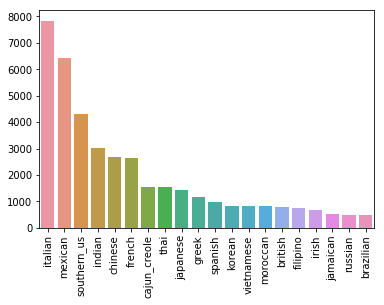

In [28]:
# plotting the distribution
cus = [cu for cu,frq in count_cuisines.most_common()]
freq = [frq for cu,frq in count_cuisines.most_common()]
fbar = sns.barplot(x=cus, y=freq)

for item in fbar.get_xticklabels():
    item.set_rotation(90)

In [30]:
num_ingredients = dict(zip(count_cuisines.keys(),
                           [list() for x in count_cuisines.keys()]))
for recipt in trainrecipts:
    # append the no. in the list
    num_ingredients[recipt['cuisine']].append(len(recipt['ingredients']))
len(num_ingredients)

20

In [58]:
print('Distribution of frequency of ingredients in cusines:')
print()
for cu, frq in num_ingredients.items():
    print('{} \t\t{:.2f} ({:.2f})'.format(cu, np.mean(frq), np.std(frq)))

Distribution of frequency of ingredients in cusines:

greek 		10.18 (3.73)
southern_us 		9.63 (3.87)
filipino 		10.00 (3.85)
indian 		12.71 (5.02)
jamaican 		12.21 (4.76)
spanish 		10.42 (4.16)
italian 		9.91 (3.81)
mexican 		10.88 (4.66)
chinese 		11.98 (4.04)
british 		9.71 (4.16)
thai 		12.55 (4.41)
vietnamese 		12.68 (5.25)
cajun_creole 		12.62 (4.61)
brazilian 		9.52 (5.55)
french 		9.82 (4.14)
japanese 		9.74 (4.24)
irish 		9.30 (3.70)
korean 		11.28 (3.88)
moroccan 		12.91 (4.80)
russian 		10.22 (4.05)


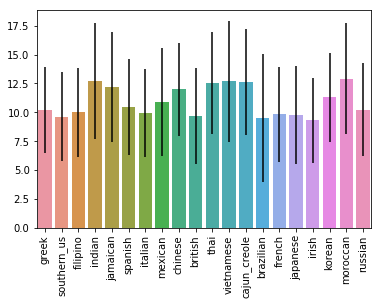

In [62]:
# plotting distribution of no. of ingredients
cus = [cu for cu, frq in num_ingredients.items()]
mean_freq = [np.mean(frq) for cu, frq in num_ingredients.items()]
std_freq = [np.std(frq) for cu, frq in num_ingredients.items()]
fbar = sns.barplot(x=cus, y=mean_freq, yerr=std_freq)

for item in fbar.get_xticklabels():
    item.set_rotation(90)

In [66]:
print("Distribution of Ingredients:")
print("mean:",np.mean(list(count_ingredients.values())))
print("std:",np.std(list(count_ingredients.values())))

Distribution of Ingredients:
mean: 63.7883526958594
std: 388.3270259662557


In [67]:
print(np.median(list(count_ingredients.values())))
print(np.percentile(list(count_ingredients.values()), [25.,50.,75.,99.]))

4.0
[1.00000e+00 4.00000e+00 2.00000e+01 1.15644e+03]


In [69]:
print('Top 15 ingredients: ')
count_ingredients.most_common(15)

Top 15 ingredients: 


[('salt', 18049),
 ('onions', 7972),
 ('olive oil', 7972),
 ('water', 7457),
 ('garlic', 7380),
 ('sugar', 6434),
 ('garlic cloves', 6237),
 ('butter', 4848),
 ('ground black pepper', 4785),
 ('all-purpose flour', 4632),
 ('pepper', 4438),
 ('vegetable oil', 4385),
 ('eggs', 3388),
 ('soy sauce', 3296),
 ('kosher salt', 3113)]

In [70]:
print('Bottom ingredients: ')
count_ingredients.most_common()[-50:]

Bottom ingredients: 


[('tonic water', 1),
 ('Chartreuse Liqueur', 1),
 ('aloe juice', 1),
 ('salt free chili powder', 1),
 ('tofu sour cream', 1),
 ('spicy salami', 1),
 ('Honeysuckle WhiteÂ® Hot Italian Turkey Sausage Links', 1),
 ('chocolate extract', 1),
 ('chocolate graham crackers', 1),
 ('cumberland sausage', 1),
 ('cocktail pumpernickel bread', 1),
 ('chunky tomatoes', 1),
 ("Colman's Mustard Powder", 1),
 ('manouri', 1),
 ('cherry vanilla ice cream', 1),
 ('bone-in ribeye steak', 1),
 ('frozen lemonade concentrate, thawed and undiluted', 1),
 ('flowering chinese chives', 1),
 ('praline topping', 1),
 ('riblets', 1),
 ('puff paste', 1),
 ('Barilla Plus Pasta', 1),
 ('turkey giblet stock', 1),
 ('light chicken stock', 1),
 ('conchiglie', 1),
 ('2% milk shredded mozzarella cheese', 1),
 ('Makers Mark Whisky', 1),
 ('knorr pasta side   cheesi cheddar', 1),
 ('whole grain baguette', 1),
 ('reduced sodium ham', 1),
 ('whole wheat peasant bread', 1),
 ('ranch-style seasoning', 1),
 ('ketjap', 1),
 ('choco

In [71]:
# removing weird symbols
symbols = list()

for recipt in trainrecipts:
    for ing in recipt['ingredients']:
        if re.match("\(|@|\$\?", ing.lower()):
            symbols.append(ing)

In [72]:
print("Length of Symbols: ", len(symbols))

Length of Symbols:  33


In [73]:
count_symbols = collections.Counter(symbols)
count_symbols.most_common(20)

[('(    oz.) tomato sauce', 11),
 ('(   oz.) tomato paste', 9),
 ('(14.5 oz.) diced tomatoes', 3),
 ('(15 oz.) refried beans', 3),
 ('(10 oz.) frozen chopped spinach', 3),
 ('(10 oz.) frozen chopped spinach, thawed and squeezed dry', 2),
 ('(14 oz.) sweetened condensed milk', 2)]

In [145]:
# training the neural network with the raw dataset

sentences = list()

for recipt in trainrecipts:
    clean_recipt = list()
    for ingredient in recipt['ingredients']:
        ingredient = re.sub(r'\(.*oz.\)|crushed|crumbles|ground|minced|powder|chopped|sliced|[0-9][0-9]% |[0-9]% ',
                            '', ingredient)
        clean_recipt.append(ingredient.strip())
    sentences.append(clean_recipt)
len(sentences)

39774

In [146]:
sentences

[['romaine lettuce',
  'black olives',
  'grape tomatoes',
  'garlic',
  'pepper',
  'purple onion',
  'seasoning',
  'garbanzo beans',
  'feta cheese'],
 ['plain flour',
  'pepper',
  'salt',
  'tomatoes',
  'black pepper',
  'thyme',
  'eggs',
  'green tomatoes',
  'yellow corn meal',
  'milk',
  'vegetable oil'],
 ['eggs',
  'pepper',
  'salt',
  'mayonaise',
  'cooking oil',
  'green chilies',
  'grilled chicken breasts',
  'garlic',
  'yellow onion',
  'soy sauce',
  'butter',
  'chicken livers'],
 ['water', 'vegetable oil', 'wheat', 'salt'],
 ['black pepper',
  'shallots',
  'cornflour',
  'cayenne pepper',
  'onions',
  'garlic paste',
  'milk',
  'butter',
  'salt',
  'lemon juice',
  'water',
  'chili',
  'passata',
  'oil',
  'cumin',
  'boneless chicken skinless thigh',
  'garam masala',
  'double cream',
  'natural yogurt',
  'bay leaf'],
 ['plain flour',
  'sugar',
  'butter',
  'eggs',
  'fresh ginger root',
  'salt',
  'cinnamon',
  'milk',
  'vanilla extract',
  'ginger

In [147]:
# NN constants
num_features = 300 # Word vector dimensionality
min_word_count = 3 # 50% of the corpus
num_workers = 4    # No. of CPUs
context = 10       # Contet window size

downsampling = 1e-3 # threshold for configuring which
                    # higher-freq words are downsampled

In [148]:
# Initialize and train the model
model = word2vec.Word2Vec(sentences, workers=num_workers,
                          size=num_features, min_count=min_word_count,
                          window=context, sample=downsampling)
model.init_sims(replace=True)

In [149]:
model.most_similar(u'feta cheese')

C:\Users\shashwat\Anaconda3\envs\opencv\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
C:\Users\shashwat\Anaconda3\envs\opencv\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('kalamata', 0.9461958408355713),
 ('pitted kalamata olives', 0.925977349281311),
 ('olives', 0.9120849370956421),
 ('fresh oregano', 0.9050610661506653),
 ('roasted red peppers', 0.894401490688324),
 ('pita bread rounds', 0.8929075002670288),
 ('greek seasoning', 0.8837371468544006),
 ('capers', 0.8795868754386902),
 ('red wine vinegar', 0.8795298337936401),
 ('plum tomatoes', 0.8780845403671265)]

In [150]:
print(model.wv.similarity('broccoli','bacon'))
print(model.wv.similarity('broccoli','carrots'))
print(model.wv.similarity('broccoli','mushrooms'))

0.37531027
0.64515805
0.79524064


C:\Users\shashwat\Anaconda3\envs\opencv\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [151]:
def similar(a, b, x):
    '''If a is to b then x is to <predict>'''
    predicted = model.wv.most_similar([x,b], [a])[0][0]
    print("{} is to {} as {} is to {}".format(a, b, x, predicted))
    return predicted

In [152]:
similar('pasta', 'tomato sauce', 'basil')

pasta is to tomato sauce as basil is to fresh tomatoes


C:\Users\shashwat\Anaconda3\envs\opencv\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


'fresh tomatoes'

In [153]:
similar('bacon', 'broccoli', 'chicken')

bacon is to broccoli as chicken is to chili paste


C:\Users\shashwat\Anaconda3\envs\opencv\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


'chili paste'

In [154]:
model.wv.most_similar_cosmul(positive=['chili', u'meat'],
                             negative=['tomato sauce'])

[('tamarind pulp', 1.1968668699264526),
 ('tamarind concentrate', 1.1968190670013428),
 ('coconut cream', 1.195248007774353),
 ('coconut oil', 1.191564679145813),
 ('pineapple', 1.1874243021011353),
 ('pork shoulder', 1.1865060329437256),
 ('rice flour', 1.177772879600525),
 ('tamarind paste', 1.177586555480957),
 ('chiles', 1.167351245880127),
 ('cilantro leaves', 1.1603412628173828)]

In [164]:
# building corpus
corpus = sorted(model.wv.vocab.keys())
print(corpus)

['', '7 Up', 'Accent Seasoning', 'Alfredo sauce', 'Amaretti Cookies', 'American cheese', 'Anaheim chile', 'Angostura bitters', 'Asian chili sauce', 'Baileys Irish Cream Liqueur', 'Balsamico Bianco', 'Belgian endive', 'Bengali 5 Spice', 'BertolliÂ® Alfredo Sauce', 'BertolliÂ® Classico Olive Oil', 'Biryani Masala', 'Bisquick Baking Mix', 'Bisquick Original All-Purpose Baking Mix', 'Boston lettuce', 'Bragg Liquid Aminos', 'Burgundy wine', 'California bay leaves', "Campbell's Condensed Cheddar Cheese Soup", "Campbell's Condensed Cream of Chicken Soup", "Campbell's Condensed Tomato Soup", 'Chianti', 'Chinese egg noodles', 'Chinese rice vinegar', 'Chinese rose wine', 'Chinese sesame paste', 'Cholula Hot Sauce', 'Cointreau Liqueur', 'Corn Flakes Cereal', 'Country CrockÂ® Spread', 'Crystal Hot Sauce', 'Daisy Sour Cream', 'Domino Light Brown Sugar', 'Dungeness crabs', 'Dutch-processed cocoa', 'Edam', "Eggland's BestÂ® eggs", 'Emmenthal', 'English muffins', 'English mustard', 'English toffee bit

In [165]:
embedded_tup = tuple([model.wv.__getitem__(w) for w in corpus])

In [166]:
embedded_tup

(array([-0.00525416, -0.03563731, -0.016667  , -0.01492819, -0.0464583 ,
         0.06798783, -0.04447135, -0.00867324, -0.05448086,  0.10355397,
         0.00663679,  0.02752502, -0.01214382,  0.01160992, -0.02607903,
         0.0425867 ,  0.01475957,  0.07664096, -0.01718605,  0.04189016,
         0.03217888, -0.00161756, -0.03229244, -0.00926305, -0.02070887,
         0.00596657, -0.02658476,  0.05291986, -0.02139745, -0.06046339,
        -0.00735754, -0.01898137, -0.01867818,  0.05343448,  0.00174057,
         0.01674488, -0.0204073 ,  0.08982749, -0.03420715,  0.0246556 ,
         0.01963854, -0.00864555, -0.024912  , -0.02012281,  0.05501337,
        -0.04625742,  0.01666262, -0.10161647, -0.06855121,  0.00973733,
        -0.13446845, -0.05522917, -0.0092975 , -0.03800901, -0.0074721 ,
        -0.04372711,  0.02454816,  0.02546588, -0.06988371,  0.06714958,
        -0.00539489,  0.0313483 ,  0.08941501, -0.04335806,  0.06316035,
        -0.09692797,  0.07639708, -0.08463358,  0.1

In [167]:
# embedded tuple
X = np.vstack(embedded_tup)

In [169]:
# t-SNE
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

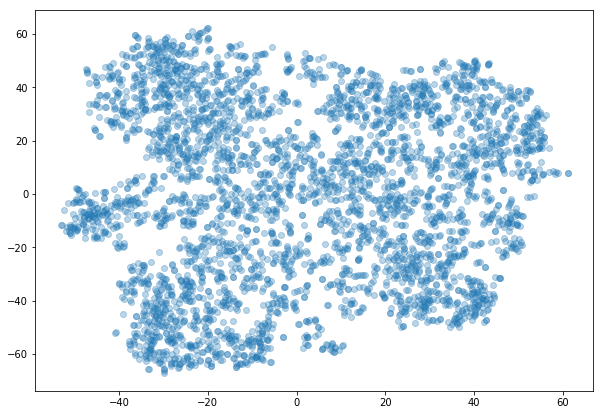

In [175]:
plt.figure(figsize=(10, 7))
plt.scatter(X_tsne[:,0], X_tsne[:,1], alpha=0.3)

In [176]:
# labelling a ingredient by frequency
track_ing = dict(zip(count_cuisines.keys(), [list() for x in count_cuisines.keys()]))

In [177]:
for recipt in trainrecipts:
    clean_recipt = list()
    for ingredient in recipt['ingredients']:
        ingredient = re.sub(r'\(.*oz.\)|crushed|crumbles|ground|minced|powder|chopped|sliced|[0-9][0-9]% |[0-9]% ',
                            '', ingredient)
        clean_recipt.append(ingredient.strip())
    track_ing[recipt['cuisine']].extend(clean_recipt)

In [232]:
for label, tracking in track_ing.items():
    track_ing[label] = collections.Counter(tracking)

In [238]:
def return_most_popular(v):
    cuisine = None
    record = 0
    for label, tracking in track_ing.items():
        norm_freq = float(tracking[v]) / float(count_cuisines[label])
        if norm_freq > record:
            cuisine = label
            record = norm_freq
        print(cuisine)
    return cuisine

In [239]:
 track_2color = {u'irish':"#000000", # black
                u'mexican':"#FFFF00", # yellow
                u'chinese':"#1CE6FF", # cyan
                u'filipino': "#FF34FF", # pink 
                u'vietnamese':"#FF4A46", # red
                u'spanish':"#FFC300",  # green forest
                u'japanese':"#006FA6", # ocean blue
                u'moroccan':"#A30059",# purple
                u'french':"#FFDBE5",  # light pink
                u'greek': "#7A4900",  # golden brown 
                u'indian':"#0000A6", # blue electric 
                u'jamaican':"#63FFAC", # green phospho
                u'british': "#B79762", # brown
                u'brazilian': "#EEC3FF", # light purple
                u'russian':"#8FB0FF", # light blue 
                u'cajun_creole':"#997D87", #violet
                u'thai':"#5A0007",  # dark maroon
                u'southern_us':"#809693", # greyish aqua-marine
                u'korean':"#FEFFE6", # light yellow
                u'italian':"#1B4400"} # dark green

In [240]:
color_vector = list()
for v in corpus:
    cuisine = return_most_popular(v)
    color_vector.append(track_2color[cuisine])

None
None
None
None
None
None
italian
mexican
mexican
british
british
british
british
british
british
british
british
british
british
british
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
southern_us
filipino
filipino
filipino
filipino
filipino
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
filipino
filipino
filipino
spanish
spani

british
british
british
british
None
southern_us
southern_us
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
None
None
None
jamaican
jamaican
jamaican
jamaican
chinese
chinese
chinese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
None
None
indian
indian
indian
indian
indian
indian
indian
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
None
None
None
indian
indian
indian
indian
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
british
british
british
british
british
british
british
british
british
british
british
None
None
None
None
None
None
None
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
southern_us
southern_us

italian
italian
italian
italian
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
None
None
None
None
spanish
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
moroccan
moroccan
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
french
french
french
french
french
french
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
filipino
filipino
filipino
filipino
filipi

vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
greek
greek
filipino
indian
indian
spanish
spanish
spanish
spanish
spanish
spanish
spanish
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
greek
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
None
None
None
None
None
italian
italian
italian
italian
thai
thai
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
southern_us
southern_us
southern_us
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
None
None
None
None
None
None
None
None
chinese
chinese
chinese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
None
None

italian
italian
italian
italian
italian
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
japanese
japanese
japanese
japanese
russian
None
None
None
None
None
None
italian
italian
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
None
southern_us
southern_us
southern_us
southern_us
southern_us
italian
italian
italian
italian
italian
italian
italian
italian
french
french
french
french
french
french
greek
southern_us
filipino
indian
indian
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
russian
greek
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
None
None
filipino
filipino
filipino
filipino
filipino
filipino
chinese
chinese
chinese
chinese
chinese
chinese
chinese
ch

southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
greek
southern_us
southern_us
indian
jamaican
jamaican
italian
italian
italian
italian
thai
thai
thai
thai
thai
thai
thai
thai
moroccan
moroccan
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
irish
irish
irish
irish
greek
greek
greek
indian
indian
spanish
italian
italian
chinese
british
british
british
british
british
british
british
british
british
british
british
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
irish
irish
irish
irish
None
None
filipino
fil

spanish
spanish
spanish
spanish
moroccan
moroccan
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
greek
greek
greek
greek
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
None
southern_us
southern_us
southern_us
southern_us
southern_us
italian
italian
italian
italian
italian
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
greek
greek
greek
greek
greek
greek
greek
greek
greek
british
british
british
british
british
british
british
british
briti

jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
greek
greek
greek
greek
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
french
japanese
japanese
japanese
japanese
japanese
None
None
None
None
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
None
southern_us
filipino
filipino
jamaican
jamaican
jamaican
jamaican
jamaican
british
british
british
british
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
french
french
french
french
french
french
None
None
None
None
None
None
italian
mexican
mexican
mexican
mexican
mexican
mexican
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
None
None
None
None
None
None
italian
mexican
mexican
mexican
mexi

mexican
mexican
mexican
mexican
mexican
mexican
mexican
greek
southern_us
filipino
indian
indian
indian
indian
indian
chinese
chinese
chinese
chinese
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
greek
southern_us
filipino
filipino
filipino
spanish
spanish
spanish
chinese
chinese
thai
vietnamese
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
None
None
None
None
None
italian
italian
italian
italian
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
greek
greek
filipino
filipino
filipino
filipino
filipino
filipino
chinese
chinese
chinese
chinese
cajun_cr

indian
indian
indian
indian
indian
indian
indian
indian
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
russian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
mexican
mexican
british
british
british
cajun_creole
cajun_creole
cajun_creole
cajun_creole
irish
irish
irish
irish
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
british
british
british
british
british
british
british
british
british
british
british
greek
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
None
None
None
None
None
None
italian
mexican
mexican
mexican
mexican
mexican
mexican
mexican
french
french
french
french
french
french
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
souther

vietnamese
vietnamese
french
french
french
french
french
french
None
None
None
indian
indian
indian
indian
indian
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
cajun_creole
cajun_creole
french
french
french
french
french
french
None
None
None
None
None
None
None
None
None
None
None
None
None
None
french
french
french
french
french
french
None
None
None
None
None
spanish
spanish
spanish
spanish
british
british
british
british
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
None
None
None
indian
jamaican
jamaican
jamaican
jamaican
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese

southern_us
southern_us
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
greek
greek
greek
greek
greek
greek
greek
mexican
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
korean
korean
korean
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
korean
korean
korean
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
french
french
french
french
french
french
None
None
None
indian
indian
indian
indian
mexican
mexican
mexican
mexican
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
greek
greek
greek
greek
greek
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
japanese
japanese
korean
korean
korean
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
gr

southern_us
southern_us
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
None
southern_us
southern_us
indian
indian
spanish
spanish
spanish
spanish
british
british
british
british
british
british
british
british
british
british
british
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
greek
southern_us
filipino
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
ch

italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
brazilian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
irish
irish
irish
irish
greek
greek
greek
greek
greek
spanish
spanish
spanish
spanish
spanish
spanish
spani

jamaican
jamaican
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
greek
southern_us
filipino
filipino
filipino
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
korean
korean
korean
None
None
None
None
None
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
greek
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
None
None
None
None
None
None
mexican
mexican
mexican
mexican
mexican
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
southern_us
southern_us
southern_us
southern_us
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
s

british
british
british
british
british
british
british
irish
irish
irish
irish
greek
greek
greek
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
moroccan
moroccan
None
None
None
None
None
None
None
None
None
None
None
None
None
None
french
french
french
french
moroccan
moroccan
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
moroccan
moroccan
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
irish
irish
moroccan
moroccan
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
french
french
irish
irish
moroccan
moroccan
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
irish
irish
irish
irish
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
irish
irish
moroccan
moroccan
None
southern_us
southern_us


indian
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
greek
greek
greek
greek
greek
greek
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
None
None
None
None
None
italian
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
irish
irish
irish
irish
None
None
None
None
None
None
None
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
vietnamese
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
russian
greek
southern_us
souther

chinese
chinese
chinese
chinese
chinese
chinese
chinese
japanese
japanese
japanese
japanese
japanese
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
japanese
japanese
japanese
japanese
japanese
None
None
None
None
None
None
italian
italian
chinese
chinese
thai
thai
thai
thai
thai
japanese
japanese
japanese
japanese
japanese
None
None
None
indian
indian
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
moroccan
moroccan
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
japanese
japanese
japanese
japanese
japanese
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
india

greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
french
french
french
french
french
french
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
moroccan
moroccan
None
None
None
None
None
None
None
mexican
chinese
chinese
chinese
chinese
cajun_creole
cajun_creole
cajun_creole
japanese
irish
korean
korean
korean
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
chinese
chinese
chinese
chinese
chinese
chinese
chines

jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
None
southern_us
filipino
filipino
filipino
filipino
filipino
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
None
None
None
None
None
None
italian
mexican
mexican
british
british
british
british
british
british
british
british
british
british
british
None
None
None
None
None
None
None
None
chinese
chinese
thai
thai
thai
thai
thai
thai
thai
korean
korean
korean
greek
greek
greek
greek
greek
greek
greek
greek
chinese
chinese
chinese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
southern_us
southern_us
indian
indian
indian
indian
in

southern_us
chinese
chinese
chinese
chinese
chinese
chinese
chinese
japanese
japanese
japanese
japanese
japanese
greek
greek
filipino
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
irish
irish
irish
irish
None
None
None
None
None
None
None
None
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
None
None
None
None
None
None
italian
mexican
mexican
mexican
mexican
mexican
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
greek
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
None
southern_us
southern_us
southern_us
southern_us
southern_us
italian
italian
italian
british
british
british
british
british
british
british
british
british
british
british
None
None
None
None
No

italian
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
southern_us
southern_us
southern_us
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
irish
irish
irish
irish
None
None
None
None
None
None
None
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
None
None
None
None
None
italian
italian
italian
italian
italian
italian
italian
italian
french
french
french
french
french
french
None
None
None
None
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
None
None
None
None
None
None
mexican
mexican
mexican
mexican
mexican
mexica

italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
italian
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
japanese
japanese
japanese
japanese
japanese
greek
greek
filipino
indian
indian
indian
indian
indian
indian
indian
thai
thai
thai
brazilian
french
japanese
japanese
japanese
japanese
japanese
None
None
None
None
None
None
None
None
None
None
None
None
None
None
french
japanese
japanese
japanese
japanese
japanese
None
None
filipino
filipino
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
japanese
japanese
japanese
japanese
japanese
None
southern_us
southern_us
southern_us
jamaican
spanish
spanish
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
southern_us
southern_us
southern_us
italian
mexican
mexican
mexican
m

southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
french
french
french
french
french
french
None
None
None
indian
indian
indian
italian
mexican
mexican
mexican
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
greek
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
thai
thai
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
greek
greek
greek
greek
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
jamaican
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filip

filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
filipino
filipino
filipino
filipino
italian
italian
italian
italian
italian
italian
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
cajun_creole
None
southern_us
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
filipino
None
None
None
None
None
None
None
mexican
chinese
chinese
thai
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
southern

indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
british
british
british
british
british
british
british
british
british
british
british
greek
greek
greek
greek
greek
greek
greek
greek
greek
british
british
british
british
british
british
british
british
british
british
british
None
None
None
None
None
None
None
None
None
None
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
None
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
southern_us
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnames

indian
indian
indian
indian
chinese
chinese
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
None
None
None
None
None
None
italian
italian
italian
british
british
british
british
british
british
british
british
british
british
british
None
None
None
None
None
None
None
None
None
None
thai
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
greek
russian
None
None
None
None
None
None
italian
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
indian
indian
indian
indian
indian
chinese
chinese
thai
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
vietnamese
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
None
None
indian
indian

filipino
filipino
filipino
filipino
filipino
filipino
british
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
greek
southern_us
filipino
indian
jamaican
jamaican
jamaican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
mexican
None
southern_us
southern_us
southern_us
southern_us
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
spanish
greek
southern_us
southern_us
southern_us
jamaican
jamaican
jamaican
jamaican
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
chinese
None
southern_us
southern_us
indian
indian
indian
indian
indian
chinese
chinese
thai
thai
thai
thai
thai
thai
thai
thai
thai
thai
None
None
None
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
indian
None
None
None
None
None
None
None
None
chinese
chinese
chinese
vietnamese
vietnamese
vietnamese
vietnamese
viet

In [229]:
# ensemble the legend
lgend = list()
for l,c in track_2color.items():
    lgend.append(mpatches.Patch(color=c, label=l))

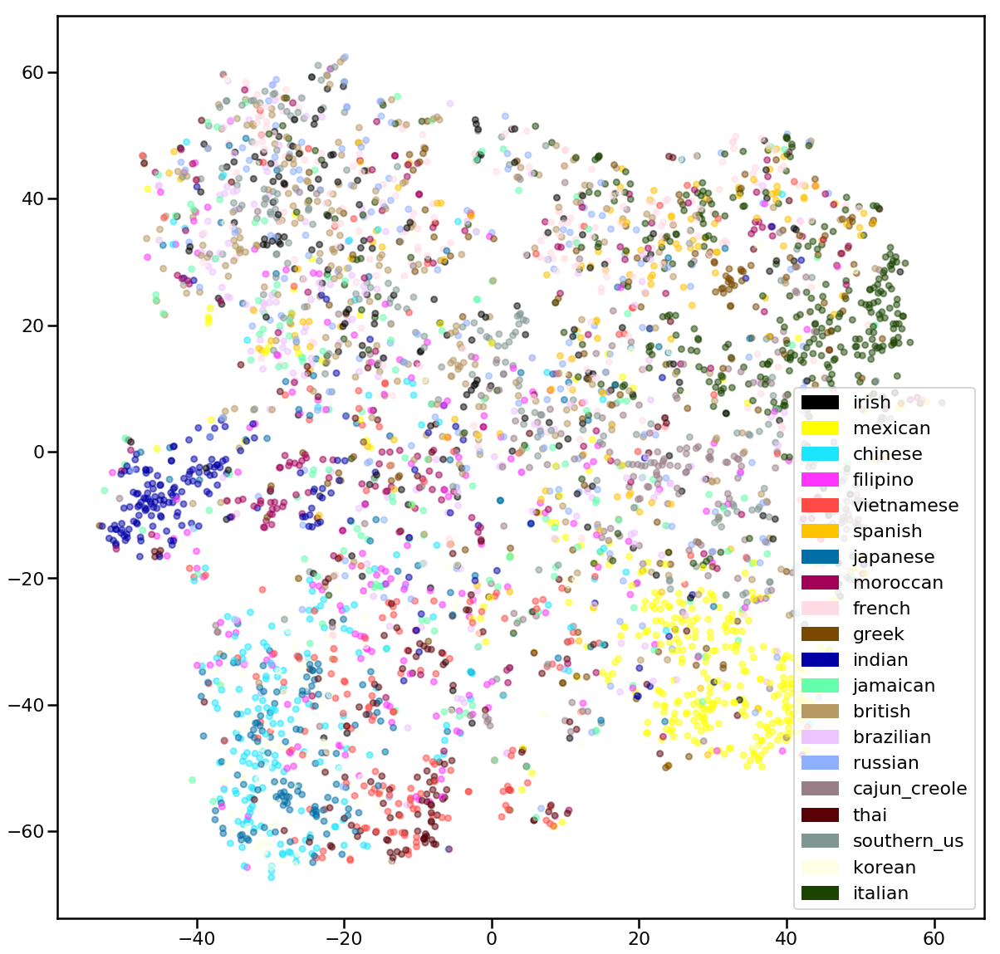

In [244]:
sns.set_context("poster")
fig, ax = plt.subplots(figsize=(20, 20))
plt.scatter(X_tsne[:,0], X_tsne[:,1],
            c=color_vector, alpha=0.5, s=50)
plt.legend(handles=lgend)